In [10]:
run_gridsearch = True
skip_best_model_train = False
hyperparam_csv_file = "CV_guerneville_hourly_hyperparams.csv"

In [11]:
import sys
import os
import itertools
import pandas as pd
current_dir = os.getcwd()
print(current_dir)

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all


In [12]:
library_path = os.path.join('..', '..', '..','..','UCB-USACE-LSTMs')
sys.path.insert(0, library_path)
print(sys.path)

['..\\..\\..\\..\\UCB-USACE-LSTMs', '..\\..\\..\\..\\UCB-USACE-LSTMs', 'c:\\Users\\arman\\AppData\\Local\\Programs\\Python\\Python311\\python311.zip', 'c:\\Users\\arman\\AppData\\Local\\Programs\\Python\\Python311\\Lib', 'c:\\Users\\arman\\AppData\\Local\\Programs\\Python\\Python311\\DLLs', '', 'C:\\Users\\arman\\AppData\\Roaming\\Python\\Python311\\site-packages', 'C:\\Users\\arman\\AppData\\Roaming\\Python\\Python311\\site-packages\\win32', 'C:\\Users\\arman\\AppData\\Roaming\\Python\\Python311\\site-packages\\win32\\lib', 'C:\\Users\\arman\\AppData\\Roaming\\Python\\Python311\\site-packages\\Pythonwin', 'c:\\Users\\arman\\AppData\\Local\\Programs\\Python\\Python311', 'c:\\Users\\arman\\AppData\\Local\\Programs\\Python\\Python311\\Lib\\site-packages', 'c:\\Users\\arman\\ucb-usace-lstm\\UCB-USACE-LSTMs\\UCB_training\\models\\guerneville_all\\..\\..\\..\\..\\UCB-USACE-LSTMs', 'c:\\Users\\arman\\ucb-usace-lstm\\UCB-USACE-LSTMs\\UCB_training\\models\\guerneville_all\\..\\..\\..\\..\\UCB-

In [13]:
from pathlib import Path
from neuralhydrology.evaluation.metrics import *
from UCB_training.UCB_train import UCB_trainer
from UCB_training.UCB_utils import combinedPlot
from UCB_training.UCB_utils import fancyCombinedPlot
from UCB_training.UCB_utils import combinedPlotFromDf
from UCB_training.UCB_utils import fancyCombinedPlotFromDf

In [14]:
current_path = os.getcwd()
library_path = current_path.split('UCB-USACE-LSTMs')[0] + 'UCB-USACE-LSTMs'

target_path = os.path.join(library_path, 'UCB_training', 'models', 'guerneville_all')

if os.path.exists(target_path):
    os.chdir(target_path)
    print("Current Working Directory:", os.getcwd())
    print("Train Basin File Exists:", os.path.exists("guerneville")) 
else:
    print(f"Error: The target path '{target_path}' does not exist.")

Current Working Directory: c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all
Train Basin File Exists: True


In [15]:
path_to_csv = Path(library_path +'/russian_river_data')
path_to_yaml = Path("guerneville_gage_nlayer.yaml")
path_to_physics_data = Path(library_path + "/russian_river_data/Guerneville_hourly.csv")

In [16]:
features_with_physics = [
    "BIG SULPHUR CR ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "DRY CREEK 10 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "EF RUSSIAN 20 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "GREEN VALLEY ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "LAGUNA ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "RUSSIAN 20 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "RUSSIAN 30 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "RUSSIAN 40 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "RUSSIAN 50 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "RUSSIAN 60 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "RUSSIAN 70 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "SANTA ROSA CR 10 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "SANTA ROSA CR 20 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "WF RUSSIAN ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "BIG SULPHUR CR PRECIP-INC SCREENED",
    "DRY CREEK 10 PRECIP-INC SCREENED",
    "EF RUSSIAN 20 PRECIP-INC SCREENED",
    "GREEN VALLEY PRECIP-INC SCREENED",
    "LAGUNA PRECIP-INC SCREENED",
    "RUSSIAN 20 PRECIP-INC SCREENED",
    "RUSSIAN 30 PRECIP-INC SCREENED",
    "RUSSIAN 40 PRECIP-INC SCREENED",
    "RUSSIAN 50 PRECIP-INC SCREENED",
    "RUSSIAN 60 PRECIP-INC SCREENED",
    "RUSSIAN 70 PRECIP-INC SCREENED",
    "SANTA ROSA CR 10 PRECIP-INC SCREENED",
    "SANTA ROSA CR 20 PRECIP-INC SCREENED",
    "WF RUSSIAN PRECIP-INC SCREENED",
    "UKIAH CA HUMIDITY USAF-NOAA",
    "UKIAH CA SOLAR RADIATION USAF-NOAA",
    "UKIAH CA TEMPERATURE USAF-NOAA",
    "UKIAH CA WINDSPEED USAF-NOAA",
    "SANTA ROSA CA HUMIDITY USAF-NOAA",
    "SANTA ROSA CA SOLAR RADIATION USAF-NOAA",
    "SANTA ROSA CA TEMPERATURE USAF-NOAA",
    "SANTA ROSA CA WINDSPEED USAF-NOAA",
    "UKIAH CA FLOW USGS-MERGED",
    "GEYSERVILLE CA FLOW USGS-MERGED",
    "Guerneville Gage FLOW",
    "Big Sulphur Cr ET-POTENTIAL",
    "Big Sulphur Cr FLOW",
    "Big Sulphur Cr FLOW-BASE",
    "Big Sulphur Cr INFILTRATION",
    "Big Sulphur Cr PERC-SOIL",
    "Big Sulphur Cr SATURATION FRACTION",
    "Dry Creek 10 ET-POTENTIAL",
    "Dry Creek 10 FLOW",
    "Dry Creek 10 FLOW-BASE",
    "Dry Creek 10 INFILTRATION",
    "Dry Creek 10 PERC-SOIL",
    "Dry Creek 10 SATURATION FRACTION",
    "Green Valley ET-POTENTIAL",
    "Green Valley FLOW",
    "Green Valley FLOW-BASE",
    "Green Valley INFILTRATION",
    "Green Valley PERC-SOIL",
    "Green Valley SATURATION FRACTION",
    "Laguna ET-POTENTIAL",
    "Laguna FLOW",
    "Laguna FLOW-BASE",
    "Laguna INFILTRATION",
    "Laguna PERC-SOIL",
    "Laguna SATURATION FRACTION",
    "Russian 20 ET-POTENTIAL",
    "Russian 20 FLOW",
    "Russian 20 FLOW-BASE",
    "Russian 20 INFILTRATION",
    "Russian 20 PERC-SOIL",
    "Russian 20 SATURATION FRACTION",
    "Russian 30 ET-POTENTIAL",
    "Russian 30 FLOW",
    "Russian 30 FLOW-BASE",
    "Russian 30 INFILTRATION",
    "Russian 30 PERC-SOIL",
    "Russian 30 SATURATION FRACTION",
    "Russian 40 ET-POTENTIAL",
    "Russian 40 FLOW",
    "Russian 40 FLOW-BASE",
    "Russian 40 INFILTRATION",
    "Russian 40 PERC-SOIL",
    "Russian 40 SATURATION FRACTION",
    "Russian 50 ET-POTENTIAL",
    "Russian 50 FLOW",
    "Russian 50 FLOW-BASE",
    "Russian 50 INFILTRATION",
    "Russian 50 PERC-SOIL",
    "Russian 50 SATURATION FRACTION",
    "Russian 60 ET-POTENTIAL",
    "Russian 60 FLOW",
    "Russian 60 FLOW-BASE",
    "Russian 60 INFILTRATION",
    "Russian 60 PERC-SOIL",
    "Russian 60 SATURATION FRACTION",
    "Russian 70 ET-POTENTIAL",
    "Russian 70 FLOW",
    "Russian 70 FLOW-BASE",
    "Russian 70 INFILTRATION",
    "Russian 70 PERC-SOIL",
    "Russian 70 SATURATION FRACTION",
    "Santa Rosa Cr 10 ET-POTENTIAL",
    "Santa Rosa Cr 10 FLOW",
    "Santa Rosa Cr 10 FLOW-BASE",
    "Santa Rosa Cr 10 INFILTRATION",
    "Santa Rosa Cr 10 PERC-SOIL",
    "Santa Rosa Cr 10 SATURATION FRACTION",
    "Santa Rosa Cr 20 ET-POTENTIAL",
    "Santa Rosa Cr 20 FLOW",
    "Santa Rosa Cr 20 FLOW-BASE",
    "Santa Rosa Cr 20 INFILTRATION",
    "Santa Rosa Cr 20 PERC-SOIL",
    "Santa Rosa Cr 20 SATURATION FRACTION",
    "WF Russian ET-POTENTIAL",
    "WF Russian FLOW",
    "WF Russian FLOW-BASE",
    "WF Russian INFILTRATION",
    "WF Russian PERC-SOIL",
    "WF Russian SATURATION FRACTION"
]


In [17]:
hyperparam_space = {
    "hidden_size": [64, 128, 256],
    "seq_length": [90, 168, 336],
    "num_layers": [1],
    "epochs": [16, 32]
}
fixed_dropout = 0.4
no_physics_results = []
physics_results = []

In [18]:
if run_gridsearch or not os.path.exists(hyperparam_csv_file):
    for (hs, seq, nl, ep) in itertools.product(
            hyperparam_space["hidden_size"],
            hyperparam_space["seq_length"],
            hyperparam_space["num_layers"],
            hyperparam_space["epochs"]
    ):
        hp = {
            "hidden_size": hs,
            "seq_length": seq,
            "num_layers": nl,
            "epochs": ep,
            "output_dropout": fixed_dropout,
        }
        print(f"NoPhysics: {hp}")
        trainer = UCB_trainer(
            path_to_csv_folder=path_to_csv,
            yaml_path=path_to_yaml,
            hyperparams=hp,
            input_features=None,
            physics_informed=False,
            physics_data_file=None,
            hourly=True,
            extend_train_period=False,
            gpu=0
        )
        metrics_dict = trainer.cross_validate()
        row_data = {"hidden_size": hs, "seq_length": seq, "num_layers": nl, "epochs": ep, "output_dropout": fixed_dropout}
        for k, v in metrics_dict.items():
            row_data[k] = v
        no_physics_results.append(row_data)
    df_no_physics = pd.DataFrame(no_physics_results)
    df_no_physics.sort_values(by="avg NSE", ascending=False, inplace=True)
    df_no_physics.reset_index(drop=True, inplace=True)
else:
    print("Skipping Grid-Search")

NoPhysics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
2025-03-13 08:58:59,336: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_085859\output.log initialized.
2025-03-13 08:58:59,337: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_085859
2025-03-13 08:58:59,338: ### Run configurations for testing_run
2025-03-13 08:58:59,338: experiment_name: testing_run
2025-03-13 08:58:59,339: train_basin_file: guerneville
2025-03-13 08:58:59,340: validation_basin_file: guerneville
2025-03-13 08:58:59,340: test_basin_file: guerneville
2025-03-13 08:58:59,341: train_start_date: 1994-10-01 00:00:00
2025-03-13 08:58:59,341: train_end_date: 1996-10-01 00:00:00
2025-03-13 08:58:59,342: validation_start_date: 1996-10-02 00:00:00
2025-03-13 08:58:59,343: validation_end_date: 1997-10-01 00:00:00
2025-03-13 08

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:03<00:00,  3.15s/it]
2025-03-13 08:59:17,573: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_085859\validation\model_epoch016\validation_metrics.csv
2025-03-13 08:59:17,575: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_085859\validation\model_epoch016\validation_results.p
2025-03-13 08:59:17,640: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_085859\testing_run_1303_085917\output.log initialized.
2025-03-13 08:59:17,641: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_085859\testing_run_1303_085917
2025-03-13 08:59:17,641: ### Run configurations for testing_run
2025-03-13 08:59:17,642: experiment_name: testing_run
2025-03-13 08:59:17,642: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.51s/it]
2025-03-13 08:59:19,214: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 249.16it/s]
2025-03-13 08:59:19,256: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:01<00:00, 75.28it/s, Loss: 0.0000]
2025-03-13 08:59:21,155: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:01<00:00, 82.08it/s, Loss: 0.0000]
2025-03-13 08:59:22,509: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:01<00:00, 82.16it/s, Loss: 0.0000]
2025-03-13 08:59:23,863: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:01<00:00, 72.08it/s, Loss: 0.0000]
2025-03-13 08:59:25,406: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:01<00:00, 71.15it/s, Loss: 0.0000]
2025-03-13 08:59:26,969: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]
2025-03-13 08:59:49,522: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_085859\testing_run_1303_085917\validation\model_epoch016\validation_metrics.csv
2025-03-13 08:59:49,523: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_085859\testing_run_1303_085917\validation\model_epoch016\validation_results.p
2025-03-13 08:59:49,587: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_085859\testing_run_1303_085917\testing_run_1303_085949\output.log initialized.
2025-03-13 08:59:49,588: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_085859\testing_run_1303_085917\testing_run_1303_085949
2025-03-13 08:59:49,588: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.58s/it]
2025-03-13 08:59:51,244: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.72it/s]
2025-03-13 08:59:51,293: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:02<00:00, 66.82it/s, Loss: 0.0000]
2025-03-13 08:59:54,521: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:02<00:00, 72.93it/s, Loss: 0.0000]
2025-03-13 08:59:56,992: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:02<00:00, 71.63it/s, Loss: 0.0000]
2025-03-13 08:59:59,508: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:02<00:00, 74.20it/s, Loss: 0.0000]
2025-03-13 09:00:01,937: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:02<00:00, 72.07it/s, Loss: 0.0000]
2025-03-13 09:00:04,437: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]
2025-03-13 09:00:37,233: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_085859\testing_run_1303_085917\testing_run_1303_085949\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:00:37,235: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_085859\testing_run_1303_085917\testing_run_1303_085949\validation\model_epoch016\validation_results.p
2025-03-13 09:00:37,299: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_085859\testing_run_1303_085917\testing_run_1303_085949\testing_run_1303_090037\output.log initialized.
2025-03-13 09:00:37,300: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_085859\testing_run_1303_085917\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.64s/it]
2025-03-13 09:00:38,997: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 253.40it/s]
2025-03-13 09:00:39,050: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:03<00:00, 74.60it/s, Loss: 0.0000]
2025-03-13 09:00:43,017: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:03<00:00, 76.37it/s, Loss: 0.0000]
2025-03-13 09:00:46,266: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:03<00:00, 73.03it/s, Loss: 0.0000]
2025-03-13 09:00:49,665: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:03<00:00, 71.96it/s, Loss: 0.0000]
2025-03-13 09:00:53,116: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:03<00:00, 70.46it/s, Loss: 0.0000]
2025-03-13 09:00:56,638: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]
2025-03-13 09:01:39,590: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_085859\testing_run_1303_085917\testing_run_1303_085949\testing_run_1303_090037\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:01:39,592: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_085859\testing_run_1303_085917\testing_run_1303_085949\testing_run_1303_090037\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.8359755426645279, 'MSE': 12427916.0, 'RMSE': 3525.3249495613877, 'KGE': 0.7552526867209123, 'Alpha-NSE': 0.7988587617874146, 'Beta-KGE': 1.1166975498199463, 'Beta-NSE': 0.04030889645218849, 'Pearson-r': 0.9236774508178546, 'FHV': -21.698087453842163, 'FMS': -20.812380484049925, 'FLV': -1519.927408325101, 'Peak-Timing': nan, 'Peak-MAPE': 36.020803451538086}


Fold 2

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.37s/it]
2025-03-13 09:01:41,063: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.66it/s]
2025-03-13 09:01:41,094: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:00<00:00, 58.05it/s, Loss: 0.0000]
2025-03-13 09:01:42,098: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 87.13it/s, Loss: 0.0000]
2025-03-13 09:01:42,605: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 86.14it/s, Loss: 0.0000]
2025-03-13 09:01:43,119: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 80.51it/s, Loss: 0.0000]
2025-03-13 09:01:43,668: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 76.47it/s, Loss: 0.0000]
2025-03-13 09:01:44,244: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]
2025-03-13 09:02:07,382: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090139\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:02:07,383: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090139\validation\model_epoch032\validation_results.p
2025-03-13 09:02:07,441: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090139\testing_run_1303_090207\output.log initialized.
2025-03-13 09:02:07,442: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090139\testing_run_1303_090207
2025-03-13 09:02:07,443: ### Run configurations for testing_run
2025-03-13 09:02:07,443: experiment_name: testing_run
2025-03-13 09:02:07,444: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.43s/it]
2025-03-13 09:02:08,922: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.65it/s]
2025-03-13 09:02:08,960: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:01<00:00, 73.48it/s, Loss: 0.0000]
2025-03-13 09:02:10,851: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:01<00:00, 68.27it/s, Loss: 0.0000]
2025-03-13 09:02:12,480: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:01<00:00, 72.87it/s, Loss: 0.0000]
2025-03-13 09:02:14,005: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:01<00:00, 72.61it/s, Loss: 0.0000]
2025-03-13 09:02:15,535: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:01<00:00, 71.74it/s, Loss: 0.0000]
2025-03-13 09:02:17,084: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]
2025-03-13 09:03:05,709: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090139\testing_run_1303_090207\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:03:05,711: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090139\testing_run_1303_090207\validation\model_epoch032\validation_results.p
2025-03-13 09:03:05,775: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090139\testing_run_1303_090207\testing_run_1303_090305\output.log initialized.
2025-03-13 09:03:05,776: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090139\testing_run_1303_090207\testing_run_1303_090305
2025-03-13 09:03:05,776: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.57s/it]
2025-03-13 09:03:07,394: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.65it/s]
2025-03-13 09:03:07,440: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:02<00:00, 73.54it/s, Loss: 0.0000]
2025-03-13 09:03:10,591: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:02<00:00, 75.66it/s, Loss: 0.0000]
2025-03-13 09:03:12,975: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:02<00:00, 73.54it/s, Loss: 0.0000]
2025-03-13 09:03:15,427: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:02<00:00, 74.78it/s, Loss: 0.0000]
2025-03-13 09:03:17,836: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:02<00:00, 73.75it/s, Loss: 0.0000]
2025-03-13 09:03:20,279: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]
2025-03-13 09:04:34,996: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090139\testing_run_1303_090207\testing_run_1303_090305\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:04:34,997: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090139\testing_run_1303_090207\testing_run_1303_090305\validation\model_epoch032\validation_results.p
2025-03-13 09:04:35,058: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090139\testing_run_1303_090207\testing_run_1303_090305\testing_run_1303_090435\output.log initialized.
2025-03-13 09:04:35,058: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090139\testing_run_1303_090207\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.65s/it]
2025-03-13 09:04:36,766: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.71it/s]
2025-03-13 09:04:36,819: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:03<00:00, 76.90it/s, Loss: 0.0000]
2025-03-13 09:04:40,893: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:03<00:00, 73.06it/s, Loss: 0.0000]
2025-03-13 09:04:44,290: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:03<00:00, 75.75it/s, Loss: 0.0000]
2025-03-13 09:04:47,566: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:03<00:00, 72.59it/s, Loss: 0.0000]
2025-03-13 09:04:50,986: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:03<00:00, 70.10it/s, Loss: 0.0000]
2025-03-13 09:04:54,527: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.94s/it]
2025-03-13 09:06:35,403: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090139\testing_run_1303_090207\testing_run_1303_090305\testing_run_1303_090435\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:06:35,405: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090139\testing_run_1303_090207\testing_run_1303_090305\testing_run_1303_090435\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.7798412442207336, 'MSE': 16681138.0, 'RMSE': 4084.254889205619, 'KGE': 0.7637906846996246, 'Alpha-NSE': 0.8594499826431274, 'Beta-KGE': 1.1510441303253174, 'Beta-NSE': 0.0521727092564106, 'Pearson-r': 0.8849947655542432, 'FHV': -18.95306557416916, 'FMS': -20.26459605829193, 'FLV': -1328.5634827941535, 'Peak-Timing': nan, 'Peak-MAPE': 34.185632069905594}


Fold 2 re

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.34s/it]
2025-03-13 09:06:36,857: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.66it/s]
2025-03-13 09:06:36,891: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:00<00:00, 48.72it/s, Loss: 0.0000]
2025-03-13 09:06:38,325: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 69.54it/s, Loss: 0.0000]
2025-03-13 09:06:38,960: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 72.05it/s, Loss: 0.0000]
2025-03-13 09:06:39,574: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 66.44it/s, Loss: 0.0000]
2025-03-13 09:06:40,239: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 67.37it/s, Loss: 0.0000]
2025-03-13 09:06:40,896: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]
2025-03-13 09:06:53,371: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090635\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:06:53,375: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090635\validation\model_epoch016\validation_results.p
2025-03-13 09:06:53,437: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090635\testing_run_1303_090653\output.log initialized.
2025-03-13 09:06:53,437: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090635\testing_run_1303_090653
2025-03-13 09:06:53,438: ### Run configurations for testing_run
2025-03-13 09:06:53,438: experiment_name: testing_run
2025-03-13 09:06:53,439: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.43s/it]
2025-03-13 09:06:54,913: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 252.50it/s]
2025-03-13 09:06:54,969: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:01<00:00, 62.04it/s, Loss: 0.0000]
2025-03-13 09:06:57,254: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:01<00:00, 65.39it/s, Loss: 0.0000]
2025-03-13 09:06:58,955: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:01<00:00, 66.03it/s, Loss: 0.0000]
2025-03-13 09:07:00,639: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:01<00:00, 64.58it/s, Loss: 0.0000]
2025-03-13 09:07:02,361: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:01<00:00, 58.64it/s, Loss: 0.0000]
2025-03-13 09:07:04,256: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]
2025-03-13 09:07:28,461: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090635\testing_run_1303_090653\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:07:28,463: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090635\testing_run_1303_090653\validation\model_epoch016\validation_results.p
2025-03-13 09:07:28,526: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090635\testing_run_1303_090653\testing_run_1303_090728\output.log initialized.
2025-03-13 09:07:28,527: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090635\testing_run_1303_090653\testing_run_1303_090728
2025-03-13 09:07:28,528: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.53s/it]
2025-03-13 09:07:30,110: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 331.17it/s]
2025-03-13 09:07:30,156: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:02<00:00, 62.38it/s, Loss: 0.0000]
2025-03-13 09:07:33,937: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:02<00:00, 65.56it/s, Loss: 0.0000]
2025-03-13 09:07:36,686: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:02<00:00, 65.27it/s, Loss: 0.0000]
2025-03-13 09:07:39,447: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:02<00:00, 65.61it/s, Loss: 0.0000]
2025-03-13 09:07:42,194: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:02<00:00, 63.87it/s, Loss: 0.0000]
2025-03-13 09:07:45,016: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]
2025-03-13 09:08:21,174: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090635\testing_run_1303_090653\testing_run_1303_090728\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:08:21,175: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090635\testing_run_1303_090653\testing_run_1303_090728\validation\model_epoch016\validation_results.p
2025-03-13 09:08:21,238: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090635\testing_run_1303_090653\testing_run_1303_090728\testing_run_1303_090821\output.log initialized.
2025-03-13 09:08:21,239: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090635\testing_run_1303_090653\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.64s/it]
2025-03-13 09:08:22,940: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.41it/s]
2025-03-13 09:08:22,992: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:03<00:00, 66.15it/s, Loss: 0.0000]
2025-03-13 09:08:27,615: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:04<00:00, 61.76it/s, Loss: 0.0000]
2025-03-13 09:08:31,633: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:03<00:00, 64.57it/s, Loss: 0.0000]
2025-03-13 09:08:35,477: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:03<00:00, 63.17it/s, Loss: 0.0000]
2025-03-13 09:08:39,406: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:03<00:00, 64.04it/s, Loss: 0.0000]
2025-03-13 09:08:43,282: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]
2025-03-13 09:09:31,403: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090635\testing_run_1303_090653\testing_run_1303_090728\testing_run_1303_090821\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:09:31,404: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090635\testing_run_1303_090653\testing_run_1303_090728\testing_run_1303_090821\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.8346328884363174, 'MSE': 12529648.0, 'RMSE': 3539.7242830480454, 'KGE': 0.805859174637312, 'Alpha-NSE': 0.8412865996360779, 'Beta-KGE': 1.075008511543274, 'Beta-NSE': 0.0259089395403862, 'Pearson-r': 0.9170877583616893, 'FHV': -20.421013236045837, 'FMS': 76.59108475094519, 'FLV': -57.76217119855722, 'Peak-Timing': nan, 'Peak-MAPE': 38.684968153635666}


Fold 2 resu

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.42s/it]
2025-03-13 09:09:32,935: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.74it/s]
2025-03-13 09:09:32,969: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:00<00:00, 52.71it/s, Loss: 0.0000]
2025-03-13 09:09:34,141: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 71.10it/s, Loss: 0.0000]
2025-03-13 09:09:34,761: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 70.92it/s, Loss: 0.0000]
2025-03-13 09:09:35,384: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 68.33it/s, Loss: 0.0000]
2025-03-13 09:09:36,031: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 67.31it/s, Loss: 0.0000]
2025-03-13 09:09:36,687: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]
2025-03-13 09:10:01,889: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090931\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:10:01,891: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090931\validation\model_epoch032\validation_results.p
2025-03-13 09:10:01,951: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090931\testing_run_1303_091001\output.log initialized.
2025-03-13 09:10:01,952: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090931\testing_run_1303_091001
2025-03-13 09:10:01,952: ### Run configurations for testing_run
2025-03-13 09:10:01,952: experiment_name: testing_run
2025-03-13 09:10:01,953: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.43s/it]
2025-03-13 09:10:03,430: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 252.36it/s]
2025-03-13 09:10:03,472: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:01<00:00, 59.52it/s, Loss: 0.0000]
2025-03-13 09:10:05,850: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:01<00:00, 66.55it/s, Loss: 0.0000]
2025-03-13 09:10:07,521: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:01<00:00, 65.93it/s, Loss: 0.0000]
2025-03-13 09:10:09,207: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:01<00:00, 64.94it/s, Loss: 0.0000]
2025-03-13 09:10:10,917: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:01<00:00, 66.22it/s, Loss: 0.0000]
2025-03-13 09:10:12,597: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]
2025-03-13 09:11:06,979: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090931\testing_run_1303_091001\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:11:06,981: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090931\testing_run_1303_091001\validation\model_epoch032\validation_results.p
2025-03-13 09:11:07,046: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090931\testing_run_1303_091001\testing_run_1303_091107\output.log initialized.
2025-03-13 09:11:07,046: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090931\testing_run_1303_091001\testing_run_1303_091107
2025-03-13 09:11:07,047: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.54s/it]
2025-03-13 09:11:08,637: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.91it/s]
2025-03-13 09:11:08,686: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:02<00:00, 63.85it/s, Loss: 0.0000]
2025-03-13 09:11:12,388: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:02<00:00, 65.95it/s, Loss: 0.0000]
2025-03-13 09:11:15,120: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:02<00:00, 65.10it/s, Loss: 0.0000]
2025-03-13 09:11:17,887: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:02<00:00, 64.36it/s, Loss: 0.0000]
2025-03-13 09:11:20,687: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:02<00:00, 62.90it/s, Loss: 0.0000]
2025-03-13 09:11:23,551: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.77s/it]
2025-03-13 09:12:48,173: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090931\testing_run_1303_091001\testing_run_1303_091107\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:12:48,175: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090931\testing_run_1303_091001\testing_run_1303_091107\validation\model_epoch032\validation_results.p
2025-03-13 09:12:48,236: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090931\testing_run_1303_091001\testing_run_1303_091107\testing_run_1303_091248\output.log initialized.
2025-03-13 09:12:48,237: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090931\testing_run_1303_091001\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.61s/it]
2025-03-13 09:12:49,938: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 333.78it/s]
2025-03-13 09:12:49,993: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:04<00:00, 59.69it/s, Loss: 0.0000]
2025-03-13 09:12:55,024: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:03<00:00, 64.77it/s, Loss: 0.0000]
2025-03-13 09:12:58,856: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:03<00:00, 65.91it/s, Loss: 0.0000]
2025-03-13 09:13:02,622: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:03<00:00, 63.48it/s, Loss: 0.0000]
2025-03-13 09:13:06,530: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:03<00:00, 62.52it/s, Loss: 0.0000]
2025-03-13 09:13:10,500: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]
2025-03-13 09:15:05,572: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090931\testing_run_1303_091001\testing_run_1303_091107\testing_run_1303_091248\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:15:05,574: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_090931\testing_run_1303_091001\testing_run_1303_091107\testing_run_1303_091248\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.8226332664489746, 'MSE': 13438843.0, 'RMSE': 3665.9027537565694, 'KGE': 0.7286710425256574, 'Alpha-NSE': 0.7483269572257996, 'Beta-KGE': 0.9326922297477722, 'Beta-NSE': -0.02324902079999447, 'Pearson-r': 0.9241729153365209, 'FHV': -29.544785618782043, 'FMS': 2.636694905376181, 'FLV': -699.5520376042705, 'Peak-Timing': nan, 'Peak-MAPE': 34.19238328933716}


Fold 2 r

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.34s/it]
2025-03-13 09:15:07,025: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.98it/s]
2025-03-13 09:15:07,062: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 41.09it/s, Loss: 0.0000]
2025-03-13 09:15:08,555: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 53.84it/s, Loss: 0.0000]
2025-03-13 09:15:09,374: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 55.01it/s, Loss: 0.0000]
2025-03-13 09:15:10,176: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 54.78it/s, Loss: 0.0000]
2025-03-13 09:15:10,981: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 52.72it/s, Loss: 0.0000]
2025-03-13 09:15:11,819: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:02<00:00,  2.09s/it]
2025-03-13 09:15:26,623: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091505\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:15:26,625: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091505\validation\model_epoch016\validation_results.p
2025-03-13 09:15:26,685: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091505\testing_run_1303_091526\output.log initialized.
2025-03-13 09:15:26,686: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091505\testing_run_1303_091526
2025-03-13 09:15:26,686: ### Run configurations for testing_run
2025-03-13 09:15:26,687: experiment_name: testing_run
2025-03-13 09:15:26,687: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.43s/it]
2025-03-13 09:15:28,159: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.70it/s]
2025-03-13 09:15:28,202: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:02<00:00, 48.47it/s, Loss: 0.0000]
2025-03-13 09:15:31,216: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:02<00:00, 51.63it/s, Loss: 0.0000]
2025-03-13 09:15:33,367: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:02<00:00, 52.43it/s, Loss: 0.0000]
2025-03-13 09:15:35,491: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:02<00:00, 51.65it/s, Loss: 0.0000]
2025-03-13 09:15:37,643: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:02<00:00, 51.50it/s, Loss: 0.0000]
2025-03-13 09:15:39,801: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:02<00:00,  2.03s/it]
2025-03-13 09:16:08,897: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091505\testing_run_1303_091526\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:16:08,899: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091505\testing_run_1303_091526\validation\model_epoch016\validation_results.p
2025-03-13 09:16:08,967: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091505\testing_run_1303_091526\testing_run_1303_091608\output.log initialized.
2025-03-13 09:16:08,967: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091505\testing_run_1303_091526\testing_run_1303_091608
2025-03-13 09:16:08,968: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.53s/it]
2025-03-13 09:16:10,559: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 252.73it/s]
2025-03-13 09:16:10,607: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:03<00:00, 49.29it/s, Loss: 0.0000]
2025-03-13 09:16:15,313: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:03<00:00, 52.89it/s, Loss: 0.0000]
2025-03-13 09:16:18,718: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:03<00:00, 52.54it/s, Loss: 0.0000]
2025-03-13 09:16:22,147: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:03<00:00, 52.23it/s, Loss: 0.0000]
2025-03-13 09:16:25,596: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:03<00:00, 51.43it/s, Loss: 0.0000]
2025-03-13 09:16:29,099: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.81s/it]
2025-03-13 09:17:13,144: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091505\testing_run_1303_091526\testing_run_1303_091608\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:17:13,145: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091505\testing_run_1303_091526\testing_run_1303_091608\validation\model_epoch016\validation_results.p
2025-03-13 09:17:13,206: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091505\testing_run_1303_091526\testing_run_1303_091608\testing_run_1303_091713\output.log initialized.
2025-03-13 09:17:13,207: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091505\testing_run_1303_091526\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.61s/it]
2025-03-13 09:17:14,867: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.84it/s]
2025-03-13 09:17:14,922: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:05<00:00, 49.08it/s, Loss: 0.0000]
2025-03-13 09:17:21,559: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:04<00:00, 51.78it/s, Loss: 0.0000]
2025-03-13 09:17:26,352: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:04<00:00, 51.55it/s, Loss: 0.0000]
2025-03-13 09:17:31,165: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:04<00:00, 51.59it/s, Loss: 0.0000]
2025-03-13 09:17:35,974: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:04<00:00, 51.42it/s, Loss: 0.0000]
2025-03-13 09:17:40,800: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]
2025-03-13 09:18:39,791: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091505\testing_run_1303_091526\testing_run_1303_091608\testing_run_1303_091713\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:18:39,792: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091505\testing_run_1303_091526\testing_run_1303_091608\testing_run_1303_091713\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.856166884303093, 'MSE': 10898044.0, 'RMSE': 3301.2185628946168, 'KGE': 0.7411232099827918, 'Alpha-NSE': 0.8092254996299744, 'Beta-KGE': 1.16269850730896, 'Beta-NSE': 0.05619826540350914, 'Pearson-r': 0.9355680348148755, 'FHV': -23.46620261669159, 'FMS': -12.892853438976793, 'FLV': -1249.5660274910667, 'Peak-Timing': nan, 'Peak-MAPE': 25.193123022715252}


Fold 2 re

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.37s/it]
2025-03-13 09:18:41,271: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 249.30it/s]
2025-03-13 09:18:41,334: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 41.80it/s, Loss: 0.0000]
2025-03-13 09:18:42,820: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 54.09it/s, Loss: 0.0000]
2025-03-13 09:18:43,636: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 54.67it/s, Loss: 0.0000]
2025-03-13 09:18:44,444: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 52.56it/s, Loss: 0.0000]
2025-03-13 09:18:45,284: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 54.06it/s, Loss: 0.0000]
2025-03-13 09:18:46,100: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:02<00:00,  2.02s/it]
2025-03-13 09:19:15,987: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091839\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:19:15,989: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091839\validation\model_epoch032\validation_results.p
2025-03-13 09:19:16,050: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091839\testing_run_1303_091916\output.log initialized.
2025-03-13 09:19:16,051: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091839\testing_run_1303_091916
2025-03-13 09:19:16,051: ### Run configurations for testing_run
2025-03-13 09:19:16,052: experiment_name: testing_run
2025-03-13 09:19:16,052: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.44s/it]
2025-03-13 09:19:17,534: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 331.30it/s]
2025-03-13 09:19:17,577: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:02<00:00, 46.59it/s, Loss: 0.0000]
2025-03-13 09:19:20,682: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:02<00:00, 53.05it/s, Loss: 0.0000]
2025-03-13 09:19:22,778: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:02<00:00, 51.74it/s, Loss: 0.0000]
2025-03-13 09:19:24,926: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:02<00:00, 51.98it/s, Loss: 0.0000]
2025-03-13 09:19:27,065: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:02<00:00, 52.86it/s, Loss: 0.0000]
2025-03-13 09:19:29,168: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]
2025-03-13 09:20:34,963: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091839\testing_run_1303_091916\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:20:34,965: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091839\testing_run_1303_091916\validation\model_epoch032\validation_results.p
2025-03-13 09:20:35,031: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091839\testing_run_1303_091916\testing_run_1303_092035\output.log initialized.
2025-03-13 09:20:35,032: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091839\testing_run_1303_091916\testing_run_1303_092035
2025-03-13 09:20:35,032: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.56s/it]
2025-03-13 09:20:36,639: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.53it/s]
2025-03-13 09:20:36,690: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:03<00:00, 48.84it/s, Loss: 0.0000]
2025-03-13 09:20:41,398: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:03<00:00, 47.63it/s, Loss: 0.0000]
2025-03-13 09:20:45,179: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:03<00:00, 51.74it/s, Loss: 0.0000]
2025-03-13 09:20:48,661: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:03<00:00, 51.57it/s, Loss: 0.0000]
2025-03-13 09:20:52,154: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:03<00:00, 52.02it/s, Loss: 0.0000]
2025-03-13 09:20:55,617: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]
2025-03-13 09:22:37,712: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091839\testing_run_1303_091916\testing_run_1303_092035\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:22:37,714: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091839\testing_run_1303_091916\testing_run_1303_092035\validation\model_epoch032\validation_results.p
2025-03-13 09:22:37,779: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091839\testing_run_1303_091916\testing_run_1303_092035\testing_run_1303_092237\output.log initialized.
2025-03-13 09:22:37,779: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091839\testing_run_1303_091916\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.61s/it]
2025-03-13 09:22:39,445: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.43it/s]
2025-03-13 09:22:39,515: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:05<00:00, 49.44it/s, Loss: 0.0000]
2025-03-13 09:22:46,120: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:04<00:00, 52.21it/s, Loss: 0.0000]
2025-03-13 09:22:50,872: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:04<00:00, 51.62it/s, Loss: 0.0000]
2025-03-13 09:22:55,680: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:04<00:00, 51.42it/s, Loss: 0.0000]
2025-03-13 09:23:00,505: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:04<00:00, 51.15it/s, Loss: 0.0000]
2025-03-13 09:23:05,357: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]
2025-03-13 09:25:24,649: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091839\testing_run_1303_091916\testing_run_1303_092035\testing_run_1303_092237\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:25:24,650: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_091839\testing_run_1303_091916\testing_run_1303_092035\testing_run_1303_092237\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.830795094370842, 'MSE': 12820432.0, 'RMSE': 3580.5630842089627, 'KGE': 0.7351169191927476, 'Alpha-NSE': 0.7553838491439819, 'Beta-KGE': 1.0717216730117798, 'Beta-NSE': 0.02477365918457508, 'Pearson-r': 0.9280139815053048, 'FHV': -27.414247393608093, 'FMS': -7.336215317715407, 'FLV': -1164.3216955347348, 'Peak-Timing': nan, 'Peak-MAPE': 48.21275075276692}


Fold 2 r

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.34s/it]
2025-03-13 09:25:26,109: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.69it/s]
2025-03-13 09:25:26,146: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:00<00:00, 45.89it/s, Loss: 0.0000]
2025-03-13 09:25:27,372: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 68.92it/s, Loss: 0.0000]
2025-03-13 09:25:28,013: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 69.23it/s, Loss: 0.0000]
2025-03-13 09:25:28,652: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 66.14it/s, Loss: 0.0000]
2025-03-13 09:25:29,319: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 63.66it/s, Loss: 0.0000]
2025-03-13 09:25:30,013: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]
2025-03-13 09:25:42,060: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092524\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:25:42,062: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092524\validation\model_epoch016\validation_results.p
2025-03-13 09:25:42,123: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092524\testing_run_1303_092542\output.log initialized.
2025-03-13 09:25:42,124: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092524\testing_run_1303_092542
2025-03-13 09:25:42,124: ### Run configurations for testing_run
2025-03-13 09:25:42,125: experiment_name: testing_run
2025-03-13 09:25:42,126: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.41s/it]
2025-03-13 09:25:43,577: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.92it/s]
2025-03-13 09:25:43,622: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:01<00:00, 57.54it/s, Loss: 0.0000]
2025-03-13 09:25:46,198: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:01<00:00, 65.95it/s, Loss: 0.0000]
2025-03-13 09:25:47,884: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:01<00:00, 67.13it/s, Loss: 0.0000]
2025-03-13 09:25:49,540: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:01<00:00, 66.07it/s, Loss: 0.0000]
2025-03-13 09:25:51,223: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:01<00:00, 66.08it/s, Loss: 0.0000]
2025-03-13 09:25:52,905: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]
2025-03-13 09:26:16,511: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092524\testing_run_1303_092542\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:26:16,512: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092524\testing_run_1303_092542\validation\model_epoch016\validation_results.p
2025-03-13 09:26:16,578: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092524\testing_run_1303_092542\testing_run_1303_092616\output.log initialized.
2025-03-13 09:26:16,579: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092524\testing_run_1303_092542\testing_run_1303_092616
2025-03-13 09:26:16,580: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.55s/it]
2025-03-13 09:26:18,182: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.91it/s]
2025-03-13 09:26:18,233: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:02<00:00, 60.45it/s, Loss: 0.0000]
2025-03-13 09:26:21,997: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:02<00:00, 66.01it/s, Loss: 0.0000]
2025-03-13 09:26:24,727: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:02<00:00, 65.61it/s, Loss: 0.0000]
2025-03-13 09:26:27,473: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:02<00:00, 66.53it/s, Loss: 0.0000]
2025-03-13 09:26:30,183: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:02<00:00, 65.46it/s, Loss: 0.0000]
2025-03-13 09:26:32,935: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]
2025-03-13 09:27:08,149: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092524\testing_run_1303_092542\testing_run_1303_092616\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:27:08,151: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092524\testing_run_1303_092542\testing_run_1303_092616\validation\model_epoch016\validation_results.p
2025-03-13 09:27:08,214: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092524\testing_run_1303_092542\testing_run_1303_092616\testing_run_1303_092708\output.log initialized.
2025-03-13 09:27:08,215: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092524\testing_run_1303_092542\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.60s/it]
2025-03-13 09:27:09,869: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.93it/s]
2025-03-13 09:27:09,925: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:03<00:00, 63.20it/s, Loss: 0.0000]
2025-03-13 09:27:14,482: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:03<00:00, 65.51it/s, Loss: 0.0000]
2025-03-13 09:27:18,270: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:03<00:00, 65.95it/s, Loss: 0.0000]
2025-03-13 09:27:22,034: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:03<00:00, 65.85it/s, Loss: 0.0000]
2025-03-13 09:27:25,801: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:03<00:00, 65.90it/s, Loss: 0.0000]
2025-03-13 09:27:29,568: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]
2025-03-13 09:28:16,342: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092524\testing_run_1303_092542\testing_run_1303_092616\testing_run_1303_092708\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:28:16,359: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092524\testing_run_1303_092542\testing_run_1303_092616\testing_run_1303_092708\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.8160488605499268, 'MSE': 13937735.0, 'RMSE': 3733.3276041622707, 'KGE': 0.7261747389780279, 'Alpha-NSE': 0.8810288906097412, 'Beta-KGE': 1.2284932136535645, 'Beta-NSE': 0.07892464846372604, 'Pearson-r': 0.9071722023396612, 'FHV': -16.546247899532318, 'FMS': -10.940447130310972, 'FLV': -1301.441788830272, 'Peak-Timing': nan, 'Peak-MAPE': 25.461840629577637}


Fold 2

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.32s/it]
2025-03-13 09:28:17,792: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.93it/s]
2025-03-13 09:28:17,827: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:00<00:00, 49.96it/s, Loss: 0.0000]
2025-03-13 09:28:18,958: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 66.48it/s, Loss: 0.0000]
2025-03-13 09:28:19,623: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 64.12it/s, Loss: 0.0000]
2025-03-13 09:28:20,312: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 68.40it/s, Loss: 0.0000]
2025-03-13 09:28:20,959: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 68.51it/s, Loss: 0.0000]
2025-03-13 09:28:21,604: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]
2025-03-13 09:28:46,533: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092816\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:28:46,535: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092816\validation\model_epoch032\validation_results.p
2025-03-13 09:28:46,601: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092816\testing_run_1303_092846\output.log initialized.
2025-03-13 09:28:46,602: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092816\testing_run_1303_092846
2025-03-13 09:28:46,602: ### Run configurations for testing_run
2025-03-13 09:28:46,603: experiment_name: testing_run
2025-03-13 09:28:46,603: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.46s/it]
2025-03-13 09:28:48,113: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.71it/s]
2025-03-13 09:28:48,155: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:01<00:00, 60.27it/s, Loss: 0.0000]
2025-03-13 09:28:50,376: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:01<00:00, 64.61it/s, Loss: 0.0000]
2025-03-13 09:28:52,095: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:01<00:00, 66.21it/s, Loss: 0.0000]
2025-03-13 09:28:53,776: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:01<00:00, 65.74it/s, Loss: 0.0000]
2025-03-13 09:28:55,467: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:01<00:00, 65.91it/s, Loss: 0.0000]
2025-03-13 09:28:57,154: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]
2025-03-13 09:29:50,143: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092816\testing_run_1303_092846\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:29:50,144: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092816\testing_run_1303_092846\validation\model_epoch032\validation_results.p
2025-03-13 09:29:50,211: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092816\testing_run_1303_092846\testing_run_1303_092950\output.log initialized.
2025-03-13 09:29:50,212: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092816\testing_run_1303_092846\testing_run_1303_092950
2025-03-13 09:29:50,212: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.52s/it]
2025-03-13 09:29:51,780: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.68it/s]
2025-03-13 09:29:51,830: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:03<00:00, 59.67it/s, Loss: 0.0000]
2025-03-13 09:29:55,617: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:02<00:00, 64.95it/s, Loss: 0.0000]
2025-03-13 09:29:58,390: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:02<00:00, 65.77it/s, Loss: 0.0000]
2025-03-13 09:30:01,132: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:02<00:00, 65.41it/s, Loss: 0.0000]
2025-03-13 09:30:03,886: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:02<00:00, 65.24it/s, Loss: 0.0000]
2025-03-13 09:30:06,648: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]
2025-03-13 09:31:27,762: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092816\testing_run_1303_092846\testing_run_1303_092950\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:31:27,764: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092816\testing_run_1303_092846\testing_run_1303_092950\validation\model_epoch032\validation_results.p
2025-03-13 09:31:27,829: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092816\testing_run_1303_092846\testing_run_1303_092950\testing_run_1303_093127\output.log initialized.
2025-03-13 09:31:27,830: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092816\testing_run_1303_092846\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.63s/it]
2025-03-13 09:31:29,513: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 252.58it/s]
2025-03-13 09:31:29,571: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:04<00:00, 61.24it/s, Loss: 0.0000]
2025-03-13 09:31:34,526: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:03<00:00, 65.95it/s, Loss: 0.0000]
2025-03-13 09:31:38,290: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:03<00:00, 66.17it/s, Loss: 0.0000]
2025-03-13 09:31:42,041: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:03<00:00, 65.51it/s, Loss: 0.0000]
2025-03-13 09:31:45,829: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:03<00:00, 65.85it/s, Loss: 0.0000]
2025-03-13 09:31:49,598: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]
2025-03-13 09:33:39,451: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092816\testing_run_1303_092846\testing_run_1303_092950\testing_run_1303_093127\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:33:39,453: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_092816\testing_run_1303_092846\testing_run_1303_092950\testing_run_1303_093127\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.8993382528424263, 'MSE': 7627007.5, 'RMSE': 2761.703731394807, 'KGE': 0.8639929378161457, 'Alpha-NSE': 0.8730730414390564, 'Beta-KGE': 0.9934353232383728, 'Beta-NSE': -0.002267533680424094, 'Pearson-r': 0.9515812724933146, 'FHV': -12.026074528694153, 'FMS': 13.612755568601445, 'FLV': -796.4351416622507, 'Peak-Timing': nan, 'Peak-MAPE': 27.289034922917683}


Fold 2 

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.32s/it]
2025-03-13 09:33:40,888: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.71it/s]
2025-03-13 09:33:40,926: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 39.64it/s, Loss: 0.0000]
2025-03-13 09:33:42,358: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 53.09it/s, Loss: 0.0000]
2025-03-13 09:33:43,190: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 49.89it/s, Loss: 0.0000]
2025-03-13 09:33:44,075: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 53.02it/s, Loss: 0.0000]
2025-03-13 09:33:44,907: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 52.81it/s, Loss: 0.0000]
2025-03-13 09:33:45,743: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.76s/it]
2025-03-13 09:34:00,161: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093339\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:34:00,163: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093339\validation\model_epoch016\validation_results.p
2025-03-13 09:34:00,235: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093339\testing_run_1303_093400\output.log initialized.
2025-03-13 09:34:00,236: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093339\testing_run_1303_093400
2025-03-13 09:34:00,236: ### Run configurations for testing_run
2025-03-13 09:34:00,237: experiment_name: testing_run
2025-03-13 09:34:00,237: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.43s/it]
2025-03-13 09:34:01,708: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 252.79it/s]
2025-03-13 09:34:01,751: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:02<00:00, 46.22it/s, Loss: 0.0000]
2025-03-13 09:34:04,930: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:02<00:00, 51.74it/s, Loss: 0.0000]
2025-03-13 09:34:07,077: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:02<00:00, 52.25it/s, Loss: 0.0000]
2025-03-13 09:34:09,204: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:02<00:00, 51.54it/s, Loss: 0.0000]
2025-03-13 09:34:11,360: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:02<00:00, 51.33it/s, Loss: 0.0000]
2025-03-13 09:34:13,526: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]
2025-03-13 09:34:42,512: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093339\testing_run_1303_093400\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:34:42,513: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093339\testing_run_1303_093400\validation\model_epoch016\validation_results.p
2025-03-13 09:34:42,579: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093339\testing_run_1303_093400\testing_run_1303_093442\output.log initialized.
2025-03-13 09:34:42,580: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093339\testing_run_1303_093400\testing_run_1303_093442
2025-03-13 09:34:42,581: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.54s/it]
2025-03-13 09:34:44,169: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.86it/s]
2025-03-13 09:34:44,220: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:03<00:00, 48.63it/s, Loss: 0.0000]
2025-03-13 09:34:48,901: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:03<00:00, 51.62it/s, Loss: 0.0000]
2025-03-13 09:34:52,392: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:03<00:00, 51.22it/s, Loss: 0.0000]
2025-03-13 09:34:55,909: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:03<00:00, 50.42it/s, Loss: 0.0000]
2025-03-13 09:34:59,481: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:03<00:00, 49.94it/s, Loss: 0.0000]
2025-03-13 09:35:03,089: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]
2025-03-13 09:35:46,615: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093339\testing_run_1303_093400\testing_run_1303_093442\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:35:46,617: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093339\testing_run_1303_093400\testing_run_1303_093442\validation\model_epoch016\validation_results.p
2025-03-13 09:35:46,680: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093339\testing_run_1303_093400\testing_run_1303_093442\testing_run_1303_093546\output.log initialized.
2025-03-13 09:35:46,681: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093339\testing_run_1303_093400\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.64s/it]
2025-03-13 09:35:48,386: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.68it/s]
2025-03-13 09:35:48,443: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:05<00:00, 48.89it/s, Loss: 0.0000]
2025-03-13 09:35:54,655: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:04<00:00, 51.62it/s, Loss: 0.0000]
2025-03-13 09:35:59,461: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:04<00:00, 50.68it/s, Loss: 0.0000]
2025-03-13 09:36:04,357: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:04<00:00, 50.66it/s, Loss: 0.0000]
2025-03-13 09:36:09,255: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:04<00:00, 51.61it/s, Loss: 0.0000]
2025-03-13 09:36:14,063: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]
2025-03-13 09:37:12,522: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093339\testing_run_1303_093400\testing_run_1303_093442\testing_run_1303_093546\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:37:12,523: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093339\testing_run_1303_093400\testing_run_1303_093442\testing_run_1303_093546\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.8623292297124863, 'MSE': 10431132.0, 'RMSE': 3229.726304193592, 'KGE': 0.7993015188139623, 'Alpha-NSE': 0.8285601139068604, 'Beta-KGE': 1.0817394256591797, 'Beta-NSE': 0.028233887627720833, 'Pearson-r': 0.9351392869322187, 'FHV': -20.90546041727066, 'FMS': -8.600754430116526, 'FLV': -1215.9319386241796, 'Peak-Timing': nan, 'Peak-MAPE': 36.978236834208175}


Fold 2 

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.36s/it]
2025-03-13 09:37:14,004: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 252.61it/s]
2025-03-13 09:37:14,042: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:00<00:00, 46.27it/s, Loss: 0.0000]
2025-03-13 09:37:15,298: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 52.70it/s, Loss: 0.0000]
2025-03-13 09:37:16,136: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 51.89it/s, Loss: 0.0000]
2025-03-13 09:37:16,987: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 51.89it/s, Loss: 0.0000]
2025-03-13 09:37:17,838: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 52.78it/s, Loss: 0.0000]
2025-03-13 09:37:18,674: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.72s/it]
2025-03-13 09:37:48,490: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093712\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:37:48,492: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093712\validation\model_epoch032\validation_results.p
2025-03-13 09:37:48,557: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093712\testing_run_1303_093748\output.log initialized.
2025-03-13 09:37:48,558: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093712\testing_run_1303_093748
2025-03-13 09:37:48,558: ### Run configurations for testing_run
2025-03-13 09:37:48,559: experiment_name: testing_run
2025-03-13 09:37:48,559: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.44s/it]
2025-03-13 09:37:50,039: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.77it/s]
2025-03-13 09:37:50,084: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:02<00:00, 47.42it/s, Loss: 0.0000]
2025-03-13 09:37:53,208: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:02<00:00, 51.64it/s, Loss: 0.0000]
2025-03-13 09:37:55,362: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:02<00:00, 51.14it/s, Loss: 0.0000]
2025-03-13 09:37:57,557: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:02<00:00, 51.87it/s, Loss: 0.0000]
2025-03-13 09:37:59,699: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:02<00:00, 51.08it/s, Loss: 0.0000]
2025-03-13 09:38:01,875: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]
2025-03-13 09:39:07,957: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093712\testing_run_1303_093748\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:39:07,958: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093712\testing_run_1303_093748\validation\model_epoch032\validation_results.p
2025-03-13 09:39:08,026: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093712\testing_run_1303_093748\testing_run_1303_093908\output.log initialized.
2025-03-13 09:39:08,027: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093712\testing_run_1303_093748\testing_run_1303_093908
2025-03-13 09:39:08,027: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.53s/it]
2025-03-13 09:39:09,605: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.85it/s]
2025-03-13 09:39:09,655: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:03<00:00, 48.83it/s, Loss: 0.0000]
2025-03-13 09:39:14,015: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:03<00:00, 51.30it/s, Loss: 0.0000]
2025-03-13 09:39:17,526: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:03<00:00, 52.00it/s, Loss: 0.0000]
2025-03-13 09:39:20,989: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:03<00:00, 51.21it/s, Loss: 0.0000]
2025-03-13 09:39:24,507: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:03<00:00, 51.17it/s, Loss: 0.0000]
2025-03-13 09:39:28,028: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.73s/it]
2025-03-13 09:41:10,339: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093712\testing_run_1303_093748\testing_run_1303_093908\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:41:10,341: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093712\testing_run_1303_093748\testing_run_1303_093908\validation\model_epoch032\validation_results.p
2025-03-13 09:41:10,405: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093712\testing_run_1303_093748\testing_run_1303_093908\testing_run_1303_094110\output.log initialized.
2025-03-13 09:41:10,406: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093712\testing_run_1303_093748\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.61s/it]
2025-03-13 09:41:12,071: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.74it/s]
2025-03-13 09:41:12,127: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:05<00:00, 49.51it/s, Loss: 0.0000]
2025-03-13 09:41:18,319: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:04<00:00, 50.40it/s, Loss: 0.0000]
2025-03-13 09:41:23,242: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:04<00:00, 51.13it/s, Loss: 0.0000]
2025-03-13 09:41:28,094: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:04<00:00, 51.20it/s, Loss: 0.0000]
2025-03-13 09:41:32,941: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:04<00:00, 51.12it/s, Loss: 0.0000]
2025-03-13 09:41:37,795: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]
2025-03-13 09:43:57,008: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093712\testing_run_1303_093748\testing_run_1303_093908\testing_run_1303_094110\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:43:57,010: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_093712\testing_run_1303_093748\testing_run_1303_093908\testing_run_1303_094110\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.8755404725670815, 'MSE': 9430134.0, 'RMSE': 3070.8523246812115, 'KGE': 0.8368366043801909, 'Alpha-NSE': 0.8483089208602905, 'Beta-KGE': 1.0060805082321167, 'Beta-NSE': 0.0021002860739827156, 'Pearson-r': 0.9402075456327815, 'FHV': -16.14801734685898, 'FMS': -22.35370055836788, 'FLV': -1547.2301132243113, 'Peak-Timing': nan, 'Peak-MAPE': 22.57254123687744}


Fold 2 

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.42s/it]
2025-03-13 09:43:58,540: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 331.17it/s]
2025-03-13 09:43:58,578: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 30.40it/s, Loss: 0.0000]
2025-03-13 09:44:00,457: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:01<00:00, 33.85it/s, Loss: 0.0000]
2025-03-13 09:44:01,760: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:01<00:00, 33.93it/s, Loss: 0.0000]
2025-03-13 09:44:03,060: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:01<00:00, 34.58it/s, Loss: 0.0000]
2025-03-13 09:44:04,336: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:01<00:00, 34.82it/s, Loss: 0.0000]
2025-03-13 09:44:05,602: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.95s/it]
2025-03-13 09:44:25,536: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094357\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:44:25,538: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094357\validation\model_epoch016\validation_results.p
2025-03-13 09:44:25,602: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094357\testing_run_1303_094425\output.log initialized.
2025-03-13 09:44:25,602: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094357\testing_run_1303_094425
2025-03-13 09:44:25,603: ### Run configurations for testing_run
2025-03-13 09:44:25,603: experiment_name: testing_run
2025-03-13 09:44:25,604: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.42s/it]
2025-03-13 09:44:27,067: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.66it/s]
2025-03-13 09:44:27,119: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:03<00:00, 30.95it/s, Loss: 0.0000]
2025-03-13 09:44:31,439: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:03<00:00, 33.50it/s, Loss: 0.0000]
2025-03-13 09:44:34,755: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:03<00:00, 33.63it/s, Loss: 0.0000]
2025-03-13 09:44:38,059: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:03<00:00, 33.73it/s, Loss: 0.0000]
2025-03-13 09:44:41,354: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:03<00:00, 33.72it/s, Loss: 0.0000]
2025-03-13 09:44:44,649: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.90s/it]
2025-03-13 09:45:27,282: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094357\testing_run_1303_094425\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:45:27,298: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094357\testing_run_1303_094425\validation\model_epoch016\validation_results.p
2025-03-13 09:45:27,368: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094357\testing_run_1303_094425\testing_run_1303_094527\output.log initialized.
2025-03-13 09:45:27,369: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094357\testing_run_1303_094425\testing_run_1303_094527
2025-03-13 09:45:27,369: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.50s/it]
2025-03-13 09:45:28,911: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 249.10it/s]
2025-03-13 09:45:28,962: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:05<00:00, 32.54it/s, Loss: 0.0000]
2025-03-13 09:45:35,523: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:05<00:00, 33.84it/s, Loss: 0.0000]
2025-03-13 09:45:40,845: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:05<00:00, 33.64it/s, Loss: 0.0000]
2025-03-13 09:45:46,198: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:05<00:00, 33.62it/s, Loss: 0.0000]
2025-03-13 09:45:51,557: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:05<00:00, 33.70it/s, Loss: 0.0000]
2025-03-13 09:45:56,899: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.93s/it]
2025-03-13 09:47:01,923: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094357\testing_run_1303_094425\testing_run_1303_094527\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:47:01,925: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094357\testing_run_1303_094425\testing_run_1303_094527\validation\model_epoch016\validation_results.p
2025-03-13 09:47:01,991: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094357\testing_run_1303_094425\testing_run_1303_094527\testing_run_1303_094701\output.log initialized.
2025-03-13 09:47:01,992: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094357\testing_run_1303_094425\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.60s/it]
2025-03-13 09:47:03,648: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.57it/s]
2025-03-13 09:47:03,706: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:07<00:00, 32.73it/s, Loss: 0.0000]
2025-03-13 09:47:12,611: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:07<00:00, 33.49it/s, Loss: 0.0000]
2025-03-13 09:47:20,018: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:07<00:00, 33.72it/s, Loss: 0.0000]
2025-03-13 09:47:27,374: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:07<00:00, 33.51it/s, Loss: 0.0000]
2025-03-13 09:47:34,777: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:07<00:00, 31.93it/s, Loss: 0.0000]
2025-03-13 09:47:42,547: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.99s/it]
2025-03-13 09:49:09,890: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094357\testing_run_1303_094425\testing_run_1303_094527\testing_run_1303_094701\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:49:09,892: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094357\testing_run_1303_094425\testing_run_1303_094527\testing_run_1303_094701\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.83320252597332, 'MSE': 12638024.0, 'RMSE': 3554.9998593530213, 'KGE': 0.7456291799388536, 'Alpha-NSE': 0.7641511559486389, 'Beta-KGE': 0.9380987286567688, 'Beta-NSE': -0.021381530910730362, 'Pearson-r': 0.9275564394558871, 'FHV': -26.115652918815613, 'FMS': -3.6835430641643825, 'FLV': -884.1272533066336, 'Peak-Timing': nan, 'Peak-MAPE': 40.21031856536865}


Fold 2 

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.31s/it]
2025-03-13 09:49:11,315: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.72it/s]
2025-03-13 09:49:11,353: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 31.27it/s, Loss: 0.0000]
2025-03-13 09:49:13,190: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:01<00:00, 34.48it/s, Loss: 0.0000]
2025-03-13 09:49:14,469: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:01<00:00, 34.01it/s, Loss: 0.0000]
2025-03-13 09:49:15,765: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:01<00:00, 34.53it/s, Loss: 0.0000]
2025-03-13 09:49:17,043: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:01<00:00, 33.88it/s, Loss: 0.0000]
2025-03-13 09:49:18,345: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.92s/it]
2025-03-13 09:50:01,752: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094909\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:50:01,753: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094909\validation\model_epoch032\validation_results.p
2025-03-13 09:50:01,820: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094909\testing_run_1303_095001\output.log initialized.
2025-03-13 09:50:01,821: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094909\testing_run_1303_095001
2025-03-13 09:50:01,821: ### Run configurations for testing_run
2025-03-13 09:50:01,822: experiment_name: testing_run
2025-03-13 09:50:01,822: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.42s/it]
2025-03-13 09:50:03,294: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.66it/s]
2025-03-13 09:50:03,337: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:03<00:00, 31.62it/s, Loss: 0.0000]
2025-03-13 09:50:07,582: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:03<00:00, 33.60it/s, Loss: 0.0000]
2025-03-13 09:50:10,888: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:03<00:00, 33.59it/s, Loss: 0.0000]
2025-03-13 09:50:14,196: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:03<00:00, 33.35it/s, Loss: 0.0000]
2025-03-13 09:50:17,527: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:03<00:00, 33.55it/s, Loss: 0.0000]
2025-03-13 09:50:20,837: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.92s/it]
2025-03-13 09:51:58,921: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094909\testing_run_1303_095001\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:51:58,922: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094909\testing_run_1303_095001\validation\model_epoch032\validation_results.p
2025-03-13 09:51:58,992: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094909\testing_run_1303_095001\testing_run_1303_095158\output.log initialized.
2025-03-13 09:51:58,992: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094909\testing_run_1303_095001\testing_run_1303_095158
2025-03-13 09:51:58,993: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.54s/it]
2025-03-13 09:52:00,582: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 249.05it/s]
2025-03-13 09:52:00,635: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:05<00:00, 31.88it/s, Loss: 0.0000]
2025-03-13 09:52:07,298: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:05<00:00, 33.67it/s, Loss: 0.0000]
2025-03-13 09:52:12,648: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:05<00:00, 33.42it/s, Loss: 0.0000]
2025-03-13 09:52:18,037: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:05<00:00, 33.54it/s, Loss: 0.0000]
2025-03-13 09:52:23,406: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:05<00:00, 33.59it/s, Loss: 0.0000]
2025-03-13 09:52:28,768: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:02<00:00,  2.48s/it]
2025-03-13 09:55:02,844: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094909\testing_run_1303_095001\testing_run_1303_095158\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:55:02,845: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094909\testing_run_1303_095001\testing_run_1303_095158\validation\model_epoch032\validation_results.p
2025-03-13 09:55:02,913: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094909\testing_run_1303_095001\testing_run_1303_095158\testing_run_1303_095502\output.log initialized.
2025-03-13 09:55:02,913: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094909\testing_run_1303_095001\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.65s/it]
2025-03-13 09:55:04,614: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.98it/s]
2025-03-13 09:55:04,674: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:07<00:00, 32.36it/s, Loss: 0.0000]
2025-03-13 09:55:13,671: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:07<00:00, 33.68it/s, Loss: 0.0000]
2025-03-13 09:55:21,037: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:07<00:00, 33.65it/s, Loss: 0.0000]
2025-03-13 09:55:28,409: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:07<00:00, 33.58it/s, Loss: 0.0000]
2025-03-13 09:55:35,800: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:07<00:00, 33.77it/s, Loss: 0.0000]
2025-03-13 09:55:43,146: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.97s/it]
2025-03-13 09:59:12,918: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094909\testing_run_1303_095001\testing_run_1303_095158\testing_run_1303_095502\validation\model_epoch032\validation_metrics.csv
2025-03-13 09:59:12,920: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_094909\testing_run_1303_095001\testing_run_1303_095158\testing_run_1303_095502\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.8978351652622223, 'MSE': 7740894.5, 'RMSE': 2782.24630469698, 'KGE': 0.8146306527493845, 'Alpha-NSE': 0.823199987411499, 'Beta-KGE': 0.9645519852638245, 'Beta-NSE': -0.01224422175437212, 'Pearson-r': 0.9570233935717457, 'FHV': -20.715349912643433, 'FMS': 21.586586784020284, 'FLV': -488.04693554917253, 'Peak-Timing': nan, 'Peak-MAPE': 27.652955055236816}


Fold 2 re

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.33s/it]
2025-03-13 09:59:14,367: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 331.12it/s]
2025-03-13 09:59:14,407: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:00<00:00, 45.14it/s, Loss: 0.0000]
2025-03-13 09:59:15,638: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 51.63it/s, Loss: 0.0000]
2025-03-13 09:59:16,493: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 50.65it/s, Loss: 0.0000]
2025-03-13 09:59:17,366: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 50.77it/s, Loss: 0.0000]
2025-03-13 09:59:18,235: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 51.72it/s, Loss: 0.0000]
2025-03-13 09:59:19,088: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]
2025-03-13 09:59:33,451: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_095912\validation\model_epoch016\validation_metrics.csv
2025-03-13 09:59:33,453: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_095912\validation\model_epoch016\validation_results.p
2025-03-13 09:59:33,519: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_095912\testing_run_1303_095933\output.log initialized.
2025-03-13 09:59:33,519: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_095912\testing_run_1303_095933
2025-03-13 09:59:33,520: ### Run configurations for testing_run
2025-03-13 09:59:33,520: experiment_name: testing_run
2025-03-13 09:59:33,521: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.45s/it]
2025-03-13 09:59:35,011: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.96it/s]
2025-03-13 09:59:35,056: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:02<00:00, 46.50it/s, Loss: 0.0000]
2025-03-13 09:59:37,822: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:02<00:00, 50.85it/s, Loss: 0.0000]
2025-03-13 09:59:40,008: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:02<00:00, 51.10it/s, Loss: 0.0000]
2025-03-13 09:59:42,183: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:02<00:00, 50.08it/s, Loss: 0.0000]
2025-03-13 09:59:44,401: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:02<00:00, 50.59it/s, Loss: 0.0000]
2025-03-13 09:59:46,599: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]
2025-03-13 10:00:16,056: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_095912\testing_run_1303_095933\validation\model_epoch016\validation_metrics.csv
2025-03-13 10:00:16,057: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_095912\testing_run_1303_095933\validation\model_epoch016\validation_results.p
2025-03-13 10:00:16,126: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_095912\testing_run_1303_095933\testing_run_1303_100016\output.log initialized.
2025-03-13 10:00:16,127: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_095912\testing_run_1303_095933\testing_run_1303_100016
2025-03-13 10:00:16,127: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.53s/it]
2025-03-13 10:00:17,711: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 251.28it/s]
2025-03-13 10:00:17,762: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:03<00:00, 48.27it/s, Loss: 0.0000]
2025-03-13 10:00:21,995: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:03<00:00, 50.68it/s, Loss: 0.0000]
2025-03-13 10:00:25,548: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:03<00:00, 51.45it/s, Loss: 0.0000]
2025-03-13 10:00:29,050: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:03<00:00, 50.37it/s, Loss: 0.0000]
2025-03-13 10:00:32,626: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:03<00:00, 50.50it/s, Loss: 0.0000]
2025-03-13 10:00:36,193: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]
2025-03-13 10:01:20,469: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_095912\testing_run_1303_095933\testing_run_1303_100016\validation\model_epoch016\validation_metrics.csv
2025-03-13 10:01:20,471: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_095912\testing_run_1303_095933\testing_run_1303_100016\validation\model_epoch016\validation_results.p
2025-03-13 10:01:20,536: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_095912\testing_run_1303_095933\testing_run_1303_100016\testing_run_1303_100120\output.log initialized.
2025-03-13 10:01:20,537: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_095912\testing_run_1303_095933\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.65s/it]
2025-03-13 10:01:22,236: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.45it/s]
2025-03-13 10:01:22,294: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:05<00:00, 48.74it/s, Loss: 0.0000]
2025-03-13 10:01:28,023: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:04<00:00, 50.32it/s, Loss: 0.0000]
2025-03-13 10:01:32,955: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:04<00:00, 50.25it/s, Loss: 0.0000]
2025-03-13 10:01:37,893: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:04<00:00, 50.48it/s, Loss: 0.0000]
2025-03-13 10:01:42,808: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:04<00:00, 50.54it/s, Loss: 0.0000]
2025-03-13 10:01:47,718: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.75s/it]
2025-03-13 10:02:46,904: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_095912\testing_run_1303_095933\testing_run_1303_100016\testing_run_1303_100120\validation\model_epoch016\validation_metrics.csv
2025-03-13 10:02:46,906: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_095912\testing_run_1303_095933\testing_run_1303_100016\testing_run_1303_100120\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.8733908832073212, 'MSE': 9593005.0, 'RMSE': 3097.2576579936, 'KGE': 0.7987673196285041, 'Alpha-NSE': 0.8837050795555115, 'Beta-KGE': 1.1518983840942383, 'Beta-NSE': 0.05246774107217789, 'Pearson-r': 0.9375743318989217, 'FHV': -14.474290609359741, 'FMS': -29.132732237037985, 'FLV': -1907.936833246685, 'Peak-Timing': nan, 'Peak-MAPE': 23.669292529424034}


Fold 2 res

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.32s/it]
2025-03-13 10:02:48,333: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.78it/s]
2025-03-13 10:02:48,371: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:00<00:00, 46.52it/s, Loss: 0.0000]
2025-03-13 10:02:49,567: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 50.70it/s, Loss: 0.0000]
2025-03-13 10:02:50,438: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 50.75it/s, Loss: 0.0000]
2025-03-13 10:02:51,308: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 51.70it/s, Loss: 0.0000]
2025-03-13 10:02:52,162: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 51.54it/s, Loss: 0.0000]
2025-03-13 10:02:53,019: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]
2025-03-13 10:03:22,948: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100246\validation\model_epoch032\validation_metrics.csv
2025-03-13 10:03:22,949: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100246\validation\model_epoch032\validation_results.p
2025-03-13 10:03:23,013: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100246\testing_run_1303_100323\output.log initialized.
2025-03-13 10:03:23,014: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100246\testing_run_1303_100323
2025-03-13 10:03:23,015: ### Run configurations for testing_run
2025-03-13 10:03:23,015: experiment_name: testing_run
2025-03-13 10:03:23,015: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.44s/it]
2025-03-13 10:03:24,500: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.68it/s]
2025-03-13 10:03:24,544: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:02<00:00, 48.39it/s, Loss: 0.0000]
2025-03-13 10:03:27,238: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:02<00:00, 43.78it/s, Loss: 0.0000]
2025-03-13 10:03:29,776: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:02<00:00, 50.87it/s, Loss: 0.0000]
2025-03-13 10:03:31,962: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:02<00:00, 50.57it/s, Loss: 0.0000]
2025-03-13 10:03:34,160: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:02<00:00, 50.57it/s, Loss: 0.0000]
2025-03-13 10:03:36,358: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]
2025-03-13 10:04:42,492: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100246\testing_run_1303_100323\validation\model_epoch032\validation_metrics.csv
2025-03-13 10:04:42,494: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100246\testing_run_1303_100323\validation\model_epoch032\validation_results.p
2025-03-13 10:04:42,563: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100246\testing_run_1303_100323\testing_run_1303_100442\output.log initialized.
2025-03-13 10:04:42,564: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100246\testing_run_1303_100323\testing_run_1303_100442
2025-03-13 10:04:42,565: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.54s/it]
2025-03-13 10:04:44,157: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.46it/s]
2025-03-13 10:04:44,208: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:03<00:00, 47.87it/s, Loss: 0.0000]
2025-03-13 10:04:48,838: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:03<00:00, 50.84it/s, Loss: 0.0000]
2025-03-13 10:04:52,380: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:03<00:00, 50.41it/s, Loss: 0.0000]
2025-03-13 10:04:55,954: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:03<00:00, 49.62it/s, Loss: 0.0000]
2025-03-13 10:04:59,584: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:03<00:00, 50.37it/s, Loss: 0.0000]
2025-03-13 10:05:03,160: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.69s/it]
2025-03-13 10:06:46,475: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100246\testing_run_1303_100323\testing_run_1303_100442\validation\model_epoch032\validation_metrics.csv
2025-03-13 10:06:46,476: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100246\testing_run_1303_100323\testing_run_1303_100442\validation\model_epoch032\validation_results.p
2025-03-13 10:06:46,542: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100246\testing_run_1303_100323\testing_run_1303_100442\testing_run_1303_100646\output.log initialized.
2025-03-13 10:06:46,543: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100246\testing_run_1303_100323\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.63s/it]
2025-03-13 10:06:48,223: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.67it/s]
2025-03-13 10:06:48,283: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:05<00:00, 48.91it/s, Loss: 0.0000]
2025-03-13 10:06:53,999: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:04<00:00, 50.27it/s, Loss: 0.0000]
2025-03-13 10:06:58,934: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:04<00:00, 50.67it/s, Loss: 0.0000]
2025-03-13 10:07:03,832: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:04<00:00, 50.51it/s, Loss: 0.0000]
2025-03-13 10:07:08,745: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:04<00:00, 50.40it/s, Loss: 0.0000]
2025-03-13 10:07:13,669: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.70s/it]
2025-03-13 10:09:34,157: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100246\testing_run_1303_100323\testing_run_1303_100442\testing_run_1303_100646\validation\model_epoch032\validation_metrics.csv
2025-03-13 10:09:34,159: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100246\testing_run_1303_100323\testing_run_1303_100442\testing_run_1303_100646\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.8781788721680641, 'MSE': 9230226.0, 'RMSE': 3038.128700368041, 'KGE': 0.813671956608432, 'Alpha-NSE': 0.8302338719367981, 'Beta-KGE': 1.0527540445327759, 'Beta-NSE': 0.01822197251021862, 'Pearson-r': 0.9441912882966064, 'FHV': -22.389011085033417, 'FMS': -16.183699096623755, 'FLV': -1414.6775025384386, 'Peak-Timing': nan, 'Peak-MAPE': 21.969085931777954}


Fold 2 r

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.34s/it]
2025-03-13 10:09:35,604: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.72it/s]
2025-03-13 10:09:35,644: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 29.47it/s, Loss: 0.0000]
2025-03-13 10:09:37,443: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:01<00:00, 33.32it/s, Loss: 0.0000]
2025-03-13 10:09:38,766: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:01<00:00, 33.21it/s, Loss: 0.0000]
2025-03-13 10:09:40,094: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:01<00:00, 33.76it/s, Loss: 0.0000]
2025-03-13 10:09:41,400: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:01<00:00, 33.68it/s, Loss: 0.0000]
2025-03-13 10:09:42,709: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]
2025-03-13 10:10:02,656: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100934\validation\model_epoch016\validation_metrics.csv
2025-03-13 10:10:02,658: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100934\validation\model_epoch016\validation_results.p
2025-03-13 10:10:02,729: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100934\testing_run_1303_101002\output.log initialized.
2025-03-13 10:10:02,730: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100934\testing_run_1303_101002
2025-03-13 10:10:02,730: ### Run configurations for testing_run
2025-03-13 10:10:02,731: experiment_name: testing_run
2025-03-13 10:10:02,731: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.42s/it]
2025-03-13 10:10:04,189: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.92it/s]
2025-03-13 10:10:04,233: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:03<00:00, 31.30it/s, Loss: 0.0000]
2025-03-13 10:10:08,280: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:03<00:00, 33.00it/s, Loss: 0.0000]
2025-03-13 10:10:11,655: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:03<00:00, 32.99it/s, Loss: 0.0000]
2025-03-13 10:10:15,023: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:03<00:00, 32.48it/s, Loss: 0.0000]
2025-03-13 10:10:18,443: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:03<00:00, 33.28it/s, Loss: 0.0000]
2025-03-13 10:10:21,781: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]
2025-03-13 10:11:04,959: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100934\testing_run_1303_101002\validation\model_epoch016\validation_metrics.csv
2025-03-13 10:11:04,961: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100934\testing_run_1303_101002\validation\model_epoch016\validation_results.p
2025-03-13 10:11:05,030: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100934\testing_run_1303_101002\testing_run_1303_101105\output.log initialized.
2025-03-13 10:11:05,031: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100934\testing_run_1303_101002\testing_run_1303_101105
2025-03-13 10:11:05,031: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.52s/it]
2025-03-13 10:11:06,596: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.88it/s]
2025-03-13 10:11:06,649: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:05<00:00, 31.57it/s, Loss: 0.0000]
2025-03-13 10:11:13,029: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:05<00:00, 32.94it/s, Loss: 0.0000]
2025-03-13 10:11:18,496: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:05<00:00, 33.07it/s, Loss: 0.0000]
2025-03-13 10:11:23,943: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:05<00:00, 32.94it/s, Loss: 0.0000]
2025-03-13 10:11:29,411: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:05<00:00, 32.90it/s, Loss: 0.0000]
2025-03-13 10:11:34,885: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]
2025-03-13 10:12:40,867: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100934\testing_run_1303_101002\testing_run_1303_101105\validation\model_epoch016\validation_metrics.csv
2025-03-13 10:12:40,869: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100934\testing_run_1303_101002\testing_run_1303_101105\validation\model_epoch016\validation_results.p
2025-03-13 10:12:40,938: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100934\testing_run_1303_101002\testing_run_1303_101105\testing_run_1303_101240\output.log initialized.
2025-03-13 10:12:40,938: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100934\testing_run_1303_101002\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.63s/it]
2025-03-13 10:12:42,622: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 249.19it/s]
2025-03-13 10:12:42,681: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:07<00:00, 32.07it/s, Loss: 0.0000]
2025-03-13 10:12:51,276: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:07<00:00, 32.98it/s, Loss: 0.0000]
2025-03-13 10:12:58,799: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:07<00:00, 32.88it/s, Loss: 0.0000]
2025-03-13 10:13:06,345: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:07<00:00, 32.72it/s, Loss: 0.0000]
2025-03-13 10:13:13,928: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:07<00:00, 32.75it/s, Loss: 0.0000]
2025-03-13 10:13:21,504: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.90s/it]
2025-03-13 10:14:51,997: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100934\testing_run_1303_101002\testing_run_1303_101105\testing_run_1303_101240\validation\model_epoch016\validation_metrics.csv
2025-03-13 10:14:51,999: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_100934\testing_run_1303_101002\testing_run_1303_101105\testing_run_1303_101240\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.8822351172566414, 'MSE': 8922889.0, 'RMSE': 2987.120519831766, 'KGE': 0.8653971252461174, 'Alpha-NSE': 0.9079452753067017, 'Beta-KGE': 0.9220938086509705, 'Beta-NSE': -0.0269098449498415, 'Pearson-r': 0.9402129871699644, 'FHV': -12.100965529680252, 'FMS': 66.43322991594577, 'FLV': -104.45473949877804, 'Peak-Timing': nan, 'Peak-MAPE': 14.326801896095276}


Fold 2 re

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.33s/it]
2025-03-13 10:14:53,441: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.79it/s]
2025-03-13 10:14:53,482: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 30.47it/s, Loss: 0.0000]
2025-03-13 10:14:55,239: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:01<00:00, 33.32it/s, Loss: 0.0000]
2025-03-13 10:14:56,562: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:01<00:00, 32.70it/s, Loss: 0.0000]
2025-03-13 10:14:57,911: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:01<00:00, 33.52it/s, Loss: 0.0000]
2025-03-13 10:14:59,227: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:01<00:00, 33.27it/s, Loss: 0.0000]
2025-03-13 10:15:00,553: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]
2025-03-13 10:15:44,005: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_101452\validation\model_epoch032\validation_metrics.csv
2025-03-13 10:15:44,007: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_101452\validation\model_epoch032\validation_results.p
2025-03-13 10:15:44,073: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_101452\testing_run_1303_101544\output.log initialized.
2025-03-13 10:15:44,073: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_101452\testing_run_1303_101544
2025-03-13 10:15:44,074: ### Run configurations for testing_run
2025-03-13 10:15:44,074: experiment_name: testing_run
2025-03-13 10:15:44,075: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.42s/it]
2025-03-13 10:15:45,531: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.33it/s]
2025-03-13 10:15:45,579: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:03<00:00, 31.01it/s, Loss: 0.0000]
2025-03-13 10:15:49,648: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:03<00:00, 32.92it/s, Loss: 0.0000]
2025-03-13 10:15:53,024: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:03<00:00, 32.81it/s, Loss: 0.0000]
2025-03-13 10:15:56,410: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:03<00:00, 32.76it/s, Loss: 0.0000]
2025-03-13 10:15:59,801: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:03<00:00, 32.82it/s, Loss: 0.0000]
2025-03-13 10:16:03,186: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]
2025-03-13 10:17:42,709: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_101452\testing_run_1303_101544\validation\model_epoch032\validation_metrics.csv
2025-03-13 10:17:42,711: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_101452\testing_run_1303_101544\validation\model_epoch032\validation_results.p
2025-03-13 10:17:42,791: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_101452\testing_run_1303_101544\testing_run_1303_101742\output.log initialized.
2025-03-13 10:17:42,792: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_101452\testing_run_1303_101544\testing_run_1303_101742
2025-03-13 10:17:42,792: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.51s/it]
2025-03-13 10:17:44,349: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.40it/s]
2025-03-13 10:17:44,403: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:05<00:00, 31.54it/s, Loss: 0.0000]
2025-03-13 10:17:50,801: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:05<00:00, 32.73it/s, Loss: 0.0000]
2025-03-13 10:17:56,303: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:05<00:00, 32.81it/s, Loss: 0.0000]
2025-03-13 10:18:01,793: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:05<00:00, 30.71it/s, Loss: 0.0000]
2025-03-13 10:18:07,657: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:05<00:00, 32.72it/s, Loss: 0.0000]
2025-03-13 10:18:13,162: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]
2025-03-13 10:20:49,874: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_101452\testing_run_1303_101544\testing_run_1303_101742\validation\model_epoch032\validation_metrics.csv
2025-03-13 10:20:49,875: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_101452\testing_run_1303_101544\testing_run_1303_101742\validation\model_epoch032\validation_results.p
2025-03-13 10:20:49,944: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_101452\testing_run_1303_101544\testing_run_1303_101742\testing_run_1303_102049\output.log initialized.
2025-03-13 10:20:49,945: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_101452\testing_run_1303_101544\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.60s/it]
2025-03-13 10:20:51,603: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.92it/s]
2025-03-13 10:20:51,665: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:07<00:00, 31.72it/s, Loss: 0.0000]
2025-03-13 10:21:00,341: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:07<00:00, 32.71it/s, Loss: 0.0000]
2025-03-13 10:21:07,926: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:07<00:00, 32.61it/s, Loss: 0.0000]
2025-03-13 10:21:15,535: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:07<00:00, 32.64it/s, Loss: 0.0000]
2025-03-13 10:21:23,135: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:07<00:00, 32.60it/s, Loss: 0.0000]
2025-03-13 10:21:30,745: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]
2025-03-13 10:25:03,802: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_101452\testing_run_1303_101544\testing_run_1303_101742\testing_run_1303_102049\validation\model_epoch032\validation_metrics.csv
2025-03-13 10:25:03,803: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_101452\testing_run_1303_101544\testing_run_1303_101742\testing_run_1303_102049\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.8842332288622856, 'MSE': 8771495.0, 'RMSE': 2961.670981051069, 'KGE': 0.8798340733367095, 'Alpha-NSE': 0.9255326986312866, 'Beta-KGE': 1.0734175443649292, 'Beta-NSE': 0.02535940520465374, 'Pearson-r': 0.9408025749113005, 'FHV': -10.078415274620056, 'FMS': 13.086184046225815, 'FLV': -1079.534822731604, 'Peak-Timing': nan, 'Peak-MAPE': 25.197748343149822}


Fold 2 re

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.33s/it]
2025-03-13 10:25:05,256: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.88it/s]
2025-03-13 10:25:05,298: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:02<00:00, 17.78it/s, Loss: 0.0000]
2025-03-13 10:25:08,195: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:02<00:00, 19.00it/s, Loss: 0.0000]
2025-03-13 10:25:10,514: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:02<00:00, 19.18it/s, Loss: 0.0000]
2025-03-13 10:25:12,809: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:02<00:00, 19.22it/s, Loss: 0.0000]
2025-03-13 10:25:15,101: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:02<00:00, 19.22it/s, Loss: 0.0000]
2025-03-13 10:25:17,393: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]
2025-03-13 10:25:49,899: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_102503\validation\model_epoch016\validation_metrics.csv
2025-03-13 10:25:49,901: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_102503\validation\model_epoch016\validation_results.p
2025-03-13 10:25:49,969: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_102503\testing_run_1303_102549\output.log initialized.
2025-03-13 10:25:49,970: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_102503\testing_run_1303_102549
2025-03-13 10:25:49,971: ### Run configurations for testing_run
2025-03-13 10:25:49,971: experiment_name: testing_run
2025-03-13 10:25:49,972: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.44s/it]
2025-03-13 10:25:51,454: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.69it/s]
2025-03-13 10:25:51,502: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:06<00:00, 18.34it/s, Loss: 0.0000]
2025-03-13 10:25:58,277: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:05<00:00, 18.87it/s, Loss: 0.0000]
2025-03-13 10:26:04,161: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:05<00:00, 18.86it/s, Loss: 0.0000]
2025-03-13 10:26:10,050: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:05<00:00, 18.89it/s, Loss: 0.0000]
2025-03-13 10:26:15,927: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:05<00:00, 18.84it/s, Loss: 0.0000]
2025-03-13 10:26:21,822: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]
2025-03-13 10:27:33,536: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_102503\testing_run_1303_102549\validation\model_epoch016\validation_metrics.csv
2025-03-13 10:27:33,552: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_102503\testing_run_1303_102549\validation\model_epoch016\validation_results.p
2025-03-13 10:27:33,625: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_102503\testing_run_1303_102549\testing_run_1303_102733\output.log initialized.
2025-03-13 10:27:33,626: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_102503\testing_run_1303_102549\testing_run_1303_102733
2025-03-13 10:27:33,627: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.56s/it]
2025-03-13 10:27:35,233: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 201.62it/s]
2025-03-13 10:27:35,288: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:09<00:00, 18.45it/s, Loss: 0.0000]
2025-03-13 10:27:46,083: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:09<00:00, 18.06it/s, Loss: 0.0000]
2025-03-13 10:27:56,052: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:09<00:00, 18.79it/s, Loss: 0.0000]
2025-03-13 10:28:05,633: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:09<00:00, 18.84it/s, Loss: 0.0000]
2025-03-13 10:28:15,190: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:09<00:00, 18.79it/s, Loss: 0.0000]
2025-03-13 10:28:24,774: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]
2025-03-13 10:30:16,695: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_102503\testing_run_1303_102549\testing_run_1303_102733\validation\model_epoch016\validation_metrics.csv
2025-03-13 10:30:16,697: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_102503\testing_run_1303_102549\testing_run_1303_102733\validation\model_epoch016\validation_results.p
2025-03-13 10:30:16,767: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_102503\testing_run_1303_102549\testing_run_1303_102733\testing_run_1303_103016\output.log initialized.
2025-03-13 10:30:16,767: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_102503\testing_run_1303_102549\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.62s/it]
2025-03-13 10:30:18,442: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.68it/s]
2025-03-13 10:30:18,502: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:13<00:00, 18.56it/s, Loss: 0.0000]
2025-03-13 10:30:33,190: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:13<00:00, 18.83it/s, Loss: 0.0000]
2025-03-13 10:30:46,363: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:13<00:00, 18.80it/s, Loss: 0.0000]
2025-03-13 10:30:59,559: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:13<00:00, 18.22it/s, Loss: 0.0000]
2025-03-13 10:31:13,175: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:13<00:00, 18.73it/s, Loss: 0.0000]
2025-03-13 10:31:26,422: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]
2025-03-13 10:33:58,600: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_102503\testing_run_1303_102549\testing_run_1303_102733\testing_run_1303_103016\validation\model_epoch016\validation_metrics.csv
2025-03-13 10:33:58,602: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_102503\testing_run_1303_102549\testing_run_1303_102733\testing_run_1303_103016\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.8748491406440735, 'MSE': 9482515.0, 'RMSE': 3079.3692535972364, 'KGE': 0.8131171445524201, 'Alpha-NSE': 0.836956799030304, 'Beta-KGE': 1.070113182067871, 'Beta-NSE': 0.024218035861849785, 'Pearson-r': 0.9414657538007544, 'FHV': -19.216221570968628, 'FMS': 19.577634290830133, 'FLV': -1006.3192316985644, 'Peak-Timing': nan, 'Peak-MAPE': 33.7821086247762}


Fold 2 res

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.34s/it]
2025-03-13 10:34:00,055: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.65it/s]
2025-03-13 10:34:00,096: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:02<00:00, 17.81it/s, Loss: 0.0000]
2025-03-13 10:34:02,984: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:02<00:00, 19.20it/s, Loss: 0.0000]
2025-03-13 10:34:05,277: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:02<00:00, 19.01it/s, Loss: 0.0000]
2025-03-13 10:34:07,595: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:02<00:00, 19.21it/s, Loss: 0.0000]
2025-03-13 10:34:09,889: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:02<00:00, 19.21it/s, Loss: 0.0000]
2025-03-13 10:34:12,184: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:02<00:00,  2.29s/it]
2025-03-13 10:35:24,887: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_103358\validation\model_epoch032\validation_metrics.csv
2025-03-13 10:35:24,890: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_103358\validation\model_epoch032\validation_results.p
2025-03-13 10:35:24,959: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_103358\testing_run_1303_103524\output.log initialized.
2025-03-13 10:35:24,960: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_103358\testing_run_1303_103524
2025-03-13 10:35:24,961: ### Run configurations for testing_run
2025-03-13 10:35:24,961: experiment_name: testing_run
2025-03-13 10:35:24,962: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.43s/it]
2025-03-13 10:35:26,430: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.95it/s]
2025-03-13 10:35:26,480: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:06<00:00, 18.09it/s, Loss: 0.0000]
2025-03-13 10:35:33,338: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:05<00:00, 18.76it/s, Loss: 0.0000]
2025-03-13 10:35:39,258: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:05<00:00, 18.77it/s, Loss: 0.0000]
2025-03-13 10:35:45,172: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:05<00:00, 18.91it/s, Loss: 0.0000]
2025-03-13 10:35:51,044: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:05<00:00, 18.76it/s, Loss: 0.0000]
2025-03-13 10:35:56,965: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]
2025-03-13 10:38:46,340: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_103358\testing_run_1303_103524\validation\model_epoch032\validation_metrics.csv
2025-03-13 10:38:46,342: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_103358\testing_run_1303_103524\validation\model_epoch032\validation_results.p
2025-03-13 10:38:46,415: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_103358\testing_run_1303_103524\testing_run_1303_103846\output.log initialized.
2025-03-13 10:38:46,415: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_103358\testing_run_1303_103524\testing_run_1303_103846
2025-03-13 10:38:46,416: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.51s/it]
2025-03-13 10:38:47,977: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.66it/s]
2025-03-13 10:38:48,042: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:09<00:00, 18.42it/s, Loss: 0.0000]
2025-03-13 10:38:59,249: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:09<00:00, 18.82it/s, Loss: 0.0000]
2025-03-13 10:39:08,817: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:09<00:00, 18.83it/s, Loss: 0.0000]
2025-03-13 10:39:18,380: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:09<00:00, 18.87it/s, Loss: 0.0000]
2025-03-13 10:39:27,923: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:09<00:00, 18.85it/s, Loss: 0.0000]
2025-03-13 10:39:37,474: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]
2025-03-13 10:44:06,366: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_103358\testing_run_1303_103524\testing_run_1303_103846\validation\model_epoch032\validation_metrics.csv
2025-03-13 10:44:06,367: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_103358\testing_run_1303_103524\testing_run_1303_103846\validation\model_epoch032\validation_results.p
2025-03-13 10:44:06,438: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_103358\testing_run_1303_103524\testing_run_1303_103846\testing_run_1303_104406\output.log initialized.
2025-03-13 10:44:06,439: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_103358\testing_run_1303_103524\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:01<00:00,  1.67s/it]
2025-03-13 10:44:08,164: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.54it/s]
2025-03-13 10:44:08,230: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:13<00:00, 18.38it/s, Loss: 0.0000]
2025-03-13 10:44:23,050: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:13<00:00, 18.70it/s, Loss: 0.0000]
2025-03-13 10:44:36,314: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:13<00:00, 18.74it/s, Loss: 0.0000]
2025-03-13 10:44:49,549: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:13<00:00, 18.76it/s, Loss: 0.0000]
2025-03-13 10:45:02,773: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:13<00:00, 18.77it/s, Loss: 0.0000]
2025-03-13 10:45:15,985: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]
2025-03-13 10:51:23,972: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_103358\testing_run_1303_103524\testing_run_1303_103846\testing_run_1303_104406\validation\model_epoch032\validation_metrics.csv
2025-03-13 10:51:23,976: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_103358\testing_run_1303_103524\testing_run_1303_103846\testing_run_1303_104406\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.9124115109443665, 'MSE': 6636464.0, 'RMSE': 2576.13353691147, 'KGE': 0.7988803663202035, 'Alpha-NSE': 0.8717054128646851, 'Beta-KGE': 0.8501732349395752, 'Beta-NSE': -0.05175219476222992, 'Pearson-r': 0.9607374677994038, 'FHV': -14.67592865228653, 'FMS': 22.600343675845146, 'FLV': -306.8121580281557, 'Peak-Timing': nan, 'Peak-MAPE': 23.37756951649984}


Fold 2 resu

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


In [19]:
if run_gridsearch or not os.path.exists(hyperparam_csv_file):
    for (hs, seq, nl, ep) in itertools.product(
            hyperparam_space["hidden_size"],
            hyperparam_space["seq_length"],
            hyperparam_space["num_layers"],
            hyperparam_space["epochs"]
    ):
        hp = {
            "hidden_size": hs,
            "seq_length": seq,
            "num_layers": nl,
            "epochs": ep,
            "output_dropout": fixed_dropout,
        }
        print(f"Physics: {hp}")
        trainer = UCB_trainer(
            path_to_csv_folder=path_to_csv,
            yaml_path=path_to_yaml,
            hyperparams=hp,
            input_features=features_with_physics,
            physics_informed=True,
            physics_data_file=path_to_physics_data,
            hourly=True,
            extend_train_period=False,
            gpu=0
        )
        metrics_dict = trainer.cross_validate()
        row_data = {"hidden_size": hs, "seq_length": seq, "num_layers": nl, "epochs": ep, "output_dropout": fixed_dropout}
        for k, v in metrics_dict.items():
            row_data[k] = v
        physics_results.append(row_data)
    df_physics = pd.DataFrame(physics_results)
    df_physics.sort_values(by="avg NSE", ascending=False, inplace=True)
    df_physics.reset_index(drop=True, inplace=True)
    best_no_phys = df_no_physics.iloc[0].to_dict()
    best_phys = df_physics.iloc[0].to_dict()
    best_no_phys["model_type"] = "no_physics"
    best_phys["model_type"] = "physics"
    best_params_df = pd.DataFrame([best_no_phys, best_phys])
    best_params_df.to_csv(hyperparam_csv_file, index=False)
else:
    print("Skipping Grid-Search")

Physics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4}
2025-03-13 10:51:24,100: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105124\output.log initialized.
2025-03-13 10:51:24,101: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105124
2025-03-13 10:51:24,101: ### Run configurations for testing_run
2025-03-13 10:51:24,102: experiment_name: testing_run
2025-03-13 10:51:24,102: train_basin_file: guerneville
2025-03-13 10:51:24,103: validation_basin_file: guerneville
2025-03-13 10:51:24,104: test_basin_file: guerneville
2025-03-13 10:51:24,105: train_start_date: 1994-10-01 00:00:00
2025-03-13 10:51:24,105: train_end_date: 1996-10-01 00:00:00
2025-03-13 10:51:24,106: validation_start_date: 1996-10-02 00:00:00
2025-03-13 10:51:24,106: validation_end_date: 1997-10-01 00:00:00
2025-03-13 10:5

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.17s/it]
2025-03-13 10:51:56,348: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105124\validation\model_epoch016\validation_metrics.csv
2025-03-13 10:51:56,349: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105124\validation\model_epoch016\validation_results.p
2025-03-13 10:51:56,403: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105124\testing_run_1303_105156\output.log initialized.
2025-03-13 10:51:56,403: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105124\testing_run_1303_105156
2025-03-13 10:51:56,404: ### Run configurations for testing_run
2025-03-13 10:51:56,404: experiment_name: testing_run
2025-03-13 10:51:56,405: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.89s/it]
2025-03-13 10:52:02,384: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.54it/s]
2025-03-13 10:52:02,484: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:01<00:00, 64.26it/s, Loss: 0.0000]
2025-03-13 10:52:04,958: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:01<00:00, 72.32it/s, Loss: 0.0000]
2025-03-13 10:52:06,495: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:01<00:00, 67.68it/s, Loss: 0.0000]
2025-03-13 10:52:08,139: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:01<00:00, 66.41it/s, Loss: 0.0000]
2025-03-13 10:52:09,813: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:01<00:00, 58.21it/s, Loss: 0.0000]
2025-03-13 10:52:11,723: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.93s/it]
2025-03-13 10:52:47,812: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105124\testing_run_1303_105156\validation\model_epoch016\validation_metrics.csv
2025-03-13 10:52:47,814: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105124\testing_run_1303_105156\validation\model_epoch016\validation_results.p
2025-03-13 10:52:47,877: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105124\testing_run_1303_105156\testing_run_1303_105247\output.log initialized.
2025-03-13 10:52:47,877: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105124\testing_run_1303_105156\testing_run_1303_105247
2025-03-13 10:52:47,878: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.95s/it]
2025-03-13 10:52:54,964: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.54it/s]
2025-03-13 10:52:55,092: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:02<00:00, 60.00it/s, Loss: 0.0000]
2025-03-13 10:52:59,358: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:02<00:00, 62.36it/s, Loss: 0.0000]
2025-03-13 10:53:02,246: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:03<00:00, 59.98it/s, Loss: 0.0000]
2025-03-13 10:53:05,250: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:03<00:00, 58.31it/s, Loss: 0.0000]
2025-03-13 10:53:08,340: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:03<00:00, 56.88it/s, Loss: 0.0000]
2025-03-13 10:53:11,507: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.69s/it]
2025-03-13 10:54:00,857: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105124\testing_run_1303_105156\testing_run_1303_105247\validation\model_epoch016\validation_metrics.csv
2025-03-13 10:54:00,859: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105124\testing_run_1303_105156\testing_run_1303_105247\validation\model_epoch016\validation_results.p
2025-03-13 10:54:00,917: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105124\testing_run_1303_105156\testing_run_1303_105247\testing_run_1303_105400\output.log initialized.
2025-03-13 10:54:00,918: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105124\testing_run_1303_105156\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:07<00:00,  7.03s/it]
2025-03-13 10:54:08,103: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 167.08it/s]
2025-03-13 10:54:08,259: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:04<00:00, 60.46it/s, Loss: 0.0000]
2025-03-13 10:54:13,856: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:04<00:00, 60.55it/s, Loss: 0.0000]
2025-03-13 10:54:17,956: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:04<00:00, 58.41it/s, Loss: 0.0000]
2025-03-13 10:54:22,204: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:04<00:00, 57.23it/s, Loss: 0.0000]
2025-03-13 10:54:26,539: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:04<00:00, 55.05it/s, Loss: 0.0000]
2025-03-13 10:54:31,046: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.25s/it]
2025-03-13 10:55:30,960: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105124\testing_run_1303_105156\testing_run_1303_105247\testing_run_1303_105400\validation\model_epoch016\validation_metrics.csv
2025-03-13 10:55:30,962: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105124\testing_run_1303_105156\testing_run_1303_105247\testing_run_1303_105400\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.9029169231653214, 'MSE': 7355856.0, 'RMSE': 2712.168136380929, 'KGE': 0.8000334337596249, 'Alpha-NSE': 0.8036901950836182, 'Beta-KGE': 1.0110960006713867, 'Beta-NSE': 0.003832728136330843, 'Pearson-r': 0.963586171901886, 'FHV': -19.847698509693146, 'FMS': -4.463483746553146, 'FLV': -1010.2382917284094, 'Peak-Timing': nan, 'Peak-MAPE': 28.758068879445393}


Fold 2 r

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.63s/it]
2025-03-13 10:55:36,719: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.63it/s]
2025-03-13 10:55:36,799: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:00<00:00, 47.14it/s, Loss: 0.0000]
2025-03-13 10:55:38,205: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 77.53it/s, Loss: 0.0000]
2025-03-13 10:55:38,776: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 74.90it/s, Loss: 0.0000]
2025-03-13 10:55:39,364: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 75.80it/s, Loss: 0.0000]
2025-03-13 10:55:39,948: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 71.74it/s, Loss: 0.0000]
2025-03-13 10:55:40,563: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.12s/it]
2025-03-13 10:56:15,162: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105531\validation\model_epoch032\validation_metrics.csv
2025-03-13 10:56:15,164: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105531\validation\model_epoch032\validation_results.p
2025-03-13 10:56:15,221: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105531\testing_run_1303_105615\output.log initialized.
2025-03-13 10:56:15,222: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105531\testing_run_1303_105615
2025-03-13 10:56:15,223: ### Run configurations for testing_run
2025-03-13 10:56:15,224: experiment_name: testing_run
2025-03-13 10:56:15,224: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.93s/it]
2025-03-13 10:56:21,264: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.76it/s]
2025-03-13 10:56:21,364: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:01<00:00, 64.85it/s, Loss: 0.0000]
2025-03-13 10:56:23,816: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:01<00:00, 72.86it/s, Loss: 0.0000]
2025-03-13 10:56:25,342: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:01<00:00, 67.98it/s, Loss: 0.0000]
2025-03-13 10:56:26,976: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:01<00:00, 65.86it/s, Loss: 0.0000]
2025-03-13 10:56:28,664: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:01<00:00, 63.90it/s, Loss: 0.0000]
2025-03-13 10:56:30,404: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.32s/it]
2025-03-13 10:57:35,995: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105531\testing_run_1303_105615\validation\model_epoch032\validation_metrics.csv
2025-03-13 10:57:35,996: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105531\testing_run_1303_105615\validation\model_epoch032\validation_results.p
2025-03-13 10:57:36,055: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105531\testing_run_1303_105615\testing_run_1303_105736\output.log initialized.
2025-03-13 10:57:36,056: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105531\testing_run_1303_105615\testing_run_1303_105736
2025-03-13 10:57:36,057: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.28s/it]
2025-03-13 10:57:42,447: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.34it/s]
2025-03-13 10:57:42,566: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:02<00:00, 64.39it/s, Loss: 0.0000]
2025-03-13 10:57:46,372: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:02<00:00, 68.55it/s, Loss: 0.0000]
2025-03-13 10:57:49,000: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:02<00:00, 60.57it/s, Loss: 0.0000]
2025-03-13 10:57:51,974: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:02<00:00, 62.15it/s, Loss: 0.0000]
2025-03-13 10:57:54,873: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:02<00:00, 61.36it/s, Loss: 0.0000]
2025-03-13 10:57:57,809: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.19s/it]
2025-03-13 10:59:33,253: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105531\testing_run_1303_105615\testing_run_1303_105736\validation\model_epoch032\validation_metrics.csv
2025-03-13 10:59:33,255: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105531\testing_run_1303_105615\testing_run_1303_105736\validation\model_epoch032\validation_results.p
2025-03-13 10:59:33,313: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105531\testing_run_1303_105615\testing_run_1303_105736\testing_run_1303_105933\output.log initialized.
2025-03-13 10:59:33,313: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105531\testing_run_1303_105615\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.59s/it]
2025-03-13 10:59:40,036: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.47it/s]
2025-03-13 10:59:40,167: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:03<00:00, 65.76it/s, Loss: 0.0000]
2025-03-13 10:59:45,234: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:03<00:00, 62.91it/s, Loss: 0.0000]
2025-03-13 10:59:49,179: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:04<00:00, 61.96it/s, Loss: 0.0000]
2025-03-13 10:59:53,184: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:04<00:00, 60.00it/s, Loss: 0.0000]
2025-03-13 10:59:57,320: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:04<00:00, 60.80it/s, Loss: 0.0000]
2025-03-13 11:00:01,402: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.15s/it]
2025-03-13 11:02:08,163: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105531\testing_run_1303_105615\testing_run_1303_105736\testing_run_1303_105933\validation\model_epoch032\validation_metrics.csv
2025-03-13 11:02:08,164: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_105531\testing_run_1303_105615\testing_run_1303_105736\testing_run_1303_105933\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.9182577505707741, 'MSE': 6193502.0, 'RMSE': 2488.674747732214, 'KGE': 0.8121395469341163, 'Alpha-NSE': 0.8668351173400879, 'Beta-KGE': 0.8724188804626465, 'Beta-NSE': -0.04406825453042984, 'Pearson-r': 0.9641988577013741, 'FHV': -15.513084828853607, 'FMS': 21.23055924402055, 'FLV': -312.3050446046888, 'Peak-Timing': nan, 'Peak-MAPE': 25.52703619003296}


Fold 2 res

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.67s/it]
2025-03-13 11:02:13,967: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 249.11it/s]
2025-03-13 11:02:14,049: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 43.89it/s, Loss: 0.0000]
2025-03-13 11:02:15,683: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 58.36it/s, Loss: 0.0000]
2025-03-13 11:02:16,440: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 58.43it/s, Loss: 0.0000]
2025-03-13 11:02:17,195: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 54.70it/s, Loss: 0.0000]
2025-03-13 11:02:18,002: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 54.67it/s, Loss: 0.0000]
2025-03-13 11:02:18,809: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.27s/it]
2025-03-13 11:02:42,450: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110208\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:02:42,452: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110208\validation\model_epoch016\validation_results.p
2025-03-13 11:02:42,509: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110208\testing_run_1303_110242\output.log initialized.
2025-03-13 11:02:42,510: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110208\testing_run_1303_110242
2025-03-13 11:02:42,510: ### Run configurations for testing_run
2025-03-13 11:02:42,510: experiment_name: testing_run
2025-03-13 11:02:42,511: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.96s/it]
2025-03-13 11:02:48,561: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.54it/s]
2025-03-13 11:02:48,664: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:02<00:00, 48.00it/s, Loss: 0.0000]
2025-03-13 11:02:52,045: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:02<00:00, 54.21it/s, Loss: 0.0000]
2025-03-13 11:02:54,096: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:02<00:00, 51.43it/s, Loss: 0.0000]
2025-03-13 11:02:56,256: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:02<00:00, 51.10it/s, Loss: 0.0000]
2025-03-13 11:02:58,431: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:02<00:00, 49.46it/s, Loss: 0.0000]
2025-03-13 11:03:00,678: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.36s/it]
2025-03-13 11:03:39,736: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110208\testing_run_1303_110242\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:03:39,738: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110208\testing_run_1303_110242\validation\model_epoch016\validation_results.p
2025-03-13 11:03:39,797: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110208\testing_run_1303_110242\testing_run_1303_110339\output.log initialized.
2025-03-13 11:03:39,798: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110208\testing_run_1303_110242\testing_run_1303_110339
2025-03-13 11:03:39,798: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.28s/it]
2025-03-13 11:03:46,185: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.57it/s]
2025-03-13 11:03:46,300: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:03<00:00, 49.94it/s, Loss: 0.0000]
2025-03-13 11:03:51,619: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:03<00:00, 52.19it/s, Loss: 0.0000]
2025-03-13 11:03:55,069: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:03<00:00, 50.04it/s, Loss: 0.0000]
2025-03-13 11:03:58,668: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:03<00:00, 49.08it/s, Loss: 0.0000]
2025-03-13 11:04:02,339: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:03<00:00, 49.05it/s, Loss: 0.0000]
2025-03-13 11:04:06,010: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.38s/it]
2025-03-13 11:05:00,525: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110208\testing_run_1303_110242\testing_run_1303_110339\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:05:00,526: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110208\testing_run_1303_110242\testing_run_1303_110339\validation\model_epoch016\validation_results.p
2025-03-13 11:05:00,586: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110208\testing_run_1303_110242\testing_run_1303_110339\testing_run_1303_110500\output.log initialized.
2025-03-13 11:05:00,587: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110208\testing_run_1303_110242\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.59s/it]
2025-03-13 11:05:07,317: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 166.49it/s]
2025-03-13 11:05:07,456: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:04<00:00, 50.41it/s, Loss: 0.0000]
2025-03-13 11:05:14,332: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:04<00:00, 50.15it/s, Loss: 0.0000]
2025-03-13 11:05:19,280: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:05<00:00, 46.76it/s, Loss: 0.0000]
2025-03-13 11:05:24,587: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:05<00:00, 48.72it/s, Loss: 0.0000]
2025-03-13 11:05:29,680: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:05<00:00, 48.38it/s, Loss: 0.0000]
2025-03-13 11:05:34,808: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.39s/it]
2025-03-13 11:06:45,053: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110208\testing_run_1303_110242\testing_run_1303_110339\testing_run_1303_110500\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:06:45,055: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110208\testing_run_1303_110242\testing_run_1303_110339\testing_run_1303_110500\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.9117902740836143, 'MSE': 6683534.0, 'RMSE': 2585.2531790909766, 'KGE': 0.7942796427227591, 'Alpha-NSE': 0.8097866177558899, 'Beta-KGE': 0.9283629059791565, 'Beta-NSE': -0.024744434282183647, 'Pearson-r': 0.9682531675000398, 'FHV': -19.09903585910797, 'FMS': -10.435649014862362, 'FLV': -912.9877008157159, 'Peak-Timing': nan, 'Peak-MAPE': 30.606001615524292}


Fold 2

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.70s/it]
2025-03-13 11:06:50,888: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 91.15it/s]
2025-03-13 11:06:50,993: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 42.79it/s, Loss: 0.0000]
2025-03-13 11:06:52,655: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 58.95it/s, Loss: 0.0000]
2025-03-13 11:06:53,403: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 58.35it/s, Loss: 0.0000]
2025-03-13 11:06:54,160: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 56.42it/s, Loss: 0.0000]
2025-03-13 11:06:54,943: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 54.81it/s, Loss: 0.0000]
2025-03-13 11:06:55,749: Epoch 5 average

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.34s/it]
2025-03-13 11:07:35,734: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110645\validation\model_epoch032\validation_metrics.csv
2025-03-13 11:07:35,735: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110645\validation\model_epoch032\validation_results.p
2025-03-13 11:07:35,793: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110645\testing_run_1303_110735\output.log initialized.
2025-03-13 11:07:35,794: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110645\testing_run_1303_110735
2025-03-13 11:07:35,794: ### Run configurations for testing_run
2025-03-13 11:07:35,795: experiment_name: testing_run
2025-03-13 11:07:35,795: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  6.00s/it]
2025-03-13 11:07:41,902: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 91.15it/s]
2025-03-13 11:07:42,012: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:02<00:00, 49.29it/s, Loss: 0.0000]
2025-03-13 11:07:45,336: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:02<00:00, 53.98it/s, Loss: 0.0000]
2025-03-13 11:07:47,397: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:02<00:00, 51.87it/s, Loss: 0.0000]
2025-03-13 11:07:49,539: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:02<00:00, 50.16it/s, Loss: 0.0000]
2025-03-13 11:07:51,754: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:02<00:00, 50.04it/s, Loss: 0.0000]
2025-03-13 11:07:53,976: Epoch

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.41s/it]
2025-03-13 11:09:11,959: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110645\testing_run_1303_110735\validation\model_epoch032\validation_metrics.csv
2025-03-13 11:09:11,961: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110645\testing_run_1303_110735\validation\model_epoch032\validation_results.p
2025-03-13 11:09:12,022: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110645\testing_run_1303_110735\testing_run_1303_110912\output.log initialized.
2025-03-13 11:09:12,022: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110645\testing_run_1303_110735\testing_run_1303_110912
2025-03-13 11:09:12,023: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.30s/it]
2025-03-13 11:09:18,438: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 83.56it/s]
2025-03-13 11:09:18,576: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:03<00:00, 50.02it/s, Loss: 0.0000]
2025-03-13 11:09:23,886: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:03<00:00, 51.26it/s, Loss: 0.0000]
2025-03-13 11:09:27,400: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:03<00:00, 49.38it/s, Loss: 0.0000]
2025-03-13 11:09:31,049: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:03<00:00, 48.72it/s, Loss: 0.0000]
2025-03-13 11:09:34,746: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:03<00:00, 48.99it/s, Loss: 0.0000]
2025-03-13 11:09:38,422: Epoch

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.50s/it]
2025-03-13 11:11:34,722: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110645\testing_run_1303_110735\testing_run_1303_110912\validation\model_epoch032\validation_metrics.csv
2025-03-13 11:11:34,724: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110645\testing_run_1303_110735\testing_run_1303_110912\validation\model_epoch032\validation_results.p
2025-03-13 11:11:34,784: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110645\testing_run_1303_110735\testing_run_1303_110912\testing_run_1303_111134\output.log initialized.
2025-03-13 11:11:34,785: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110645\testing_run_1303_110735\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.62s/it]
2025-03-13 11:11:41,537: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.53it/s]
2025-03-13 11:11:41,674: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:04<00:00, 49.82it/s, Loss: 0.0000]
2025-03-13 11:11:48,846: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:04<00:00, 50.16it/s, Loss: 0.0000]
2025-03-13 11:11:53,792: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:05<00:00, 48.43it/s, Loss: 0.0000]
2025-03-13 11:11:58,916: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:05<00:00, 48.06it/s, Loss: 0.0000]
2025-03-13 11:12:04,077: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:05<00:00, 48.60it/s, Loss: 0.0000]
2025-03-13 11:12:09,183: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.33s/it]
2025-03-13 11:14:44,709: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110645\testing_run_1303_110735\testing_run_1303_110912\testing_run_1303_111134\validation\model_epoch032\validation_metrics.csv
2025-03-13 11:14:44,724: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_110645\testing_run_1303_110735\testing_run_1303_110912\testing_run_1303_111134\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.9001765176653862, 'MSE': 7563493.5, 'RMSE': 2750.1806304313905, 'KGE': 0.7695715421767764, 'Alpha-NSE': 0.8011956214904785, 'Beta-KGE': 0.8894303441047668, 'Beta-NSE': -0.0381922610104084, 'Pearson-r': 0.9632788282398047, 'FHV': -19.056354463100433, 'FMS': -3.2681237062597566, 'FLV': -775.1209929504043, 'Peak-Timing': nan, 'Peak-MAPE': 25.0093936920166}


Fold 2 re

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.69s/it]
2025-03-13 11:14:50,542: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 201.81it/s]
2025-03-13 11:14:50,625: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 30.98it/s, Loss: 0.0000]
2025-03-13 11:14:53,072: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:01<00:00, 39.71it/s, Loss: 0.0000]
2025-03-13 11:14:54,183: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:01<00:00, 38.36it/s, Loss: 0.0000]
2025-03-13 11:14:55,332: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:01<00:00, 39.85it/s, Loss: 0.0000]
2025-03-13 11:14:56,439: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:01<00:00, 39.50it/s, Loss: 0.0000]
2025-03-13 11:14:57,556: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.55s/it]
2025-03-13 11:15:25,300: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_111444\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:15:25,304: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_111444\validation\model_epoch016\validation_results.p
2025-03-13 11:15:25,362: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_111444\testing_run_1303_111525\output.log initialized.
2025-03-13 11:15:25,362: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_111444\testing_run_1303_111525
2025-03-13 11:15:25,363: ### Run configurations for testing_run
2025-03-13 11:15:25,364: experiment_name: testing_run
2025-03-13 11:15:25,364: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.97s/it]
2025-03-13 11:15:31,423: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.40it/s]
2025-03-13 11:15:31,522: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:03<00:00, 33.27it/s, Loss: 0.0000]
2025-03-13 11:15:36,708: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:02<00:00, 37.72it/s, Loss: 0.0000]
2025-03-13 11:15:39,654: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:02<00:00, 38.01it/s, Loss: 0.0000]
2025-03-13 11:15:42,577: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:02<00:00, 37.66it/s, Loss: 0.0000]
2025-03-13 11:15:45,555: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:02<00:00, 37.50it/s, Loss: 0.0000]
2025-03-13 11:15:48,518: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.58s/it]
2025-03-13 11:16:36,590: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_111444\testing_run_1303_111525\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:16:36,592: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_111444\testing_run_1303_111525\validation\model_epoch016\validation_results.p
2025-03-13 11:16:36,656: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_111444\testing_run_1303_111525\testing_run_1303_111636\output.log initialized.
2025-03-13 11:16:36,657: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_111444\testing_run_1303_111525\testing_run_1303_111636
2025-03-13 11:16:36,657: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.29s/it]
2025-03-13 11:16:43,065: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.73it/s]
2025-03-13 11:16:43,181: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:05<00:00, 34.54it/s, Loss: 0.0000]
2025-03-13 11:16:51,094: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:04<00:00, 37.57it/s, Loss: 0.0000]
2025-03-13 11:16:55,887: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:04<00:00, 37.39it/s, Loss: 0.0000]
2025-03-13 11:17:00,704: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:04<00:00, 37.07it/s, Loss: 0.0000]
2025-03-13 11:17:05,562: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:04<00:00, 37.10it/s, Loss: 0.0000]
2025-03-13 11:17:10,417: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.53s/it]
2025-03-13 11:18:19,468: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_111444\testing_run_1303_111525\testing_run_1303_111636\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:18:19,470: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_111444\testing_run_1303_111525\testing_run_1303_111636\validation\model_epoch016\validation_results.p
2025-03-13 11:18:19,530: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_111444\testing_run_1303_111525\testing_run_1303_111636\testing_run_1303_111819\output.log initialized.
2025-03-13 11:18:19,531: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_111444\testing_run_1303_111525\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.61s/it]
2025-03-13 11:18:26,278: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.30it/s]
2025-03-13 11:18:26,415: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:06<00:00, 35.44it/s, Loss: 0.0000]
2025-03-13 11:18:37,159: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:06<00:00, 36.86it/s, Loss: 0.0000]
2025-03-13 11:18:43,889: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:06<00:00, 36.79it/s, Loss: 0.0000]
2025-03-13 11:18:50,631: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:06<00:00, 36.88it/s, Loss: 0.0000]
2025-03-13 11:18:57,359: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:06<00:00, 36.63it/s, Loss: 0.0000]
2025-03-13 11:19:04,133: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.57s/it]
2025-03-13 11:20:34,180: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_111444\testing_run_1303_111525\testing_run_1303_111636\testing_run_1303_111819\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:20:34,182: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_111444\testing_run_1303_111525\testing_run_1303_111636\testing_run_1303_111819\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.9033519923686981, 'MSE': 7322892.0, 'RMSE': 2706.0842558944832, 'KGE': 0.7812558431663443, 'Alpha-NSE': 0.7865723371505737, 'Beta-KGE': 0.964661717414856, 'Beta-NSE': -0.01220632903277874, 'Pearson-r': 0.9676141286448687, 'FHV': -22.51858562231064, 'FMS': 3.9914535306382684, 'FLV': -843.8010026628236, 'Peak-Timing': nan, 'Peak-MAPE': 29.40545678138733}


Fold 2 res

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.66s/it]
2025-03-13 11:20:39,975: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 251.67it/s]
2025-03-13 11:20:40,060: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 30.53it/s, Loss: 0.0000]
2025-03-13 11:20:42,528: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:01<00:00, 39.32it/s, Loss: 0.0000]
2025-03-13 11:20:43,682: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:01<00:00, 40.07it/s, Loss: 0.0000]
2025-03-13 11:20:44,782: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:01<00:00, 40.07it/s, Loss: 0.0000]
2025-03-13 11:20:45,883: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:01<00:00, 38.56it/s, Loss: 0.0000]
2025-03-13 11:20:47,026: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.56s/it]
2025-03-13 11:21:35,432: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_112034\validation\model_epoch032\validation_metrics.csv
2025-03-13 11:21:35,434: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_112034\validation\model_epoch032\validation_results.p
2025-03-13 11:21:35,494: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_112034\testing_run_1303_112135\output.log initialized.
2025-03-13 11:21:35,494: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_112034\testing_run_1303_112135
2025-03-13 11:21:35,495: ### Run configurations for testing_run
2025-03-13 11:21:35,495: experiment_name: testing_run
2025-03-13 11:21:35,496: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.99s/it]
2025-03-13 11:21:41,573: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.27it/s]
2025-03-13 11:21:41,672: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:03<00:00, 33.90it/s, Loss: 0.0000]
2025-03-13 11:21:46,835: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:02<00:00, 37.15it/s, Loss: 0.0000]
2025-03-13 11:21:49,825: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:02<00:00, 37.27it/s, Loss: 0.0000]
2025-03-13 11:21:52,806: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:02<00:00, 37.73it/s, Loss: 0.0000]
2025-03-13 11:21:55,751: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:02<00:00, 37.17it/s, Loss: 0.0000]
2025-03-13 11:21:58,739: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.61s/it]
2025-03-13 11:23:37,531: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_112034\testing_run_1303_112135\validation\model_epoch032\validation_metrics.csv
2025-03-13 11:23:37,533: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_112034\testing_run_1303_112135\validation\model_epoch032\validation_results.p
2025-03-13 11:23:37,598: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_112034\testing_run_1303_112135\testing_run_1303_112337\output.log initialized.
2025-03-13 11:23:37,598: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_112034\testing_run_1303_112135\testing_run_1303_112337
2025-03-13 11:23:37,599: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.28s/it]
2025-03-13 11:23:43,998: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.61it/s]
2025-03-13 11:23:44,118: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:05<00:00, 34.71it/s, Loss: 0.0000]
2025-03-13 11:23:52,250: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:04<00:00, 37.15it/s, Loss: 0.0000]
2025-03-13 11:23:57,097: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:04<00:00, 36.72it/s, Loss: 0.0000]
2025-03-13 11:24:02,001: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:04<00:00, 37.14it/s, Loss: 0.0000]
2025-03-13 11:24:06,851: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:04<00:00, 36.20it/s, Loss: 0.0000]
2025-03-13 11:24:11,825: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.81s/it]
2025-03-13 11:26:42,871: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_112034\testing_run_1303_112135\testing_run_1303_112337\validation\model_epoch032\validation_metrics.csv
2025-03-13 11:26:42,873: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_112034\testing_run_1303_112135\testing_run_1303_112337\validation\model_epoch032\validation_results.p
2025-03-13 11:26:42,935: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_112034\testing_run_1303_112135\testing_run_1303_112337\testing_run_1303_112642\output.log initialized.
2025-03-13 11:26:42,936: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_112034\testing_run_1303_112135\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.62s/it]
2025-03-13 11:26:49,692: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.53it/s]
2025-03-13 11:26:49,838: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:06<00:00, 35.52it/s, Loss: 0.0000]
2025-03-13 11:27:00,391: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:06<00:00, 36.64it/s, Loss: 0.0000]
2025-03-13 11:27:07,163: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:06<00:00, 36.39it/s, Loss: 0.0000]
2025-03-13 11:27:13,980: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:06<00:00, 36.44it/s, Loss: 0.0000]
2025-03-13 11:27:20,789: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:06<00:00, 36.34it/s, Loss: 0.0000]
2025-03-13 11:27:27,616: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.60s/it]
2025-03-13 11:30:50,134: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_112034\testing_run_1303_112135\testing_run_1303_112337\testing_run_1303_112642\validation\model_epoch032\validation_metrics.csv
2025-03-13 11:30:50,136: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_112034\testing_run_1303_112135\testing_run_1303_112337\testing_run_1303_112642\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.9315317645668983, 'MSE': 5187747.5, 'RMSE': 2277.6627274467132, 'KGE': 0.8463516819093506, 'Alpha-NSE': 0.8508732914924622, 'Beta-KGE': 1.025168538093567, 'Beta-NSE': 0.008693567477166653, 'Pearson-r': 0.9728785112498248, 'FHV': -14.868791401386261, 'FMS': -31.34555711568242, 'FLV': -1358.4891134558047, 'Peak-Timing': nan, 'Peak-MAPE': 17.280864715576172}


Fold 2 

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.71s/it]
2025-03-13 11:30:55,982: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 83.56it/s]
2025-03-13 11:30:56,090: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 40.00it/s, Loss: 0.0000]
2025-03-13 11:30:57,669: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 60.68it/s, Loss: 0.0000]
2025-03-13 11:30:58,397: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 45.30it/s, Loss: 0.0000]
2025-03-13 11:30:59,370: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 58.16it/s, Loss: 0.0000]
2025-03-13 11:31:00,129: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 60.44it/s, Loss: 0.0000]
2025-03-13 11:31:00,859: Epoch 5 average

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.34s/it]
2025-03-13 11:31:23,246: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113050\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:31:23,247: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113050\validation\model_epoch016\validation_results.p
2025-03-13 11:31:23,308: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113050\testing_run_1303_113123\output.log initialized.
2025-03-13 11:31:23,309: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113050\testing_run_1303_113123
2025-03-13 11:31:23,309: ### Run configurations for testing_run
2025-03-13 11:31:23,310: experiment_name: testing_run
2025-03-13 11:31:23,310: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.98s/it]
2025-03-13 11:31:29,383: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 83.56it/s]
2025-03-13 11:31:29,509: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:02<00:00, 50.93it/s, Loss: 0.0000]
2025-03-13 11:31:32,445: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:01<00:00, 59.39it/s, Loss: 0.0000]
2025-03-13 11:31:34,317: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:01<00:00, 58.38it/s, Loss: 0.0000]
2025-03-13 11:31:36,220: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:01<00:00, 56.84it/s, Loss: 0.0000]
2025-03-13 11:31:38,176: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:01<00:00, 58.59it/s, Loss: 0.0000]
2025-03-13 11:31:40,075: Epoch

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.34s/it]
2025-03-13 11:32:15,481: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113050\testing_run_1303_113123\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:32:15,483: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113050\testing_run_1303_113123\validation\model_epoch016\validation_results.p
2025-03-13 11:32:15,546: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113050\testing_run_1303_113123\testing_run_1303_113215\output.log initialized.
2025-03-13 11:32:15,547: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113050\testing_run_1303_113123\testing_run_1303_113215
2025-03-13 11:32:15,547: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.33s/it]
2025-03-13 11:32:21,996: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.55it/s]
2025-03-13 11:32:22,116: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:03<00:00, 51.91it/s, Loss: 0.0000]
2025-03-13 11:32:26,648: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:03<00:00, 58.84it/s, Loss: 0.0000]
2025-03-13 11:32:29,710: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:03<00:00, 58.93it/s, Loss: 0.0000]
2025-03-13 11:32:32,765: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:03<00:00, 58.98it/s, Loss: 0.0000]
2025-03-13 11:32:35,820: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:03<00:00, 58.73it/s, Loss: 0.0000]
2025-03-13 11:32:38,887: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.42s/it]
2025-03-13 11:33:27,397: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113050\testing_run_1303_113123\testing_run_1303_113215\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:33:27,398: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113050\testing_run_1303_113123\testing_run_1303_113215\validation\model_epoch016\validation_results.p
2025-03-13 11:33:27,461: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113050\testing_run_1303_113123\testing_run_1303_113215\testing_run_1303_113327\output.log initialized.
2025-03-13 11:33:27,461: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113050\testing_run_1303_113123\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.63s/it]
2025-03-13 11:33:34,227: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.56it/s]
2025-03-13 11:33:34,369: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:04<00:00, 53.84it/s, Loss: 0.0000]
2025-03-13 11:33:40,543: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:04<00:00, 58.34it/s, Loss: 0.0000]
2025-03-13 11:33:44,797: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:04<00:00, 57.89it/s, Loss: 0.0000]
2025-03-13 11:33:49,084: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:04<00:00, 57.68it/s, Loss: 0.0000]
2025-03-13 11:33:53,385: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:04<00:00, 58.36it/s, Loss: 0.0000]
2025-03-13 11:33:57,638: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.26s/it]
2025-03-13 11:34:58,990: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113050\testing_run_1303_113123\testing_run_1303_113215\testing_run_1303_113327\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:34:58,991: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113050\testing_run_1303_113123\testing_run_1303_113215\testing_run_1303_113327\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.9310540929436684, 'MSE': 5223940.0, 'RMSE': 2285.5940146928983, 'KGE': 0.8235099520887759, 'Alpha-NSE': 0.9227826595306396, 'Beta-KGE': 0.8446758389472961, 'Beta-NSE': -0.05365106835961342, 'Pearson-r': 0.9674327720581138, 'FHV': -10.757951438426971, 'FMS': 877.2000335392958, 'FLV': 99.99999995450291, 'Peak-Timing': nan, 'Peak-MAPE': 13.865991433461508}


Fold 2 re

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.68s/it]
2025-03-13 11:35:04,807: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.26it/s]
2025-03-13 11:35:04,894: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 42.87it/s, Loss: 0.0000]
2025-03-13 11:35:06,392: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 60.18it/s, Loss: 0.0000]
2025-03-13 11:35:07,126: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 60.68it/s, Loss: 0.0000]
2025-03-13 11:35:07,854: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 58.77it/s, Loss: 0.0000]
2025-03-13 11:35:08,604: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 59.78it/s, Loss: 0.0000]
2025-03-13 11:35:09,342: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.45s/it]
2025-03-13 11:35:45,606: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113459\validation\model_epoch032\validation_metrics.csv
2025-03-13 11:35:45,607: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113459\validation\model_epoch032\validation_results.p
2025-03-13 11:35:45,667: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113459\testing_run_1303_113545\output.log initialized.
2025-03-13 11:35:45,668: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113459\testing_run_1303_113545
2025-03-13 11:35:45,668: ### Run configurations for testing_run
2025-03-13 11:35:45,668: experiment_name: testing_run
2025-03-13 11:35:45,669: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.97s/it]
2025-03-13 11:35:51,732: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.56it/s]
2025-03-13 11:35:51,835: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:02<00:00, 50.91it/s, Loss: 0.0000]
2025-03-13 11:35:54,757: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:01<00:00, 57.99it/s, Loss: 0.0000]
2025-03-13 11:35:56,674: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:01<00:00, 58.01it/s, Loss: 0.0000]
2025-03-13 11:35:58,589: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:01<00:00, 59.05it/s, Loss: 0.0000]
2025-03-13 11:36:00,472: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:01<00:00, 58.02it/s, Loss: 0.0000]
2025-03-13 11:36:02,387: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.30s/it]
2025-03-13 11:37:10,348: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113459\testing_run_1303_113545\validation\model_epoch032\validation_metrics.csv
2025-03-13 11:37:10,349: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113459\testing_run_1303_113545\validation\model_epoch032\validation_results.p
2025-03-13 11:37:10,413: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113459\testing_run_1303_113545\testing_run_1303_113710\output.log initialized.
2025-03-13 11:37:10,413: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113459\testing_run_1303_113545\testing_run_1303_113710
2025-03-13 11:37:10,414: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.29s/it]
2025-03-13 11:37:16,816: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.55it/s]
2025-03-13 11:37:16,941: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:03<00:00, 52.90it/s, Loss: 0.0000]
2025-03-13 11:37:21,354: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:03<00:00, 58.67it/s, Loss: 0.0000]
2025-03-13 11:37:24,424: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:03<00:00, 58.33it/s, Loss: 0.0000]
2025-03-13 11:37:27,512: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:03<00:00, 53.86it/s, Loss: 0.0000]
2025-03-13 11:37:30,856: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:03<00:00, 57.67it/s, Loss: 0.0000]
2025-03-13 11:37:33,979: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.34s/it]
2025-03-13 11:39:13,426: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113459\testing_run_1303_113545\testing_run_1303_113710\validation\model_epoch032\validation_metrics.csv
2025-03-13 11:39:13,428: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113459\testing_run_1303_113545\testing_run_1303_113710\validation\model_epoch032\validation_results.p
2025-03-13 11:39:13,503: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113459\testing_run_1303_113545\testing_run_1303_113710\testing_run_1303_113913\output.log initialized.
2025-03-13 11:39:13,504: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113459\testing_run_1303_113545\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.78s/it]
2025-03-13 11:39:20,422: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 167.14it/s]
2025-03-13 11:39:20,567: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:04<00:00, 49.96it/s, Loss: 0.0000]
2025-03-13 11:39:26,843: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:04<00:00, 57.95it/s, Loss: 0.0000]
2025-03-13 11:39:31,125: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:04<00:00, 58.17it/s, Loss: 0.0000]
2025-03-13 11:39:35,390: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:04<00:00, 58.26it/s, Loss: 0.0000]
2025-03-13 11:39:39,650: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:04<00:00, 58.15it/s, Loss: 0.0000]
2025-03-13 11:39:43,917: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.28s/it]
2025-03-13 11:41:55,825: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113459\testing_run_1303_113545\testing_run_1303_113710\testing_run_1303_113913\validation\model_epoch032\validation_metrics.csv
2025-03-13 11:41:55,828: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_113459\testing_run_1303_113545\testing_run_1303_113710\testing_run_1303_113913\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.9521923288702965, 'MSE': 3622324.0, 'RMSE': 1903.2403946953207, 'KGE': 0.8721159989716086, 'Alpha-NSE': 0.933190643787384, 'Beta-KGE': 0.8933005928993225, 'Beta-NSE': -0.03685542941093445, 'Pearson-r': 0.9775041300268407, 'FHV': -8.540800213813782, 'FMS': 18.575906667386736, 'FLV': -378.44192620804216, 'Peak-Timing': nan, 'Peak-MAPE': 12.058675289154053}


Fold 2 r

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.71s/it]
2025-03-13 11:42:01,671: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.91it/s]
2025-03-13 11:42:01,761: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 32.71it/s, Loss: 0.0000]
2025-03-13 11:42:03,755: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:01<00:00, 41.04it/s, Loss: 0.0000]
2025-03-13 11:42:04,830: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:01<00:00, 41.97it/s, Loss: 0.0000]
2025-03-13 11:42:05,881: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:01<00:00, 41.81it/s, Loss: 0.0000]
2025-03-13 11:42:06,935: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:01<00:00, 41.93it/s, Loss: 0.0000]
2025-03-13 11:42:07,987: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.54s/it]
2025-03-13 11:42:34,556: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114155\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:42:34,558: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114155\validation\model_epoch016\validation_results.p
2025-03-13 11:42:34,619: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114155\testing_run_1303_114234\output.log initialized.
2025-03-13 11:42:34,620: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114155\testing_run_1303_114234
2025-03-13 11:42:34,620: ### Run configurations for testing_run
2025-03-13 11:42:34,621: experiment_name: testing_run
2025-03-13 11:42:34,621: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.98s/it]
2025-03-13 11:42:40,691: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.43it/s]
2025-03-13 11:42:40,798: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:03<00:00, 35.44it/s, Loss: 0.0000]
2025-03-13 11:42:45,025: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:02<00:00, 40.57it/s, Loss: 0.0000]
2025-03-13 11:42:47,764: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:02<00:00, 40.55it/s, Loss: 0.0000]
2025-03-13 11:42:50,504: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:02<00:00, 40.28it/s, Loss: 0.0000]
2025-03-13 11:42:53,263: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:02<00:00, 40.20it/s, Loss: 0.0000]
2025-03-13 11:42:56,027: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.50s/it]
2025-03-13 11:43:41,460: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114155\testing_run_1303_114234\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:43:41,461: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114155\testing_run_1303_114234\validation\model_epoch016\validation_results.p
2025-03-13 11:43:41,526: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114155\testing_run_1303_114234\testing_run_1303_114341\output.log initialized.
2025-03-13 11:43:41,526: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114155\testing_run_1303_114234\testing_run_1303_114341
2025-03-13 11:43:41,527: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.32s/it]
2025-03-13 11:43:47,962: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.54it/s]
2025-03-13 11:43:48,086: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:04<00:00, 37.50it/s, Loss: 0.0000]
2025-03-13 11:43:54,424: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:04<00:00, 40.48it/s, Loss: 0.0000]
2025-03-13 11:43:58,874: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:04<00:00, 40.32it/s, Loss: 0.0000]
2025-03-13 11:44:03,339: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:04<00:00, 40.45it/s, Loss: 0.0000]
2025-03-13 11:44:07,792: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:04<00:00, 40.31it/s, Loss: 0.0000]
2025-03-13 11:44:12,259: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.53s/it]
2025-03-13 11:45:16,248: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114155\testing_run_1303_114234\testing_run_1303_114341\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:45:16,249: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114155\testing_run_1303_114234\testing_run_1303_114341\validation\model_epoch016\validation_results.p
2025-03-13 11:45:16,310: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114155\testing_run_1303_114234\testing_run_1303_114341\testing_run_1303_114516\output.log initialized.
2025-03-13 11:45:16,310: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114155\testing_run_1303_114234\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.63s/it]
2025-03-13 11:45:23,079: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.40it/s]
2025-03-13 11:45:23,223: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:06<00:00, 38.54it/s, Loss: 0.0000]
2025-03-13 11:45:31,947: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:06<00:00, 40.40it/s, Loss: 0.0000]
2025-03-13 11:45:38,087: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:06<00:00, 40.56it/s, Loss: 0.0000]
2025-03-13 11:45:44,204: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:06<00:00, 40.37it/s, Loss: 0.0000]
2025-03-13 11:45:50,350: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:06<00:00, 40.27it/s, Loss: 0.0000]
2025-03-13 11:45:56,510: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.46s/it]
2025-03-13 11:47:19,308: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114155\testing_run_1303_114234\testing_run_1303_114341\testing_run_1303_114516\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:47:19,310: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114155\testing_run_1303_114234\testing_run_1303_114341\testing_run_1303_114516\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.9317381381988525, 'MSE': 5172111.0, 'RMSE': 2274.227561173244, 'KGE': 0.8820755693400159, 'Alpha-NSE': 0.9219977855682373, 'Beta-KGE': 0.9180611968040466, 'Beta-NSE': -0.028302771970629692, 'Pearson-r': 0.9667154927776067, 'FHV': -7.993096858263016, 'FMS': 23.219484514403568, 'FLV': -298.20645207775993, 'Peak-Timing': nan, 'Peak-MAPE': 21.624141931533813}


Fold 2 

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.69s/it]
2025-03-13 11:47:25,137: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.53it/s]
2025-03-13 11:47:25,227: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 31.52it/s, Loss: 0.0000]
2025-03-13 11:47:27,279: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:01<00:00, 40.90it/s, Loss: 0.0000]
2025-03-13 11:47:28,358: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:01<00:00, 41.10it/s, Loss: 0.0000]
2025-03-13 11:47:29,430: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:01<00:00, 42.14it/s, Loss: 0.0000]
2025-03-13 11:47:30,477: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:01<00:00, 41.97it/s, Loss: 0.0000]
2025-03-13 11:47:31,529: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.47s/it]
2025-03-13 11:48:17,363: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114719\validation\model_epoch032\validation_metrics.csv
2025-03-13 11:48:17,365: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114719\validation\model_epoch032\validation_results.p
2025-03-13 11:48:17,427: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114719\testing_run_1303_114817\output.log initialized.
2025-03-13 11:48:17,427: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114719\testing_run_1303_114817
2025-03-13 11:48:17,428: ### Run configurations for testing_run
2025-03-13 11:48:17,428: experiment_name: testing_run
2025-03-13 11:48:17,428: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  6.00s/it]
2025-03-13 11:48:23,520: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.44it/s]
2025-03-13 11:48:23,627: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:03<00:00, 35.77it/s, Loss: 0.0000]
2025-03-13 11:48:27,830: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:03<00:00, 36.54it/s, Loss: 0.0000]
2025-03-13 11:48:30,870: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:02<00:00, 40.51it/s, Loss: 0.0000]
2025-03-13 11:48:33,613: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:02<00:00, 40.23it/s, Loss: 0.0000]
2025-03-13 11:48:36,374: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:02<00:00, 40.31it/s, Loss: 0.0000]
2025-03-13 11:48:39,131: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.71s/it]
2025-03-13 11:50:10,207: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114719\testing_run_1303_114817\validation\model_epoch032\validation_metrics.csv
2025-03-13 11:50:10,208: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114719\testing_run_1303_114817\validation\model_epoch032\validation_results.p
2025-03-13 11:50:10,273: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114719\testing_run_1303_114817\testing_run_1303_115010\output.log initialized.
2025-03-13 11:50:10,274: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114719\testing_run_1303_114817\testing_run_1303_115010
2025-03-13 11:50:10,274: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.34s/it]
2025-03-13 11:50:16,726: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.50it/s]
2025-03-13 11:50:16,853: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:04<00:00, 38.55it/s, Loss: 0.0000]
2025-03-13 11:50:23,114: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:04<00:00, 40.82it/s, Loss: 0.0000]
2025-03-13 11:50:27,526: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:04<00:00, 40.43it/s, Loss: 0.0000]
2025-03-13 11:50:31,981: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:04<00:00, 40.70it/s, Loss: 0.0000]
2025-03-13 11:50:36,405: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:04<00:00, 40.56it/s, Loss: 0.0000]
2025-03-13 11:50:40,847: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.49s/it]
2025-03-13 11:52:58,589: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114719\testing_run_1303_114817\testing_run_1303_115010\validation\model_epoch032\validation_metrics.csv
2025-03-13 11:52:58,590: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114719\testing_run_1303_114817\testing_run_1303_115010\validation\model_epoch032\validation_results.p
2025-03-13 11:52:58,652: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114719\testing_run_1303_114817\testing_run_1303_115010\testing_run_1303_115258\output.log initialized.
2025-03-13 11:52:58,652: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114719\testing_run_1303_114817\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.64s/it]
2025-03-13 11:53:05,433: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.44it/s]
2025-03-13 11:53:05,586: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:06<00:00, 38.69it/s, Loss: 0.0000]
2025-03-13 11:53:14,288: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:06<00:00, 40.23it/s, Loss: 0.0000]
2025-03-13 11:53:20,456: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:06<00:00, 40.14it/s, Loss: 0.0000]
2025-03-13 11:53:26,637: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:06<00:00, 40.09it/s, Loss: 0.0000]
2025-03-13 11:53:32,825: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:06<00:00, 39.97it/s, Loss: 0.0000]
2025-03-13 11:53:39,032: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.55s/it]
2025-03-13 11:56:43,542: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114719\testing_run_1303_114817\testing_run_1303_115010\testing_run_1303_115258\validation\model_epoch032\validation_metrics.csv
2025-03-13 11:56:43,544: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_114719\testing_run_1303_114817\testing_run_1303_115010\testing_run_1303_115258\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.9437117204070091, 'MSE': 4264888.5, 'RMSE': 2065.160647504208, 'KGE': 0.851973761467554, 'Alpha-NSE': 0.8646094799041748, 'Beta-KGE': 0.9442442059516907, 'Beta-NSE': -0.019258806481957436, 'Pearson-r': 0.9782637217470639, 'FHV': -16.126157343387604, 'FMS': 10.041981506056114, 'FLV': -660.3294471552471, 'Peak-Timing': nan, 'Peak-MAPE': 14.784106612205505}


Fold 2 r

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.70s/it]
2025-03-13 11:56:49,382: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.51it/s]
2025-03-13 11:56:49,472: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:02<00:00, 21.75it/s, Loss: 0.0000]
2025-03-13 11:56:52,561: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:01<00:00, 26.15it/s, Loss: 0.0000]
2025-03-13 11:56:54,246: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:01<00:00, 26.53it/s, Loss: 0.0000]
2025-03-13 11:56:55,907: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:01<00:00, 26.43it/s, Loss: 0.0000]
2025-03-13 11:56:57,574: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:01<00:00, 25.81it/s, Loss: 0.0000]
2025-03-13 11:56:59,281: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.80s/it]
2025-03-13 11:57:33,721: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_115643\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:57:33,723: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_115643\validation\model_epoch016\validation_results.p
2025-03-13 11:57:33,785: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_115643\testing_run_1303_115733\output.log initialized.
2025-03-13 11:57:33,786: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_115643\testing_run_1303_115733
2025-03-13 11:57:33,786: ### Run configurations for testing_run
2025-03-13 11:57:33,787: experiment_name: testing_run
2025-03-13 11:57:33,787: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.02s/it]
2025-03-13 11:57:39,898: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 167.11it/s]
2025-03-13 11:57:40,009: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:04<00:00, 23.20it/s, Loss: 0.0000]
2025-03-13 11:57:46,737: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:04<00:00, 25.74it/s, Loss: 0.0000]
2025-03-13 11:57:51,052: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:04<00:00, 25.51it/s, Loss: 0.0000]
2025-03-13 11:57:55,405: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:04<00:00, 25.46it/s, Loss: 0.0000]
2025-03-13 11:57:59,769: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:04<00:00, 25.34it/s, Loss: 0.0000]
2025-03-13 11:58:04,151: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.85s/it]
2025-03-13 11:59:08,589: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_115643\testing_run_1303_115733\validation\model_epoch016\validation_metrics.csv
2025-03-13 11:59:08,590: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_115643\testing_run_1303_115733\validation\model_epoch016\validation_results.p
2025-03-13 11:59:08,655: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_115643\testing_run_1303_115733\testing_run_1303_115908\output.log initialized.
2025-03-13 11:59:08,656: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_115643\testing_run_1303_115733\testing_run_1303_115908
2025-03-13 11:59:08,656: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.31s/it]
2025-03-13 11:59:15,086: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 250.23it/s]
2025-03-13 11:59:15,215: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:07<00:00, 24.10it/s, Loss: 0.0000]
2025-03-13 11:59:25,516: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:07<00:00, 25.41it/s, Loss: 0.0000]
2025-03-13 11:59:32,603: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:07<00:00, 25.29it/s, Loss: 0.0000]
2025-03-13 11:59:39,721: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:07<00:00, 25.33it/s, Loss: 0.0000]
2025-03-13 11:59:46,833: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:07<00:00, 25.37it/s, Loss: 0.0000]
2025-03-13 11:59:53,929: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.83s/it]
2025-03-13 12:01:28,415: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_115643\testing_run_1303_115733\testing_run_1303_115908\validation\model_epoch016\validation_metrics.csv
2025-03-13 12:01:28,417: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_115643\testing_run_1303_115733\testing_run_1303_115908\validation\model_epoch016\validation_results.p
2025-03-13 12:01:28,481: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_115643\testing_run_1303_115733\testing_run_1303_115908\testing_run_1303_120128\output.log initialized.
2025-03-13 12:01:28,481: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_115643\testing_run_1303_115733\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.62s/it]
2025-03-13 12:01:35,245: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.50it/s]
2025-03-13 12:01:35,397: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:10<00:00, 24.46it/s, Loss: 0.0000]
2025-03-13 12:01:49,277: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:09<00:00, 25.37it/s, Loss: 0.0000]
2025-03-13 12:01:59,054: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:09<00:00, 25.28it/s, Loss: 0.0000]
2025-03-13 12:02:08,869: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:10<00:00, 24.42it/s, Loss: 0.0000]
2025-03-13 12:02:19,027: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:09<00:00, 25.21it/s, Loss: 0.0000]
2025-03-13 12:02:28,867: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.85s/it]
2025-03-13 12:04:33,283: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_115643\testing_run_1303_115733\testing_run_1303_115908\testing_run_1303_120128\validation\model_epoch016\validation_metrics.csv
2025-03-13 12:04:33,284: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_115643\testing_run_1303_115733\testing_run_1303_115908\testing_run_1303_120128\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.9332470372319221, 'MSE': 5057783.5, 'RMSE': 2248.9516446557936, 'KGE': 0.7857188719226843, 'Alpha-NSE': 0.8694375157356262, 'Beta-KGE': 0.8321922421455383, 'Beta-NSE': -0.05796307325363159, 'Pearson-r': 0.9733467458523263, 'FHV': -15.500500798225403, 'FMS': 73.68804287271422, 'FLV': -15.481522293145932, 'Peak-Timing': nan, 'Peak-MAPE': 12.952850262324015}


Fold 2 

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.71s/it]
2025-03-13 12:04:39,169: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.38it/s]
2025-03-13 12:04:39,265: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:02<00:00, 21.77it/s, Loss: 0.0000]
2025-03-13 12:04:42,388: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:01<00:00, 26.53it/s, Loss: 0.0000]
2025-03-13 12:04:44,050: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:01<00:00, 25.63it/s, Loss: 0.0000]
2025-03-13 12:04:45,768: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:01<00:00, 26.37it/s, Loss: 0.0000]
2025-03-13 12:04:47,438: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:01<00:00, 26.29it/s, Loss: 0.0000]
2025-03-13 12:04:49,115: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.77s/it]
2025-03-13 12:05:54,331: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_120433\validation\model_epoch032\validation_metrics.csv
2025-03-13 12:05:54,333: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_120433\validation\model_epoch032\validation_results.p
2025-03-13 12:05:54,399: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_120433\testing_run_1303_120554\output.log initialized.
2025-03-13 12:05:54,400: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_120433\testing_run_1303_120554
2025-03-13 12:05:54,401: ### Run configurations for testing_run
2025-03-13 12:05:54,401: experiment_name: testing_run
2025-03-13 12:05:54,402: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.03s/it]
2025-03-13 12:06:00,524: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 252.56it/s]
2025-03-13 12:06:00,640: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:04<00:00, 23.81it/s, Loss: 0.0000]
2025-03-13 12:06:07,281: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:04<00:00, 25.71it/s, Loss: 0.0000]
2025-03-13 12:06:11,602: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:04<00:00, 25.34it/s, Loss: 0.0000]
2025-03-13 12:06:15,985: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:04<00:00, 25.38it/s, Loss: 0.0000]
2025-03-13 12:06:20,361: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:04<00:00, 25.43it/s, Loss: 0.0000]
2025-03-13 12:06:24,728: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.89s/it]
2025-03-13 12:08:42,826: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_120433\testing_run_1303_120554\validation\model_epoch032\validation_metrics.csv
2025-03-13 12:08:42,828: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_120433\testing_run_1303_120554\validation\model_epoch032\validation_results.p
2025-03-13 12:08:42,898: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_120433\testing_run_1303_120554\testing_run_1303_120842\output.log initialized.
2025-03-13 12:08:42,899: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_120433\testing_run_1303_120554\testing_run_1303_120842
2025-03-13 12:08:42,899: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.34s/it]
2025-03-13 12:08:49,353: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.32it/s]
2025-03-13 12:08:49,488: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:07<00:00, 24.29it/s, Loss: 0.0000]
2025-03-13 12:08:59,797: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:07<00:00, 25.29it/s, Loss: 0.0000]
2025-03-13 12:09:06,916: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:07<00:00, 25.34it/s, Loss: 0.0000]
2025-03-13 12:09:14,023: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:07<00:00, 24.15it/s, Loss: 0.0000]
2025-03-13 12:09:21,480: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:07<00:00, 25.32it/s, Loss: 0.0000]
2025-03-13 12:09:28,590: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.75s/it]
2025-03-13 12:13:01,113: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_120433\testing_run_1303_120554\testing_run_1303_120842\validation\model_epoch032\validation_metrics.csv
2025-03-13 12:13:01,117: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_120433\testing_run_1303_120554\testing_run_1303_120842\validation\model_epoch032\validation_results.p
2025-03-13 12:13:01,183: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_120433\testing_run_1303_120554\testing_run_1303_120842\testing_run_1303_121301\output.log initialized.
2025-03-13 12:13:01,183: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_120433\testing_run_1303_120554\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.66s/it]
2025-03-13 12:13:07,989: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.44it/s]
2025-03-13 12:13:08,143: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:10<00:00, 24.30it/s, Loss: 0.0000]
2025-03-13 12:13:22,162: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:09<00:00, 25.03it/s, Loss: 0.0000]
2025-03-13 12:13:32,071: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:10<00:00, 24.76it/s, Loss: 0.0000]
2025-03-13 12:13:42,089: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:09<00:00, 25.04it/s, Loss: 0.0000]
2025-03-13 12:13:51,997: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:09<00:00, 25.16it/s, Loss: 0.0000]
2025-03-13 12:14:01,859: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.88s/it]
2025-03-13 12:18:48,906: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_120433\testing_run_1303_120554\testing_run_1303_120842\testing_run_1303_121301\validation\model_epoch032\validation_metrics.csv
2025-03-13 12:18:48,908: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_120433\testing_run_1303_120554\testing_run_1303_120842\testing_run_1303_121301\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.9490247182548046, 'MSE': 3862329.75, 'RMSE': 1965.2810867659618, 'KGE': 0.8798560783005711, 'Alpha-NSE': 0.9347532987594604, 'Beta-KGE': 0.9021064639091492, 'Beta-NSE': -0.033813755959272385, 'Pearson-r': 0.9756220285877688, 'FHV': -9.552723914384842, 'FMS': 9.058060649069864, 'FLV': -528.6228870905147, 'Peak-Timing': nan, 'Peak-MAPE': 11.811468998591106}


Fold 2 

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.77s/it]
2025-03-13 12:18:54,827: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.31it/s]
2025-03-13 12:18:54,927: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 33.37it/s, Loss: 0.0000]
2025-03-13 12:18:56,721: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 44.96it/s, Loss: 0.0000]
2025-03-13 12:18:57,702: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 44.71it/s, Loss: 0.0000]
2025-03-13 12:18:58,688: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 44.74it/s, Loss: 0.0000]
2025-03-13 12:18:59,675: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 44.69it/s, Loss: 0.0000]
2025-03-13 12:19:00,661: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.50s/it]
2025-03-13 12:19:26,117: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_121848\validation\model_epoch016\validation_metrics.csv
2025-03-13 12:19:26,118: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_121848\validation\model_epoch016\validation_results.p
2025-03-13 12:19:26,182: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_121848\testing_run_1303_121926\output.log initialized.
2025-03-13 12:19:26,183: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_121848\testing_run_1303_121926
2025-03-13 12:19:26,183: ### Run configurations for testing_run
2025-03-13 12:19:26,184: experiment_name: testing_run
2025-03-13 12:19:26,184: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.03s/it]
2025-03-13 12:19:32,310: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 167.08it/s]
2025-03-13 12:19:32,429: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:02<00:00, 38.42it/s, Loss: 0.0000]
2025-03-13 12:19:36,093: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:02<00:00, 43.91it/s, Loss: 0.0000]
2025-03-13 12:19:38,624: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:02<00:00, 43.53it/s, Loss: 0.0000]
2025-03-13 12:19:41,177: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:02<00:00, 43.75it/s, Loss: 0.0000]
2025-03-13 12:19:43,717: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:02<00:00, 38.57it/s, Loss: 0.0000]
2025-03-13 12:19:46,597: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.53s/it]
2025-03-13 12:20:29,166: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_121848\testing_run_1303_121926\validation\model_epoch016\validation_metrics.csv
2025-03-13 12:20:29,168: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_121848\testing_run_1303_121926\validation\model_epoch016\validation_results.p
2025-03-13 12:20:29,237: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_121848\testing_run_1303_121926\testing_run_1303_122029\output.log initialized.
2025-03-13 12:20:29,238: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_121848\testing_run_1303_121926\testing_run_1303_122029
2025-03-13 12:20:29,238: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.34s/it]
2025-03-13 12:20:35,701: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 77.14it/s]
2025-03-13 12:20:35,862: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:04<00:00, 40.41it/s, Loss: 0.0000]
2025-03-13 12:20:41,335: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:04<00:00, 43.85it/s, Loss: 0.0000]
2025-03-13 12:20:45,442: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:04<00:00, 43.82it/s, Loss: 0.0000]
2025-03-13 12:20:49,553: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:04<00:00, 43.60it/s, Loss: 0.0000]
2025-03-13 12:20:53,683: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:04<00:00, 43.78it/s, Loss: 0.0000]
2025-03-13 12:20:57,797: Epoch

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.42s/it]
2025-03-13 12:21:57,771: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_121848\testing_run_1303_121926\testing_run_1303_122029\validation\model_epoch016\validation_metrics.csv
2025-03-13 12:21:57,772: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_121848\testing_run_1303_121926\testing_run_1303_122029\validation\model_epoch016\validation_results.p
2025-03-13 12:21:57,839: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_121848\testing_run_1303_121926\testing_run_1303_122029\testing_run_1303_122157\output.log initialized.
2025-03-13 12:21:57,839: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_121848\testing_run_1303_121926\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.68s/it]
2025-03-13 12:22:04,658: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 77.13it/s]
2025-03-13 12:22:04,840: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:05<00:00, 42.04it/s, Loss: 0.0000]
2025-03-13 12:22:12,051: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:05<00:00, 43.87it/s, Loss: 0.0000]
2025-03-13 12:22:17,708: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:05<00:00, 43.82it/s, Loss: 0.0000]
2025-03-13 12:22:23,370: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:05<00:00, 43.78it/s, Loss: 0.0000]
2025-03-13 12:22:29,037: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:06<00:00, 41.05it/s, Loss: 0.0000]
2025-03-13 12:22:35,080: Epoch

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.57s/it]
2025-03-13 12:23:52,001: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_121848\testing_run_1303_121926\testing_run_1303_122029\testing_run_1303_122157\validation\model_epoch016\validation_metrics.csv
2025-03-13 12:23:52,003: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_121848\testing_run_1303_121926\testing_run_1303_122029\testing_run_1303_122157\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.9632443748414516, 'MSE': 2784925.0, 'RMSE': 1668.8094558696628, 'KGE': 0.940419056626041, 'Alpha-NSE': 0.9827587008476257, 'Beta-KGE': 0.9460083842277527, 'Beta-NSE': -0.018649443984031677, 'Pearson-r': 0.9816279602882189, 'FHV': -3.0246837064623833, 'FMS': -7.403044586501309, 'FLV': -823.6712004144329, 'Peak-Timing': nan, 'Peak-MAPE': 5.660756925741831}


Fold 2 r

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.74s/it]
2025-03-13 12:23:57,888: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.20it/s]
2025-03-13 12:23:57,990: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 32.01it/s, Loss: 0.0000]
2025-03-13 12:23:59,842: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:00<00:00, 44.88it/s, Loss: 0.0000]
2025-03-13 12:24:00,825: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:00<00:00, 44.17it/s, Loss: 0.0000]
2025-03-13 12:24:01,824: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:00<00:00, 45.16it/s, Loss: 0.0000]
2025-03-13 12:24:02,801: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:00<00:00, 45.06it/s, Loss: 0.0000]
2025-03-13 12:24:03,780: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.43s/it]
2025-03-13 12:24:47,500: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_122352\validation\model_epoch032\validation_metrics.csv
2025-03-13 12:24:47,502: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_122352\validation\model_epoch032\validation_results.p
2025-03-13 12:24:47,566: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_122352\testing_run_1303_122447\output.log initialized.
2025-03-13 12:24:47,567: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_122352\testing_run_1303_122447
2025-03-13 12:24:47,567: ### Run configurations for testing_run
2025-03-13 12:24:47,568: experiment_name: testing_run
2025-03-13 12:24:47,568: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.05s/it]
2025-03-13 12:24:53,709: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.34it/s]
2025-03-13 12:24:53,831: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:02<00:00, 38.99it/s, Loss: 0.0000]
2025-03-13 12:24:57,459: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:02<00:00, 43.82it/s, Loss: 0.0000]
2025-03-13 12:24:59,995: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:02<00:00, 43.96it/s, Loss: 0.0000]
2025-03-13 12:25:02,523: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:02<00:00, 43.89it/s, Loss: 0.0000]
2025-03-13 12:25:05,054: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:02<00:00, 43.66it/s, Loss: 0.0000]
2025-03-13 12:25:07,598: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.44s/it]
2025-03-13 12:26:33,128: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_122352\testing_run_1303_122447\validation\model_epoch032\validation_metrics.csv
2025-03-13 12:26:33,130: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_122352\testing_run_1303_122447\validation\model_epoch032\validation_results.p
2025-03-13 12:26:33,198: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_122352\testing_run_1303_122447\testing_run_1303_122633\output.log initialized.
2025-03-13 12:26:33,199: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_122352\testing_run_1303_122447\testing_run_1303_122633
2025-03-13 12:26:33,199: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.36s/it]
2025-03-13 12:26:39,676: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.34it/s]
2025-03-13 12:26:39,814: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:04<00:00, 40.57it/s, Loss: 0.0000]
2025-03-13 12:26:45,264: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:04<00:00, 43.95it/s, Loss: 0.0000]
2025-03-13 12:26:49,362: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:04<00:00, 43.78it/s, Loss: 0.0000]
2025-03-13 12:26:53,475: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:04<00:00, 43.57it/s, Loss: 0.0000]
2025-03-13 12:26:57,608: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:04<00:00, 43.70it/s, Loss: 0.0000]
2025-03-13 12:27:01,730: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.50s/it]
2025-03-13 12:29:09,488: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_122352\testing_run_1303_122447\testing_run_1303_122633\validation\model_epoch032\validation_metrics.csv
2025-03-13 12:29:09,490: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_122352\testing_run_1303_122447\testing_run_1303_122633\validation\model_epoch032\validation_results.p
2025-03-13 12:29:09,558: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_122352\testing_run_1303_122447\testing_run_1303_122633\testing_run_1303_122909\output.log initialized.
2025-03-13 12:29:09,559: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_122352\testing_run_1303_122447\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.64s/it]
2025-03-13 12:29:16,344: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.42it/s]
2025-03-13 12:29:16,508: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:06<00:00, 40.87it/s, Loss: 0.0000]
2025-03-13 12:29:24,213: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:05<00:00, 43.50it/s, Loss: 0.0000]
2025-03-13 12:29:29,916: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:05<00:00, 43.59it/s, Loss: 0.0000]
2025-03-13 12:29:35,607: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:05<00:00, 43.59it/s, Loss: 0.0000]
2025-03-13 12:29:41,298: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:05<00:00, 43.63it/s, Loss: 0.0000]
2025-03-13 12:29:46,985: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.50s/it]
2025-03-13 12:32:37,448: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_122352\testing_run_1303_122447\testing_run_1303_122633\testing_run_1303_122909\validation\model_epoch032\validation_metrics.csv
2025-03-13 12:32:37,450: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_122352\testing_run_1303_122447\testing_run_1303_122633\testing_run_1303_122909\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.9632361643016338, 'MSE': 2785547.25, 'RMSE': 1668.995880761843, 'KGE': 0.8993751413189893, 'Alpha-NSE': 0.9615491628646851, 'Beta-KGE': 0.9087370038032532, 'Beta-NSE': -0.03152347356081009, 'Pearson-r': 0.9821685437117597, 'FHV': -4.497172683477402, 'FMS': 20.820378438475593, 'FLV': -575.0976446745564, 'Peak-Timing': nan, 'Peak-MAPE': 8.47667356332143}


Fold 2 res

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.73s/it]
2025-03-13 12:32:43,324: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.44it/s]
2025-03-13 12:32:43,429: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 22.83it/s, Loss: 0.0000]
2025-03-13 12:32:46,050: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:01<00:00, 27.73it/s, Loss: 0.0000]
2025-03-13 12:32:47,639: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:01<00:00, 28.05it/s, Loss: 0.0000]
2025-03-13 12:32:49,211: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:01<00:00, 28.06it/s, Loss: 0.0000]
2025-03-13 12:32:50,781: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:01<00:00, 27.97it/s, Loss: 0.0000]
2025-03-13 12:32:52,357: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.63s/it]
2025-03-13 12:33:25,477: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123237\validation\model_epoch016\validation_metrics.csv
2025-03-13 12:33:25,478: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123237\validation\model_epoch016\validation_results.p
2025-03-13 12:33:25,544: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123237\testing_run_1303_123325\output.log initialized.
2025-03-13 12:33:25,545: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123237\testing_run_1303_123325
2025-03-13 12:33:25,545: ### Run configurations for testing_run
2025-03-13 12:33:25,545: experiment_name: testing_run
2025-03-13 12:33:25,546: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.04s/it]
2025-03-13 12:33:31,680: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 195.11it/s]
2025-03-13 12:33:31,804: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:04<00:00, 24.64it/s, Loss: 0.0000]
2025-03-13 12:33:37,427: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:04<00:00, 27.26it/s, Loss: 0.0000]
2025-03-13 12:33:41,502: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:04<00:00, 27.44it/s, Loss: 0.0000]
2025-03-13 12:33:45,551: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:04<00:00, 27.21it/s, Loss: 0.0000]
2025-03-13 12:33:49,633: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:04<00:00, 27.29it/s, Loss: 0.0000]
2025-03-13 12:33:53,704: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.59s/it]
2025-03-13 12:34:53,763: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123237\testing_run_1303_123325\validation\model_epoch016\validation_metrics.csv
2025-03-13 12:34:53,765: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123237\testing_run_1303_123325\validation\model_epoch016\validation_results.p
2025-03-13 12:34:53,834: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123237\testing_run_1303_123325\testing_run_1303_123453\output.log initialized.
2025-03-13 12:34:53,835: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123237\testing_run_1303_123325\testing_run_1303_123453
2025-03-13 12:34:53,836: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.36s/it]
2025-03-13 12:35:00,314: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.42it/s]
2025-03-13 12:35:00,457: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:06<00:00, 25.72it/s, Loss: 0.0000]
2025-03-13 12:35:09,407: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:06<00:00, 27.34it/s, Loss: 0.0000]
2025-03-13 12:35:15,994: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:06<00:00, 27.30it/s, Loss: 0.0000]
2025-03-13 12:35:22,589: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:06<00:00, 27.36it/s, Loss: 0.0000]
2025-03-13 12:35:29,172: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:06<00:00, 27.28it/s, Loss: 0.0000]
2025-03-13 12:35:35,773: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.65s/it]
2025-03-13 12:37:03,704: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123237\testing_run_1303_123325\testing_run_1303_123453\validation\model_epoch016\validation_metrics.csv
2025-03-13 12:37:03,706: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123237\testing_run_1303_123325\testing_run_1303_123453\validation\model_epoch016\validation_results.p
2025-03-13 12:37:03,788: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123237\testing_run_1303_123325\testing_run_1303_123453\testing_run_1303_123703\output.log initialized.
2025-03-13 12:37:03,789: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123237\testing_run_1303_123325\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.69s/it]
2025-03-13 12:37:10,613: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 167.09it/s]
2025-03-13 12:37:10,779: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:09<00:00, 26.11it/s, Loss: 0.0000]
2025-03-13 12:37:22,677: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:09<00:00, 27.17it/s, Loss: 0.0000]
2025-03-13 12:37:31,808: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:09<00:00, 27.22it/s, Loss: 0.0000]
2025-03-13 12:37:40,920: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:09<00:00, 27.22it/s, Loss: 0.0000]
2025-03-13 12:37:50,035: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:09<00:00, 27.21it/s, Loss: 0.0000]
2025-03-13 12:37:59,151: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:07<00:00,  7.18s/it]
2025-03-13 12:39:55,261: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123237\testing_run_1303_123325\testing_run_1303_123453\testing_run_1303_123703\validation\model_epoch016\validation_metrics.csv
2025-03-13 12:39:55,264: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123237\testing_run_1303_123325\testing_run_1303_123453\testing_run_1303_123703\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.95045480504632, 'MSE': 3753974.0, 'RMSE': 1937.5174837920817, 'KGE': 0.8997809818149214, 'Alpha-NSE': 0.9411320686340332, 'Beta-KGE': 0.9225560426712036, 'Beta-NSE': -0.026750199496746063, 'Pearson-r': 0.9758991341249221, 'FHV': -7.417919486761093, 'FMS': 45.40639215257902, 'FLV': -305.46306228924664, 'Peak-Timing': nan, 'Peak-MAPE': 9.580007195472717}


Fold 2 res

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.75s/it]
2025-03-13 12:40:01,159: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.52it/s]
2025-03-13 12:40:01,266: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:01<00:00, 22.60it/s, Loss: 0.0000]
2025-03-13 12:40:03,874: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:01<00:00, 27.63it/s, Loss: 0.0000]
2025-03-13 12:40:05,469: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:01<00:00, 27.86it/s, Loss: 0.0000]
2025-03-13 12:40:07,051: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:01<00:00, 27.95it/s, Loss: 0.0000]
2025-03-13 12:40:08,630: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:01<00:00, 27.89it/s, Loss: 0.0000]
2025-03-13 12:40:10,210: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.67s/it]
2025-03-13 12:41:10,893: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123955\validation\model_epoch032\validation_metrics.csv
2025-03-13 12:41:10,897: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123955\validation\model_epoch032\validation_results.p
2025-03-13 12:41:10,963: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123955\testing_run_1303_124110\output.log initialized.
2025-03-13 12:41:10,963: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123955\testing_run_1303_124110
2025-03-13 12:41:10,964: ### Run configurations for testing_run
2025-03-13 12:41:10,964: experiment_name: testing_run
2025-03-13 12:41:10,965: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.03s/it]
2025-03-13 12:41:17,093: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.51it/s]
2025-03-13 12:41:17,221: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:04<00:00, 24.68it/s, Loss: 0.0000]
2025-03-13 12:41:22,842: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:04<00:00, 27.33it/s, Loss: 0.0000]
2025-03-13 12:41:26,908: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:04<00:00, 27.34it/s, Loss: 0.0000]
2025-03-13 12:41:30,970: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:04<00:00, 27.47it/s, Loss: 0.0000]
2025-03-13 12:41:35,015: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:04<00:00, 27.29it/s, Loss: 0.0000]
2025-03-13 12:41:39,086: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.60s/it]
2025-03-13 12:43:47,410: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123955\testing_run_1303_124110\validation\model_epoch032\validation_metrics.csv
2025-03-13 12:43:47,427: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123955\testing_run_1303_124110\validation\model_epoch032\validation_results.p
2025-03-13 12:43:47,499: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123955\testing_run_1303_124110\testing_run_1303_124347\output.log initialized.
2025-03-13 12:43:47,500: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123955\testing_run_1303_124110\testing_run_1303_124347
2025-03-13 12:43:47,500: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.36s/it]
2025-03-13 12:43:53,975: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 167.76it/s]
2025-03-13 12:43:54,123: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:06<00:00, 25.91it/s, Loss: 0.0000]
2025-03-13 12:44:02,648: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:06<00:00, 27.15it/s, Loss: 0.0000]
2025-03-13 12:44:09,281: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:06<00:00, 27.09it/s, Loss: 0.0000]
2025-03-13 12:44:15,928: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:06<00:00, 27.26it/s, Loss: 0.0000]
2025-03-13 12:44:22,533: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:06<00:00, 27.31it/s, Loss: 0.0000]
2025-03-13 12:44:29,126: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.66s/it]
2025-03-13 12:47:45,944: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123955\testing_run_1303_124110\testing_run_1303_124347\validation\model_epoch032\validation_metrics.csv
2025-03-13 12:47:45,945: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123955\testing_run_1303_124110\testing_run_1303_124347\validation\model_epoch032\validation_results.p
2025-03-13 12:47:46,015: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123955\testing_run_1303_124110\testing_run_1303_124347\testing_run_1303_124746\output.log initialized.
2025-03-13 12:47:46,016: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123955\testing_run_1303_124110\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.66s/it]
2025-03-13 12:47:52,815: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 199.42it/s]
2025-03-13 12:47:52,984: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:09<00:00, 25.91it/s, Loss: 0.0000]
2025-03-13 12:48:04,972: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:09<00:00, 27.16it/s, Loss: 0.0000]
2025-03-13 12:48:14,106: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:09<00:00, 27.33it/s, Loss: 0.0000]
2025-03-13 12:48:23,181: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:09<00:00, 27.19it/s, Loss: 0.0000]
2025-03-13 12:48:32,305: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:09<00:00, 27.23it/s, Loss: 0.0000]
2025-03-13 12:48:41,415: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:06<00:00,  6.65s/it]
2025-03-13 12:53:06,346: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123955\testing_run_1303_124110\testing_run_1303_124347\testing_run_1303_124746\validation\model_epoch032\validation_metrics.csv
2025-03-13 12:53:06,348: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_123955\testing_run_1303_124110\testing_run_1303_124347\testing_run_1303_124746\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.9575140215456486, 'MSE': 3219106.5, 'RMSE': 1794.1868631778575, 'KGE': 0.8632198085395062, 'Alpha-NSE': 0.9563729166984558, 'Beta-KGE': 0.8719465136528015, 'Beta-NSE': -0.04423140734434128, 'Pearson-r': 0.9798058668693775, 'FHV': -6.079958006739616, 'FMS': 66.76878829765126, 'FLV': -71.74178924534964, 'Peak-Timing': nan, 'Peak-MAPE': 11.182544628779095}


Fold 2 re

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.76s/it]
2025-03-13 12:53:12,258: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 205.57it/s]
2025-03-13 12:53:12,367: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:03<00:00, 14.23it/s, Loss: 0.0000]
2025-03-13 12:53:16,607: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:02<00:00, 15.56it/s, Loss: 0.0000]
2025-03-13 12:53:19,436: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:02<00:00, 15.66it/s, Loss: 0.0000]
2025-03-13 12:53:22,250: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:02<00:00, 15.57it/s, Loss: 0.0000]
2025-03-13 12:53:25,079: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:02<00:00, 15.43it/s, Loss: 0.0000]
2025-03-13 12:53:27,933: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:07<00:00,  7.10s/it]
2025-03-13 12:54:16,757: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_125306\validation\model_epoch016\validation_metrics.csv
2025-03-13 12:54:16,759: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_125306\validation\model_epoch016\validation_results.p
2025-03-13 12:54:16,827: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_125306\testing_run_1303_125416\output.log initialized.
2025-03-13 12:54:16,828: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_125306\testing_run_1303_125416
2025-03-13 12:54:16,829: ### Run configurations for testing_run
2025-03-13 12:54:16,830: experiment_name: testing_run
2025-03-13 12:54:16,830: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.08s/it]
2025-03-13 12:54:23,010: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.48it/s]
2025-03-13 12:54:23,140: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:07<00:00, 14.62it/s, Loss: 0.0000]
2025-03-13 12:54:32,834: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:07<00:00, 15.23it/s, Loss: 0.0000]
2025-03-13 12:54:40,125: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:07<00:00, 15.31it/s, Loss: 0.0000]
2025-03-13 12:54:47,378: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:07<00:00, 15.23it/s, Loss: 0.0000]
2025-03-13 12:54:54,668: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:07<00:00, 15.23it/s, Loss: 0.0000]
2025-03-13 12:55:01,958: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:07<00:00,  7.15s/it]
2025-03-13 12:56:39,848: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_125306\testing_run_1303_125416\validation\model_epoch016\validation_metrics.csv
2025-03-13 12:56:39,849: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_125306\testing_run_1303_125416\validation\model_epoch016\validation_results.p
2025-03-13 12:56:39,922: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_125306\testing_run_1303_125416\testing_run_1303_125639\output.log initialized.
2025-03-13 12:56:39,923: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_125306\testing_run_1303_125416\testing_run_1303_125639
2025-03-13 12:56:39,924: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.40s/it]
2025-03-13 12:56:46,444: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.49it/s]
2025-03-13 12:56:46,593: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:12<00:00, 14.81it/s, Loss: 0.0000]
2025-03-13 12:57:02,436: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:12<00:00, 14.74it/s, Loss: 0.0000]
2025-03-13 12:57:14,650: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:11<00:00, 15.25it/s, Loss: 0.0000]
2025-03-13 12:57:26,455: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:11<00:00, 15.15it/s, Loss: 0.0000]
2025-03-13 12:57:38,338: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:11<00:00, 15.26it/s, Loss: 0.0000]
2025-03-13 12:57:50,135: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:07<00:00,  7.22s/it]
2025-03-13 13:00:17,878: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_125306\testing_run_1303_125416\testing_run_1303_125639\validation\model_epoch016\validation_metrics.csv
2025-03-13 13:00:17,880: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_125306\testing_run_1303_125416\testing_run_1303_125639\validation\model_epoch016\validation_results.p
2025-03-13 13:00:17,950: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_125306\testing_run_1303_125416\testing_run_1303_125639\testing_run_1303_130017\output.log initialized.
2025-03-13 13:00:17,951: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_125306\testing_run_1303_125416\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.78s/it]
2025-03-13 13:00:24,867: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.52it/s]
2025-03-13 13:00:25,042: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:16<00:00, 14.75it/s, Loss: 0.0000]
2025-03-13 13:00:45,885: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:16<00:00, 15.19it/s, Loss: 0.0000]
2025-03-13 13:01:02,216: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:16<00:00, 15.17it/s, Loss: 0.0000]
2025-03-13 13:01:18,569: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:16<00:00, 14.77it/s, Loss: 0.0000]
2025-03-13 13:01:35,365: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:16<00:00, 15.14it/s, Loss: 0.0000]
2025-03-13 13:01:51,744: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:07<00:00,  7.17s/it]
2025-03-13 13:05:09,576: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_125306\testing_run_1303_125416\testing_run_1303_125639\testing_run_1303_130017\validation\model_epoch016\validation_metrics.csv
2025-03-13 13:05:09,578: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_125306\testing_run_1303_125416\testing_run_1303_125639\testing_run_1303_130017\validation\model_epoch016\validation_results.p
Fold 1 results
{'NSE': 0.9583154171705246, 'MSE': 3158385.75, 'RMSE': 1777.1847821765748, 'KGE': 0.9405701107754206, 'Alpha-NSE': 0.9614417552947998, 'Beta-KGE': 0.9598461985588074, 'Beta-NSE': -0.013869661837816238, 'Pearson-r': 0.979195055195436, 'FHV': -4.811229929327965, 'FMS': -10.418273404978025, 'FLV': -758.8457372615352, 'Peak-Timing': nan, 'Peak-MAPE': 8.478684226671856}


Fold 2 

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:05<00:00,  5.80s/it]
2025-03-13 13:05:15,531: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 248.65it/s]
2025-03-13 13:05:15,644: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 44/44 [00:03<00:00, 13.91it/s, Loss: 0.0000]
2025-03-13 13:05:19,965: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 44/44 [00:02<00:00, 15.57it/s, Loss: 0.0000]
2025-03-13 13:05:22,795: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 44/44 [00:02<00:00, 15.54it/s, Loss: 0.0000]
2025-03-13 13:05:25,628: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 44/44 [00:02<00:00, 15.62it/s, Loss: 0.0000]
2025-03-13 13:05:28,447: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 44/44 [00:02<00:00, 15.49it/s, Loss: 0.0000]
2025-03-13 13:05:31,291: Epoch 5 averag

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:07<00:00,  7.18s/it]
2025-03-13 13:07:09,688: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_130509\validation\model_epoch032\validation_metrics.csv
2025-03-13 13:07:09,690: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_130509\validation\model_epoch032\validation_results.p
2025-03-13 13:07:09,758: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_130509\testing_run_1303_130709\output.log initialized.
2025-03-13 13:07:09,758: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_130509\testing_run_1303_130709
2025-03-13 13:07:09,759: ### Run configurations for testing_run
2025-03-13 13:07:09,759: experiment_name: testing_run
2025-03-13 13:07:09,760: train_

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.11s/it]
2025-03-13 13:07:15,967: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 167.12it/s]
2025-03-13 13:07:16,099: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 111/111 [00:07<00:00, 14.25it/s, Loss: 0.0000]
2025-03-13 13:07:26,019: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 111/111 [00:07<00:00, 15.21it/s, Loss: 0.0000]
2025-03-13 13:07:33,321: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 111/111 [00:07<00:00, 15.23it/s, Loss: 0.0000]
2025-03-13 13:07:40,611: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 111/111 [00:07<00:00, 15.20it/s, Loss: 0.0000]
2025-03-13 13:07:47,915: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 111/111 [00:07<00:00, 15.27it/s, Loss: 0.0000]
2025-03-13 13:07:55,186: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:07<00:00,  7.60s/it]
2025-03-13 13:11:34,950: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_130509\testing_run_1303_130709\validation\model_epoch032\validation_metrics.csv
2025-03-13 13:11:34,952: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_130509\testing_run_1303_130709\validation\model_epoch032\validation_results.p
2025-03-13 13:11:35,024: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_130509\testing_run_1303_130709\testing_run_1303_131135\output.log initialized.
2025-03-13 13:11:35,025: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_130509\testing_run_1303_130709\testing_run_1303_131135
2025-03-13 13:11:35,025: ### Run configurations for t

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.43s/it]
2025-03-13 13:11:41,569: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.93it/s]
2025-03-13 13:11:41,722: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 180/180 [00:12<00:00, 14.73it/s, Loss: 0.0000]
2025-03-13 13:11:57,101: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 180/180 [00:11<00:00, 15.14it/s, Loss: 0.0000]
2025-03-13 13:12:08,989: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 180/180 [00:11<00:00, 15.20it/s, Loss: 0.0000]
2025-03-13 13:12:20,835: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 180/180 [00:11<00:00, 15.17it/s, Loss: 0.0000]
2025-03-13 13:12:32,700: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 180/180 [00:11<00:00, 15.20it/s, Loss: 0.0000]
2025-03-13 13:12:44,546: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:07<00:00,  7.23s/it]
2025-03-13 13:18:27,561: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_130509\testing_run_1303_130709\testing_run_1303_131135\validation\model_epoch032\validation_metrics.csv
2025-03-13 13:18:27,565: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_130509\testing_run_1303_130709\testing_run_1303_131135\validation\model_epoch032\validation_results.p
2025-03-13 13:18:27,634: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_130509\testing_run_1303_130709\testing_run_1303_131135\testing_run_1303_131827\output.log initialized.
2025-03-13 13:18:27,635: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_130509\testing_run_1303_130709\testi

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:06<00:00,  6.77s/it]
2025-03-13 13:18:34,552: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 200.53it/s]
2025-03-13 13:18:34,731: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 248/248 [00:16<00:00, 14.90it/s, Loss: 0.0000]
2025-03-13 13:18:55,497: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 248/248 [00:16<00:00, 15.08it/s, Loss: 0.0000]
2025-03-13 13:19:11,947: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 248/248 [00:16<00:00, 15.18it/s, Loss: 0.0000]
2025-03-13 13:19:28,292: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 248/248 [00:16<00:00, 15.09it/s, Loss: 0.0000]
2025-03-13 13:19:44,725: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 248/248 [00:16<00:00, 15.13it/s, Loss: 0.0000]
2025-03-13 13:20:01,116: Epoc

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:07<00:00,  7.74s/it]
2025-03-13 13:27:46,897: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_130509\testing_run_1303_130709\testing_run_1303_131135\testing_run_1303_131827\validation\model_epoch032\validation_metrics.csv
2025-03-13 13:27:46,914: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_130509\testing_run_1303_130709\testing_run_1303_131135\testing_run_1303_131827\validation\model_epoch032\validation_results.p
Fold 1 results
{'NSE': 0.965249091386795, 'MSE': 2633030.5, 'RMSE': 1622.6615481978981, 'KGE': 0.8960529678168793, 'Alpha-NSE': 0.9724282026290894, 'Beta-KGE': 0.9012078046798706, 'Beta-NSE': -0.03412415832281113, 'Pearson-r': 0.983121503821561, 'FHV': -2.5759756565093994, 'FMS': 8.912631537060284, 'FLV': -586.8814832229026, 'Peak-Timing': nan, 'Peak-MAPE': 5.500034491221109}


Fold 2 resu

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


In [20]:
if os.path.exists(hyperparam_csv_file):
    best_params_df = pd.read_csv(hyperparam_csv_file)
    best_no_phys = best_params_df.query("model_type == 'no_physics'").iloc[0].to_dict()
    best_phys = best_params_df.query("model_type == 'physics'").iloc[0].to_dict()

    best_no_physics_params = {
        "epochs": int(best_no_phys["epochs"]),
        "hidden_size": int(best_no_phys["hidden_size"]),
        "seq_length": int(best_no_phys["seq_length"]),
        "num_layers": int(best_no_phys["num_layers"]),
    }

    best_physics_params = {
        "epochs": int(best_phys["epochs"]),
        "hidden_size": int(best_phys["hidden_size"]),
        "seq_length": int(best_phys["seq_length"]),
        "num_layers": int(best_phys["num_layers"]),
    }

In [21]:
if run_gridsearch:
    print(df_no_physics.iloc[0:4])
    df_no_physics.to_csv("CV_guerneville_hourly_no_physics_gridsearch.csv", index=False)

   hidden_size  seq_length  num_layers  epochs  output_dropout   avg NSE  \
0          256         336           1      32             0.4  0.828225   
1          256         336           1      16             0.4  0.824256   
2          256         168           1      32             0.4  0.799433   
3          256          90           1      16             0.4  0.788869   

        avg MSE     avg RMSE   avg KGE  avg Alpha-NSE  avg Beta-KGE  \
0  3.680212e+06  1851.030585  0.751823       0.954253      1.096257   
1  4.554393e+06  2006.145795  0.824197       0.907503      1.067280   
2  4.783552e+06  2076.823671  0.740739       0.987234      1.164182   
3  4.734089e+06  2073.613602  0.778342       0.909422      1.146435   

   avg Beta-NSE  avg Pearson-r    avg FHV    avg FMS      avg FLV  \
0      0.048706       0.920942  -9.322922  -2.826577 -3166.988602   
1      0.030454       0.912528 -12.280271   2.284786 -2987.031670   
2      0.074534       0.912442  -5.371440  -7.769199 -33

In [22]:
if run_gridsearch:
    print(df_physics.iloc[0:4])
    df_physics.to_csv("CV_guerneville_hourly_physics_gridsearch.csv", index=False)

   hidden_size  seq_length  num_layers  epochs  output_dropout   avg NSE  \
0          128         168           1      32             0.4  0.910131   
1          256         336           1      32             0.4  0.907029   
2          256         168           1      16             0.4  0.902246   
3          256          90           1      32             0.4  0.899543   

        avg MSE     avg RMSE   avg KGE  avg Alpha-NSE  avg Beta-KGE  \
0  2.484276e+06  1473.321539  0.787521       1.048311      1.112043   
1  2.493611e+06  1444.160769  0.812898       1.085749      1.047787   
2  2.736178e+06  1526.877679  0.800748       1.070258      1.089713   
3  2.634669e+06  1499.427783  0.779751       1.105006      1.090028   

   avg Beta-NSE  avg Pearson-r    avg FHV   avg FMS      avg FLV  \
0      0.052213       0.969391   5.676475 -7.921814 -2517.029561   
1      0.026043       0.972742  10.133867  2.936470 -2537.293042   
2      0.045561       0.968770   8.490911  8.303201 -2397.3

### Re-run validation with the best hyperparameters

2025-03-13 13:27:47,051: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_132747\output.log initialized.
2025-03-13 13:27:47,052: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_132747
2025-03-13 13:27:47,053: ### Run configurations for testing_run
2025-03-13 13:27:47,053: experiment_name: testing_run
2025-03-13 13:27:47,054: train_basin_file: guerneville
2025-03-13 13:27:47,054: validation_basin_file: guerneville
2025-03-13 13:27:47,055: test_basin_file: guerneville
2025-03-13 13:27:47,055: train_start_date: 1994-10-01 00:00:00
2025-03-13 13:27:47,056: train_end_date: 2002-09-30 00:00:00
2025-03-13 13:27:47,056: validation_start_date: 2002-10-01 00:00:00
2025-03-13 13:27:47,056: validation_end_date: 2005-09-30 00:00:00
2025-03-13 13:27:47,057: test_start_date: 2005-10-01 00:00:00
2025-03-13 13:27:47,057: test_end_date: 2009-09-29 00:

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:04<00:00,  4.09s/it]
2025-03-13 13:35:13,357: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_132747\validation\model_epoch032\validation_metrics.csv
2025-03-13 13:35:13,359: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_132747\validation\model_epoch032\validation_results.p
got predictions


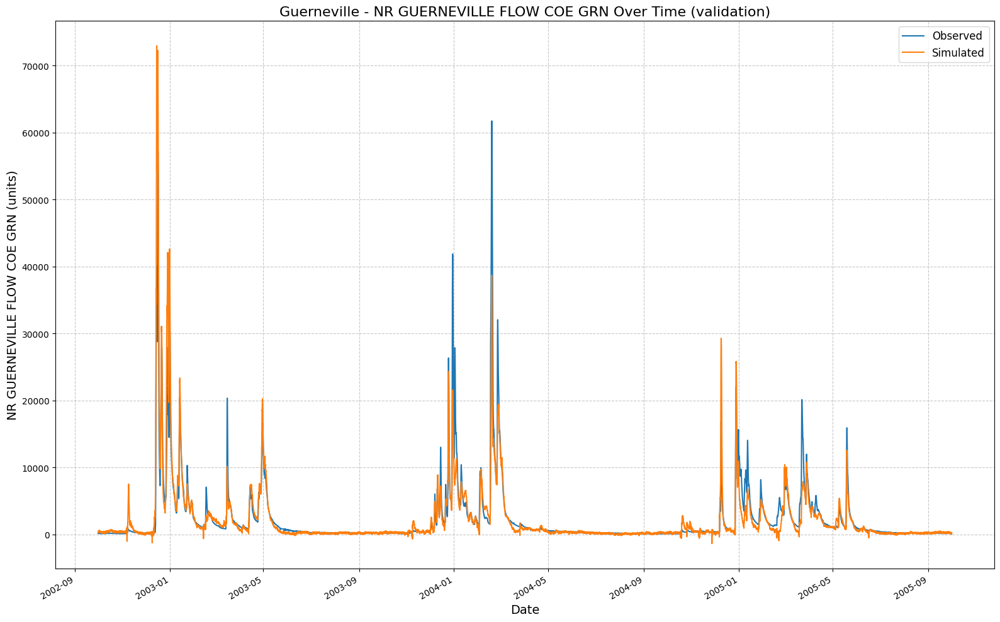

[INFO] CSV output saved at: c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_132747\results_output_validation.csv


c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


In [23]:
if not skip_best_model_train:
    lstmNoPhysicsValBest = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,
        hyperparams=best_no_physics_params,
        input_features=None,
        physics_informed=False,
        physics_data_file=None,
        hourly=True,
        extend_train_period=False,
        gpu=0
    )
    lstmNoPhysicsValBest.train()
    no_physics_val_csv, no_physics_val_metrics = lstmNoPhysicsValBest.results()
    no_physics_val_metrics

2025-03-13 13:35:13,846: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_133513\output.log initialized.
2025-03-13 13:35:13,847: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_133513
2025-03-13 13:35:13,847: ### Run configurations for testing_run
2025-03-13 13:35:13,848: experiment_name: testing_run
2025-03-13 13:35:13,848: train_basin_file: guerneville
2025-03-13 13:35:13,849: validation_basin_file: guerneville
2025-03-13 13:35:13,849: test_basin_file: guerneville
2025-03-13 13:35:13,849: train_start_date: 1994-10-01 00:00:00
2025-03-13 13:35:13,850: train_end_date: 2002-09-30 00:00:00
2025-03-13 13:35:13,850: validation_start_date: 2002-10-01 00:00:00
2025-03-13 13:35:13,851: validation_end_date: 2005-09-30 00:00:00
2025-03-13 13:35:13,851: test_start_date: 2005-10-01 00:00:00
2025-03-13 13:35:13,852: test_end_date: 2009-09-29 00:

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this

# Validation: 100%|██████████| 1/1 [00:07<00:00,  7.88s/it]
2025-03-13 13:39:06,431: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_133513\validation\model_epoch032\validation_metrics.csv
2025-03-13 13:39:06,432: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_133513\validation\model_epoch032\validation_results.p
got predictions


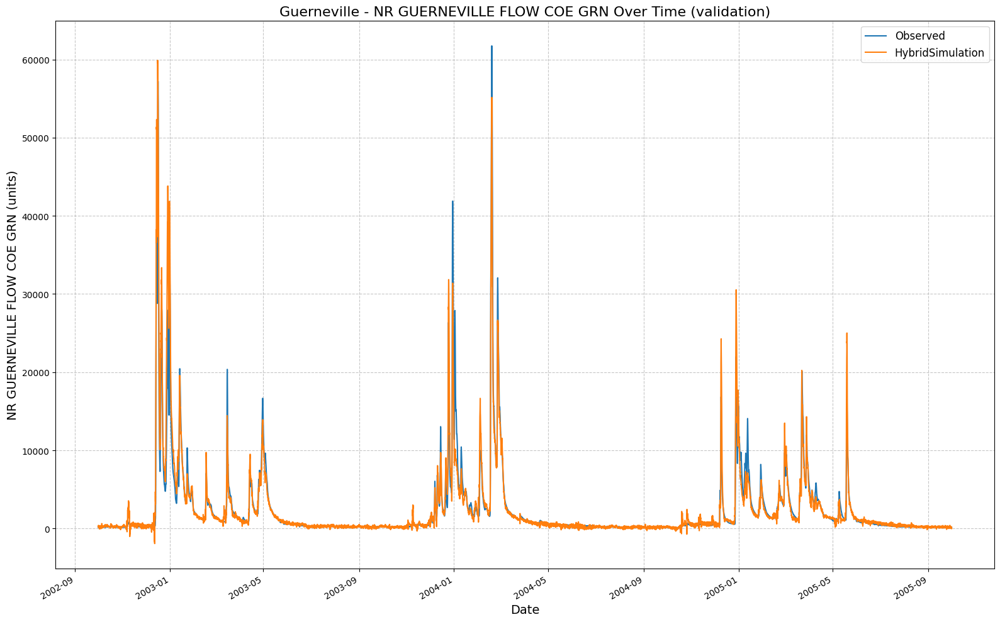

[INFO] CSV output saved at: c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_133513\results_output_validation.csv


c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


In [24]:
if not skip_best_model_train:
    lstmPhysicsValBest = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,
        hyperparams=best_physics_params,
        input_features=features_with_physics,
        physics_informed=True,
        physics_data_file=path_to_physics_data,
        hourly=True,
        extend_train_period=False,
        gpu=0
    )
    lstmPhysicsValBest.train()
    physics_val_csv, physics_val_metrics = lstmPhysicsValBest.results()
    physics_val_metrics

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\UCB_training\UCB_utils.py:61: DtypeWarning: Columns (0,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81) have mixed types. Specify dtype option on import or set low_memory=False.
  hms_df = pd.read_csv(HMS_results)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a fut

[INFO] Wrote metrics CSV: CV_guerneville_hourly_val_metrics.csv
[INFO] Saved figure: CV_guerneville_hourly_val_model_comparison.png


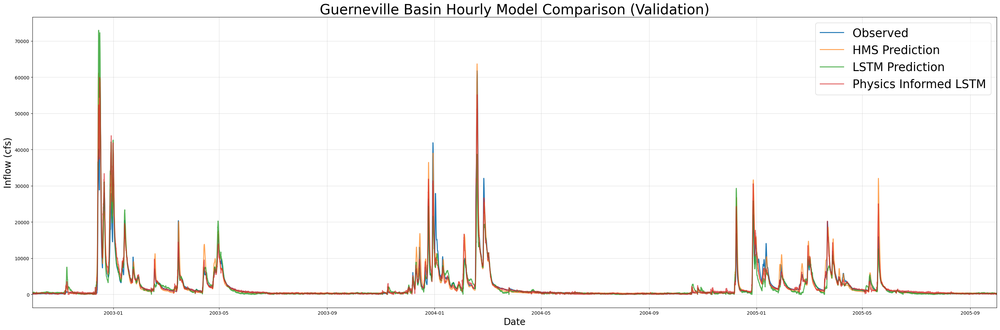

In [25]:
if not skip_best_model_train:
    combinedPlot(
        lstm_results=no_physics_val_csv,
        lstmPhysics_results=physics_val_csv,
        HMS_results=path_to_physics_data,
        title="Guerneville Basin Hourly Model Comparison (Validation)",
        fName="CV_guerneville_hourly_val_metrics.csv",
        plot_filename="CV_guerneville_hourly_val_model_comparison.png",
        timeseries_filename ="CV_guerneville_hourly_val_combined_ts.csv"
    )
else:
    combined_df = pd.read_csv("CV_guerneville_hourly_val_combined_ts.csv")
    combinedPlotFromDf(combined_df, title="Guerneville Basin Hourly Model Comparison (Validation)", fName="CV_guerneville_hourly_val_metrics.csv")

In [26]:
if not skip_best_model_train:
    fancyCombinedPlot(
        lstm_results=no_physics_val_csv,
        lstmPhysics_results=physics_val_csv,
        HMS_results=path_to_physics_data,
        title='Guerneville Basin Hourly Model Comparison (Validation)',
        fName="CV_guerneville_hourly_val_metrics.csv",
        timeseries_filename ="CV_guerneville_hourly_val_combined_ts.csv"
    )
else:
    fancyCombinedPlotFromDf(combined_df, title='Guerneville Basin Hourly Model Comparison (Validation)', fName="CV_guerneville_hourly_val_metrics.csv")

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\UCB_training\UCB_utils.py:129: DtypeWarning: Columns (0,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81) have mixed types. Specify dtype option on import or set low_memory=False.
  hms_df = pd.read_csv(HMS_results)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a fu

[INFO] Wrote metrics CSV: CV_guerneville_hourly_val_metrics.csv


In [27]:
if skip_best_model_train:
    val_metrics = pd.read_csv("CV_guerneville_hourly_val_metrics.csv", index_col=0)
    print(val_metrics)

### Re-run testing with the best hyperparameters

2025-03-13 13:39:15,758: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_133915\output.log initialized.
2025-03-13 13:39:15,759: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_133915
2025-03-13 13:39:15,760: ### Run configurations for testing_run
2025-03-13 13:39:15,760: experiment_name: testing_run
2025-03-13 13:39:15,760: train_basin_file: guerneville
2025-03-13 13:39:15,761: validation_basin_file: guerneville
2025-03-13 13:39:15,761: test_basin_file: guerneville
2025-03-13 13:39:15,762: train_start_date: 1994-10-01 00:00:00
2025-03-13 13:39:15,762: train_end_date: 2005-09-30 00:00:00
2025-03-13 13:39:15,762: validation_start_date: 2002-10-01 00:00:00
2025-03-13 13:39:15,763: validation_end_date: 2005-09-30 00:00:00
2025-03-13 13:39:15,763: test_start_date: 2005-10-01 00:00:00
2025-03-13 13:39:15,764: test_end_date: 2009-09-29 00:

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to thi

# Validation: 100%|██████████| 1/1 [00:03<00:00,  3.88s/it]
2025-03-13 13:49:35,818: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_133915\validation\model_epoch032\validation_metrics.csv
2025-03-13 13:49:35,820: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_133915\validation\model_epoch032\validation_results.p
2025-03-13 13:49:35,840: Using the model weights from c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_133915\model_epoch032.pt


c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to thi

# Evaluation: 100%|██████████| 1/1 [00:04<00:00,  4.94s/it]
2025-03-13 13:49:40,789: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_133915\test\model_epoch032\test_metrics.csv
2025-03-13 13:49:40,791: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_133915\test\model_epoch032\test_results.p
got predictions


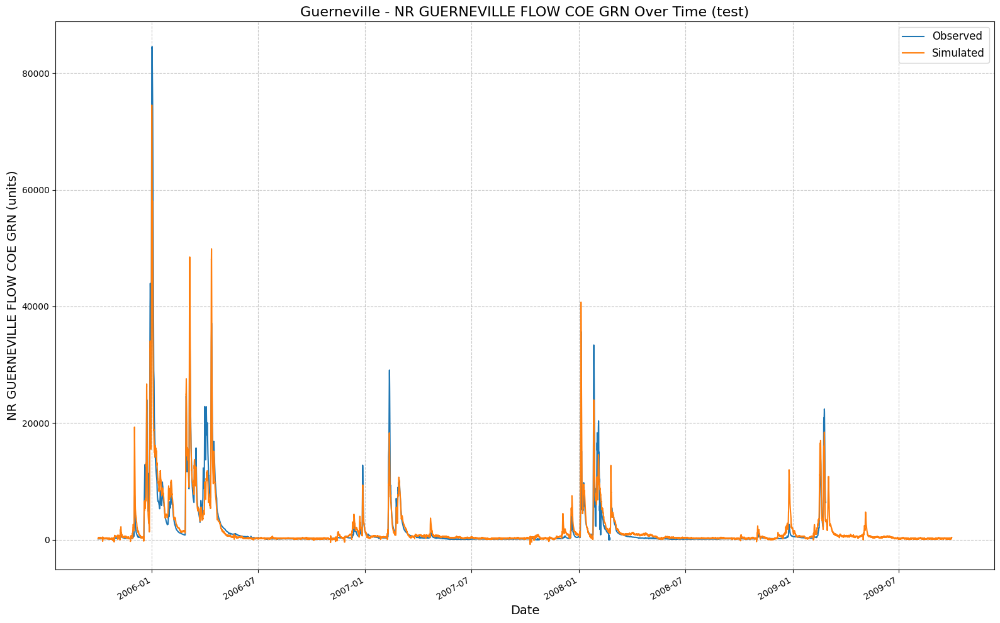

[INFO] CSV output saved at: c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_133915\results_output_test.csv


c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.



In [28]:
if not skip_best_model_train:
    lstmNoPhysicsExtBest = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,
        hyperparams=best_no_physics_params,
        input_features=None,
        physics_informed=False,
        physics_data_file=None,
        hourly=True,
        extend_train_period=True,  
        gpu=0
    )
    
    lstmNoPhysicsExtBest.train()
    no_physics_test_csv, no_physics_test_metrics = lstmNoPhysicsExtBest.results('test')
    no_physics_test_metrics

2025-03-13 13:49:41,270: Logging to c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_134941\output.log initialized.
2025-03-13 13:49:41,271: ### Folder structure created at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_134941
2025-03-13 13:49:41,272: ### Run configurations for testing_run
2025-03-13 13:49:41,272: experiment_name: testing_run
2025-03-13 13:49:41,273: train_basin_file: guerneville
2025-03-13 13:49:41,273: validation_basin_file: guerneville
2025-03-13 13:49:41,274: test_basin_file: guerneville
2025-03-13 13:49:41,274: train_start_date: 1994-10-01 00:00:00
2025-03-13 13:49:41,275: train_end_date: 2005-09-30 00:00:00
2025-03-13 13:49:41,275: validation_start_date: 2002-10-01 00:00:00
2025-03-13 13:49:41,275: validation_end_date: 2005-09-30 00:00:00
2025-03-13 13:49:41,276: test_start_date: 2005-10-01 00:00:00
2025-03-13 13:49:41,276: test_end_date: 2009-09-29 00:

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to thi

# Validation: 100%|██████████| 1/1 [00:07<00:00,  7.94s/it]
2025-03-13 13:54:56,569: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_134941\validation\model_epoch032\validation_metrics.csv
2025-03-13 13:54:56,571: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_134941\validation\model_epoch032\validation_results.p
2025-03-13 13:54:56,608: Using the model weights from c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_134941\model_epoch032.pt


c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\evaluation\tester.py:133: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to thi

# Evaluation: 100%|██████████| 1/1 [00:08<00:00,  8.55s/it]
2025-03-13 13:55:05,169: Stored metrics at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_134941\test\model_epoch032\test_metrics.csv
2025-03-13 13:55:05,171: Stored results at c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_134941\test\model_epoch032\test_results.p
got predictions


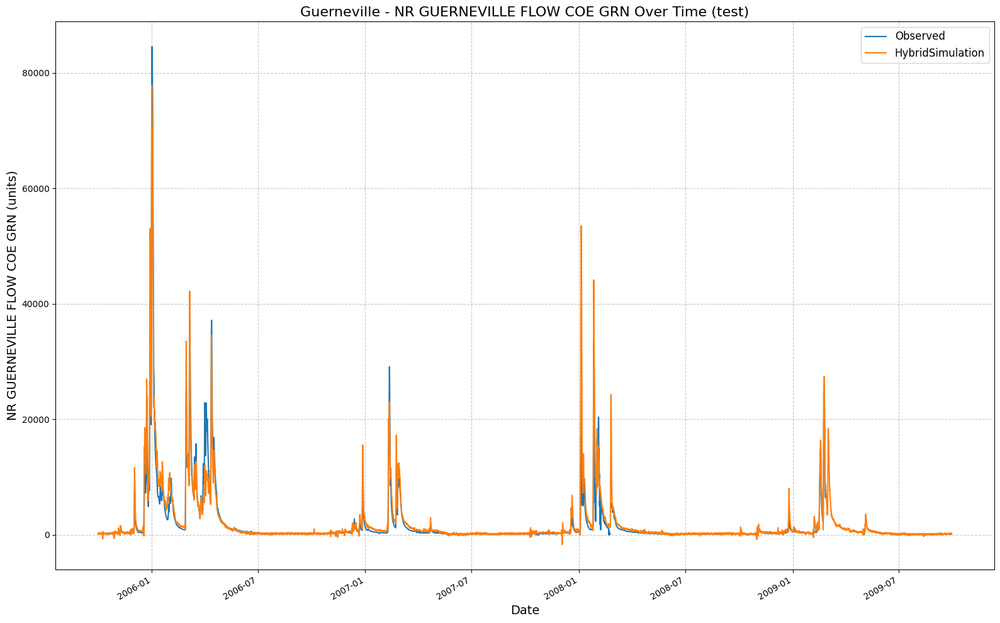

[INFO] CSV output saved at: c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\runs\testing_run_1303_134941\results_output_test.csv


c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.



In [29]:
if not skip_best_model_train:
    lstmPhysicsExtBest = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,
        hyperparams=best_physics_params,
        input_features=features_with_physics,
        physics_informed=True,
        physics_data_file=path_to_physics_data,
        hourly=True,
        extend_train_period=True,
        gpu=0
    )
    
    lstmPhysicsExtBest.train()
    physics_test_csv, physics_test_metrics = lstmPhysicsExtBest.results('test')
    physics_test_metrics

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\UCB_training\UCB_utils.py:61: DtypeWarning:

Columns (0,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81) have mixed types. Specify dtype option on import or set low_memory=False.

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.

c:\Users\arman\ucb-us

[INFO] Wrote metrics CSV: CV_guerneville_hourly_test_metrics.csv
[INFO] Saved figure: CV_guerneville_hourly_test_model_comparison.png


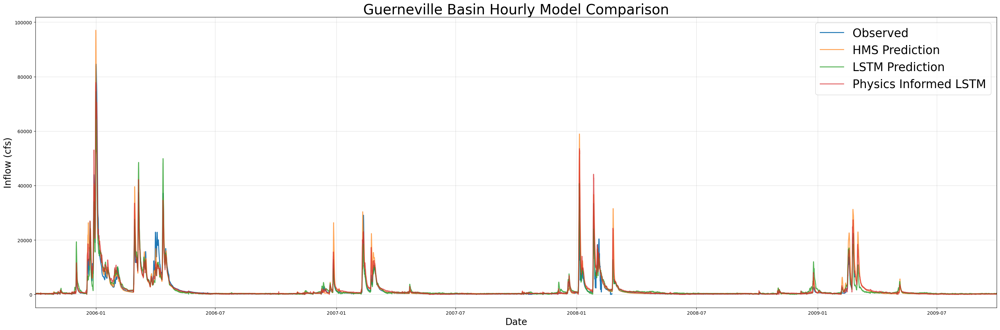

In [30]:
if not skip_best_model_train:
    combinedPlot(
        lstm_results=no_physics_test_csv,
        lstmPhysics_results=physics_test_csv,
        HMS_results=path_to_physics_data,
        title="Guerneville Basin Hourly Model Comparison",
        fName="CV_guerneville_hourly_test_metrics.csv",
        plot_filename="CV_guerneville_hourly_test_model_comparison.png",
        timeseries_filename ="CV_guerneville_hourly_test_combined_ts.csv"
    )
else:
    combined_df = pd.read_csv("CV_guerneville_hourly_test_combined_ts.csv")
    combinedPlotFromDf(combined_df, title="Guerneville Basin Hourly Model Comparison", fName="CV_guerneville_hourly_test_metrics.csv")

In [31]:
if not skip_best_model_train:
    fancyCombinedPlot(lstm_results=no_physics_test_csv, lstmPhysics_results= physics_test_csv, HMS_results=path_to_physics_data, title='Guerneville Basin Hourly Model Comparison', fName = "guerneville_hourly_test_metrics.csv", timeseries_filename ="guerneville_hourly_test_combined_ts.csv")
else:
    fancyCombinedPlotFromDf(combined_df, title='Guerneville Basin Hourly Model Comparison', fName = "guerneville_hourly_test_metrics.csv")

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\UCB_training\UCB_utils.py:129: DtypeWarning:

Columns (0,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81) have mixed types. Specify dtype option on import or set low_memory=False.

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:339: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

c:\Users\arman\ucb-usace-lstm\UCB-USACE-LSTMs\UCB_training\models\guerneville_all\..\..\..\..\UCB-USACE-LSTMs\neuralhydrology\datautils\utils.py:382: FutureWarning:

'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.

c:\Users\arman\ucb-u

[INFO] Wrote metrics CSV: guerneville_hourly_test_metrics.csv


In [32]:
if skip_best_model_train:
    test_metrics = pd.read_csv("CV_guerneville_hourly_test_metrics.csv", index_col=0)
    print(test_metrics)